In [1]:
# w = 15 로 돌려보자
# lr = 0.0001
# lambda_1 = 1
# h = 64
# loss 0.7밑으로 안내려갑니다...

# temporal lstm을 multi-head attention으로 구현해보자

In [2]:
# 모듈 import
from datetime import datetime
import numpy as np
import os
import pandas as pd

#from google.colab import drive
#drive.mount('/content/gdrive')
#os.chdir('/content/gdrive/MyDrive/python/python_dong/data_axis_transform1')

import torch
import torch.nn as nn
from torch import optim
import torch.nn.functional as F
from torch.autograd import Variable

#!pip install torchmetrics
import torchmetrics

#!pip install torchinfo
from torchinfo import summary

import matplotlib.pyplot as plt
import math


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")



# 1. 데이터 전처리

In [3]:
# data path 지정
raw_data_path = './data/stocknet-dataset/price/raw'

if 'stocknet' in raw_data_path:
    tra_date = '2014-01-02'
    val_date = '2015-08-03'
    tes_date = '2015-10-01'
    end_date = '2015-12-31'
elif 'kdd17' in raw_data_path:
    tra_date = '2007-01-03'
    val_date = '2015-01-02'
    tes_date = '2016-01-04'
    end_date = '2016-12-31'
else:
    print('unexpected path: %s' % raw_data_path)

# os.path.isfile : 파일이 있는지 없는 지 체크
# os.path.join(data_path, fname) : 폴더 디렉터리와 fname(stockname.csv) 붙임
fnames = [fname for fname in os.listdir(raw_data_path) if
            os.path.isfile(os.path.join(raw_data_path,fname))]

COLUMNS_FEATURE_DATA_V1 = ['open_close_ratio', 'high_close_ratio', 
                           'low_close_ratio', 'close_lastclose_ratio', 
                           'adjclose_lastadjclose_ratio', 'close_ma5_ratio', 
                           'close_ma10_ratio', 'close_ma15_ratio', 'close_ma20_ratio', 
                           'close_ma25_ratio', 'close_ma30_ratio']

ver = 'v1' # ver in ['v1', 'v2']
if ver == 'v1':
    COLUMNS_FEATURE = COLUMNS_FEATURE_DATA_V1

In [4]:
windows = [5,10,15,20,25,30]

def preprocess(df, windows):
   '''
   전처리 함수 역할 : 전체 feature생성하여 df column에 추가
   '''
   data = df
   data['open_close_ratio'] = data['Open'] / data['Close'] - 1
   data['high_close_ratio'] = data['High'] / data['Close'] - 1
   data['low_close_ratio'] = data['Low'] / data['Close'] - 1

   data['close_lastclose_ratio'] = np.zeros(len(data))
   data.loc[1:, 'close_lastclose_ratio'] = data['Close'][1:].values / data['Close'][:-1].values - 1

   data['adjclose_lastadjclose_ratio'] = np.zeros(len(data))
   data.loc[1:, 'adjclose_lastadjclose_ratio'] = data['Adj Close'][1:].values / data['Adj Close'][:-1].values - 1

   for window in windows:
      data[f'close_ma{window}_ratio'] = data['Adj Close'].rolling(window).mean()/data['Adj Close'] - 1
   
   data['label'] = np.append((data['Close'][1:].values > data['Close'][:-1].values)*1,0)

   return data

In [5]:
feature_data_path = './data/stocknet-dataset/price/feature'

for fname in fnames:
   if not os.path.isfile(os.path.join(feature_data_path,fname)):
      df_raw = pd.read_csv(os.path.join(raw_data_path,fname))
      data = preprocess(df_raw, windows)

      # 폴더 없으면 생성
      try:
         if not os.path.exists(feature_data_path):
            os.makedirs(feature_data_path)
      except OSError:
         print ('Error: Creating directory. ' +  feature_data_path)

      #csv 파일 저장
      data.to_csv(os.path.join(feature_data_path,fname))



# train, validation, test data 나누기

## 1. input data 3차원으로 쌓기
shape = (stock 종류수, date, feature)



요건
1. 모든 티커 데이터의 date가 맞는지?
2. 결측치는 없는지?
3. 티커와 데이터 메치 가능해야함

In [6]:
raw_data_path = './data/stocknet-dataset/price/raw'


tra_data_X = []
tra_data_Y = []
val_data_X = []
val_data_Y = []
test_data_X = []
test_data_Y = []
tickers = []

cnt = 0
fail_cnt = 0

fnames = [fname for fname in os.listdir(raw_data_path) if
            os.path.isfile(os.path.join(raw_data_path,fname))]

for fname in fnames:

    df = pd.read_csv(os.path.join(raw_data_path,fname))
    data = preprocess(df, windows)

    learning_data = data[(data['Date'] >= tra_date) & (data['Date'] <= end_date)]['Date']
    tra_data_X_ticker = data[(data['Date'] >= tra_date) & (data['Date'] < val_date)][COLUMNS_FEATURE]
    # tra_data_Y_ticker = data[(data['Date'] >= tra_date) & (data['Date'] < val_date)]['adjclose_lastadjclose_ratio']
    tra_data_Y_ticker = data[(data['Date'] >= tra_date) & (data['Date'] < val_date)]['label']

    val_data_X_ticker = data[(data['Date'] >= val_date) & (data['Date'] < tes_date)][COLUMNS_FEATURE]
    #val_data_Y_ticker = data[(data['Date'] >= val_date) & (data['Date'] < tes_date)]['adjclose_lastadjclose_ratio']
    val_data_Y_ticker = data[(data['Date'] >= val_date) & (data['Date'] < tes_date)]['label'] 

    test_data_X_ticker = data[(data['Date'] >= tes_date) & (data['Date'] <= end_date)][COLUMNS_FEATURE]
    #test_data_Y_ticker = data[(data['Date'] >= tes_date) & (data['Date'] <= end_date)]['adjclose_lastadjclose_ratio']
    test_data_Y_ticker = data[(data['Date'] >= tes_date) & (data['Date'] <= end_date)]['label']


    if cnt == 0:
        target_dates = learning_data
    
    print('ticker : {}, date check : {}'.format(fname, np.array_equal(target_dates.values, learning_data.values)))
    if np.array_equal(target_dates.values, learning_data.values): 
        
        tra_data_X.append(tra_data_X_ticker.values)
        tra_data_Y.append(tra_data_Y_ticker.values)

        val_data_X.append(val_data_X_ticker.values)
        val_data_Y.append(val_data_Y_ticker.values)
        
        test_data_X.append(test_data_X_ticker.values)
        test_data_Y.append(test_data_Y_ticker.values)

        tickers.append(fname)
    else : 
        fail_cnt += 1
    
    cnt += 1

print(cnt, len(fnames))
print('fail_cnt :', fail_cnt)

# 마지막에 index 종목 넣기
raw_data_index_path = './data/stocknet-dataset/price/raw/index'

fname = os.listdir(raw_data_index_path)[0]

df = pd.read_csv(os.path.join(raw_data_index_path,fname))
data = preprocess(df, windows)

learning_data = data[(data['Date'] >= tra_date) & (data['Date'] <= end_date)]['Date']
tra_data_X_ticker = data[(data['Date'] >= tra_date) & (data['Date'] < val_date)][COLUMNS_FEATURE]
#tra_data_Y_ticker = data[(data['Date'] >= tra_date) & (data['Date'] < val_date)]['adjclose_lastadjclose_ratio']
tra_data_Y_ticker = data[(data['Date'] >= tra_date) & (data['Date'] < val_date)]['label']

val_data_X_ticker = data[(data['Date'] >= val_date) & (data['Date'] < tes_date)][COLUMNS_FEATURE]
#val_data_Y_ticker = data[(data['Date'] >= val_date) & (data['Date'] < tes_date)]['adjclose_lastadjclose_ratio']
val_data_Y_ticker = data[(data['Date'] >= val_date) & (data['Date'] < tes_date)]['label']

test_data_X_ticker = data[(data['Date'] >= tes_date) & (data['Date'] <= end_date)][COLUMNS_FEATURE]
#test_data_Y_ticker = data[(data['Date'] >= tes_date) & (data['Date'] <= end_date)]['adjclose_lastadjclose_ratio']
test_data_Y_ticker = data[(data['Date'] >= tes_date) & (data['Date'] <= end_date)]['label']

print('ticker : {}, date check : {}'.format(fname, np.array_equal(target_dates.values, learning_data.values)))
if np.array_equal(target_dates.values, learning_data.values):
    
    tra_data_X.append(tra_data_X_ticker.values)
    # tra_data_Y.append(tra_data_Y_ticker.values)

    val_data_X.append(val_data_X_ticker.values)
    # val_data_Y.append(val_data_Y_ticker.values)
    
    test_data_X.append(test_data_X_ticker.values)
    # test_data_Y.append(test_data_Y_ticker.values)

    tickers.append(fname)

# tra_data_X

ticker : AAPL.csv, date check : True
ticker : ABB.csv, date check : True
ticker : ABBV.csv, date check : True
ticker : AEP.csv, date check : True
ticker : AGFS.csv, date check : False
ticker : AMGN.csv, date check : True
ticker : AMZN.csv, date check : True
ticker : BA.csv, date check : True
ticker : BABA.csv, date check : False
ticker : BAC.csv, date check : True
ticker : BBL.csv, date check : True
ticker : BCH.csv, date check : True
ticker : BHP.csv, date check : True
ticker : BP.csv, date check : True
ticker : BRK-A.csv, date check : True
ticker : BSAC.csv, date check : True
ticker : BUD.csv, date check : True
ticker : C.csv, date check : True
ticker : CAT.csv, date check : True
ticker : CELG.csv, date check : True
ticker : CHL.csv, date check : True
ticker : CHTR.csv, date check : True
ticker : CMCSA.csv, date check : True
ticker : CODI.csv, date check : True
ticker : CSCO.csv, date check : True
ticker : CVX.csv, date check : True
ticker : D.csv, date check : True
ticker : DHR.csv,

In [7]:
def list_to_tensor(list_):
    return torch.Tensor(np.array(list_))

In [8]:
tensor_tra_data_X = list_to_tensor(tra_data_X)
tensor_tra_data_Y = list_to_tensor(tra_data_Y).view((len(tra_data_Y),-1,1))
tensor_val_data_X = list_to_tensor(val_data_X)
tensor_val_data_Y = list_to_tensor(val_data_Y).view((len(val_data_Y),-1,1))
tensor_test_data_X = list_to_tensor(test_data_X)
tensor_test_data_Y = list_to_tensor(test_data_Y).view((len(test_data_Y),-1,1))

## Hyperparameter setting

In [9]:
w = 15 # window size w in {10, 15}
beta = 0.1 # market context weight beta in {0.01, 0.1, 1}
h = 64 # hidden layer size h in {64, 128}
learning_rate = 0.0001 # in {0.001, 0.0001}
lambda_1 = 1 # selective regularzation lambda = 1
drop_rate = 0.15
feature_size = len(COLUMNS_FEATURE)

In [10]:
class Feature_transformation_layer(nn.Module):
    """Feature transformation layer in DTML"""

    def __init__(self, feature_size, h):
        super(Feature_transformation_layer, self).__init__()
        self.feature_size = feature_size
        self.h = h

        self.linear = nn.Linear(self.feature_size, self.h)
    
    def forward(self, X):
        output = torch.tanh(self.linear(X))
        return output

In [11]:
def layer_normalization(tensor):
    h = tensor.size()[-1]
    return (tensor - torch.std_mean(tensor, dim=1, unbiased=False)[1].repeat((h,1)).transpose(-2,-1))/torch.std_mean(tensor, dim=1, unbiased=False)[0].repeat((h,1)).transpose(-2,-1)

In [12]:
class Nonlinear_transformation(nn.Module):
    """Nonlinear transformation in DTML"""

    def __init__(self, h):
        super(Nonlinear_transformation, self).__init__()
        self.h = h


        self.mlp1 = nn.Linear(self.h, self.h * 4)
        self.mlp2 = nn.Linear(self.h * 4, h)
    
    def forward(self, H, H_tilda, on_train=True):
        H_p = H + H_tilda
        H_p = self.mlp1(H_p)
        H_p = nn.ReLU()(H_p)
        H_p = self.mlp2(H_p)
        H_p = H + H_tilda + H_p
        H_p = nn.Tanh()(H_p)

        # dropout and layer normalization
        if on_train == True:
            H_p = nn.Dropout(p=drop_rate)(H_p)
        H_p = layer_normalization(H_p)
        return H_p

In [13]:
class Final_prediction(nn.Module):
    """final prediction in DTML"""

    def __init__(self, h):
        super(Final_prediction, self).__init__()
        self.h = h

        self.pred_linear = nn.Linear(h,1)
    
    def forward(self, H_p):
        y_hat = self.pred_linear(H_p)
        y_hat = nn.Sigmoid()(y_hat).view((-1))

        return y_hat

In [82]:
class DTML(nn.Module):
    ''' DTML '''

    def __init__(self, X, y, w, h, beta, vali_X, vali_y, test_X, test_y,
                 batch_size,
                 learning_rate, epochs):
        """ Initialize """
        super(DTML, self).__init__()
        self.X = X
        self.y = y
        self.vali_X = vali_X
        self.vali_y = vali_y
        self.test_X = test_X
        self.test_y = test_y
        self.w = w
        self.h = h
        self.beta = beta
        self.batch_size = batch_size
        self.learning_rate = learning_rate
        self.epochs = epochs
        self.train_timesteps = train_timesteps = int(X.size()[1]) - w

        self.device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
        print("==> Use accelerator : ", self.device)

        self.Feature_transformation_layer = Feature_transformation_layer(feature_size=self.X.size()[-1],
                                                                         h=self.h)
        
        # 티커별로 lstm 층 개별로 만들기
        #for i in range(self.X.size()[0]): # 마지막은 index용 lstm
        #    self._modules['lstm_{}'.format(i)] = nn.LSTM(input_size = self.h, hidden_size=self.h, batch_first=True)
        
        # temporal lstm을 multi-head attention 층으로 구현해보자.
        for i in range(self.X.size()[0]): # 마지막은 index용 lstm
            self._modules['multihead_attn_{}'.format(i)] = nn.MultiheadAttention(embed_dim = self.h, num_heads=1, dropout=0, batch_first=True)


        # ticker별로 linear layer 생성
        for i in range(self.X.size()[0]):
            self._modules['ContextNormalLinearLayer_{}'.format(i)] = nn.Linear(h, h)

        self.multihead_attn = nn.MultiheadAttention(embed_dim=self.h, num_heads=8, dropout=drop_rate, batch_first=True)
        self.query_layer = nn.Linear(self.h, self.h)
        self.key_layer = nn.Linear(self.h, self.h)
        self.value_layer = nn.Linear(self.h, self.h)

        self.Nonlinear_transformation = Nonlinear_transformation(h=self.h)

        self.Final_prediction = Final_prediction(h=self.h)
        print(len(list(self.parameters())))

        # Loss funciton
        self.criterion = nn.BCELoss()

        self.optimizer = optim.Adam(params=filter(lambda p:p.requires_grad, self.parameters()), lr=self.learning_rate)

    def window_(self, tensor, time_idx, window_size):
        # tensor size = (ticker_number, dates, feature_size)    
        return tensor[:, time_idx:time_idx + self.w, :]


    def train(self):
        mode = 'train'
        if mode == 'train':
            X = self.X
            y_data = self.y
            epochs = self.epochs
        elif mode == 'validation':
            X = self.vali_X
            y_data = self.vali_y
            epochs = 1
        
        elif mode == 'test':
            X = self.test_X
            y_data = self.test_y
            epochs = 1

        else:
            print('유효하지 않는 mode입니다.')
            

        timesteps = int(X.size()[1]) - w

        """training process"""
        # epoch당 iteration 수
        iter_per_epoch = int(np.ceil(timesteps * 1. / self.batch_size))
        # 전체 iteration에서 loss (전체 iteration 수 = epoch수 * epoch당 iteration 수)
        self.iter_losses = np.zeros(epochs * iter_per_epoch)
        self.iter_acc = np.zeros(epochs * iter_per_epoch)
        self.iter_mcc = np.zeros(epochs * iter_per_epoch)
        self.iter_precision = np.zeros(epochs * iter_per_epoch)
        self.return_rate = np.zeros((epochs, timesteps)) # batch_size 관련해서 수정필요
        self.index_return_rate = np.zeros((epochs, timesteps)) # batch_size 관련해서 수정필요
        self.com_return_rate = np.zeros((epochs, timesteps)) # batch_size 관련해서 수정필요
        self.index_com_return_rate = np.zeros((epochs, timesteps))

        # epoch당 loss
        self.epoch_losses = np.zeros(epochs)
        self.epoch_acc = np.zeros(epochs)
        self.epoch_mcc = np.zeros(epochs)
        self.epoch_precision = np.zeros(epochs)

        # epoch당 loss (Validation)
        self.vali_epoch_losses = np.zeros(epochs)
        self.vali_epoch_acc = np.zeros(epochs)
        self.vali_epoch_mcc = np.zeros(epochs)
        self.vali_epoch_precision = np.zeros(epochs)

        vali_timesteps = int(self.vali_X.size()[1]) - w

        """training process"""
        # epoch당 iteration 수
        vali_iter_per_epoch = int(np.ceil(vali_timesteps * 1. / self.batch_size))
        # 전체 iteration에서 loss (전체 iteration 수 = epoch수 * epoch당 iteration 수)
        self.vali_iter_losses = np.zeros(epochs * vali_iter_per_epoch)
        self.vali_iter_acc = np.zeros(epochs * vali_iter_per_epoch)
        self.vali_iter_mcc = np.zeros(epochs * vali_iter_per_epoch)
        self.vali_iter_precision = np.zeros(epochs * vali_iter_per_epoch)
        self.vali_return_rate = np.zeros((epochs, vali_timesteps)) # batch_size 관련해서 수정필요
        self.vali_index_return_rate = np.zeros((epochs, vali_timesteps)) # batch_size 관련해서 수정필요
        self.vali_com_return_rate = np.zeros((epochs, vali_timesteps)) # batch_size 관련해서 수정필요
        self.vali_index_com_return_rate = np.zeros((epochs, vali_timesteps))

        train_n_iter = 0

        for epoch in range(self.epochs):
            time_idx = 0
            com_return_rate = 1
            index_com_return_rate = 1
            output = self.Feature_transformation_layer(X)

            while (time_idx < timesteps):
                #print('time_idx : {}, train_timesteps : {}'.format(time_idx, self.train_timesteps))
                
                Z_tilda = self.window_(output, time_idx=time_idx, window_size=self.w)
                tra_data_Y_w = self.window_(y_data, time_idx=time_idx, window_size=self.w)

                

                '''
                # hidden state ticker별 쌓기
                H_n = torch.Tensor().new_zeros((X.size()[0],w,h)) # +1은 index

                for ticker_idx in range(X.size()[0]):
                    # print('ticker_idx', ticker_idx)
                    i = 0
                    z_tilda = Z_tilda[ticker_idx,:,:].view(1,Z_tilda.size()[1], Z_tilda.size()[2])
                    lstm_output, (h_n, c_n) = self._modules['lstm_{}'.format(ticker_idx)](z_tilda[:,i,:].view(1,1,Z_tilda.size()[2]))
                    H_n[ticker_idx,0,:] = h_n
                    for i in range(1,w):
                        lstm_output, (h_n, c_n) = self._modules['lstm_{}'.format(ticker_idx)](z_tilda[:,i,:].view(1,1,Z_tilda.size()[2]), (h_n, c_n))
                        H_n[ticker_idx,i,:] = h_n

                H_n_dot = torch.Tensor().new_zeros((X.size()[0],self.w)) # 알파_i 계산하기전 ticker별로 dot(h_i, h_T) 계산
                # size (len(tickers), window_size w)
                # https://pytorch.org/docs/stable/generated/torch.matmul.html
                # torch.mul broadcasting 볼수 있음
                for i in range(X.size()[0]):
                    H_n_dot[i,:] = torch.matmul(H_n[i], H_n[i][-1])

                # https://pytorch.org/docs/stable/generated/torch.nn.Softmax.html
                Alpha = nn.Softmax(dim=1)(torch.exp(H_n_dot))

                H_n_tilde = torch.Tensor().new_zeros((X.size()[0], self.h))
                for i in range(self.X.size()[0]):
                    H_n_tilde[i,:] = torch.matmul(H_n[i].transpose(-2,-1), Alpha[i])
                '''
                
                H_n_tilde = torch.Tensor().new_zeros((X.size()[0], self.h))
                for ticker_idx in range(X.size()[0]):
                    z_tilda = Z_tilda[ticker_idx,:,:].view(1,Z_tilda.size()[1], Z_tilda.size()[2])

                       
                    H_n_tilde[ticker_idx,:], attn_output_weights = self._modules['multihead_attn_{}'.format(ticker_idx)](query=z_tilda[:,-1,:].view(1,1,z_tilda.size()[2]), 
                    key=z_tilda.view(1,z_tilda.size()[1],z_tilda.size()[2]), 
                    value=z_tilda.view(1,z_tilda.size()[1],z_tilda.size()[2]))

                
                pre_H_c_n = layer_normalization(H_n_tilde)
                

                H_c_n = torch.Tensor().new_zeros(X.size()[0], self.h)
                for i in range(X.size()[0]):
                    H_c_n[i,:]= self._modules['ContextNormalLinearLayer_{}'.format(i)](pre_H_c_n[i])

                H = H_c_n + self.beta*H_c_n[-1]
                H = H[:-1] # 마지막 index context vector 제외


                H_tilda, attn_output_weights = self.multihead_attn(query=H.view([1,H.size()[0], H.size()[1]]), key=H.view([1,H.size()[0], H.size()[1]]), value=H.view([1,H.size()[0], H.size()[1]]))
                H_tilda = H_tilda[0]
                #Q = self.query_layer(H)
                #K = self.key_layer(H)
                #V = self.value_layer(H)

                # S 생성
                #S = torch.matmul(Q, K.transpose(-2,-1))
                #S = S/math.sqrt(h)
                #S = nn.Softmax(dim=1)(S)

                # H_tilda 생성
                #H_tilda = torch.matmul(S,V)

                # dropout and layer normailzation --> attention후, drop-out 하라고 논문에 있음
                #H_tilda = nn.Dropout(p=drop_rate)(H_tilda) -> multihead에 dropout 포함되어있습니다.
                H_tilda = layer_normalization(H_tilda)

                if mode == 'train':
                    H_p = self.Nonlinear_transformation(H, H_tilda, on_train=True)
                else:
                    H_p = self.Nonlinear_transformation(H, H_tilda, on_train=False)

                y_hat = self.Final_prediction(H_p)
                y = tra_data_Y_w[:,w-1,:].view((-1))

                if mode == 'train':
                    self.optimizer.zero_grad()

                ## Selective Regularization
                loss_reg = self.criterion(y_hat,y) + lambda_1*(torch.norm(list(self.Final_prediction.parameters())[0]).pow(2)
                                 + torch.norm(list(self.Final_prediction.parameters())[1]).pow(2))
                
                acc = torchmetrics.functional.accuracy(y_hat,y.int())
                mcc = torchmetrics.MatthewsCorrcoef(num_classes=2)(y_hat, y.int())
                precision = torchmetrics.Precision()(y_hat, y.int())
                return_rate = X[y_hat.topk(3)[1],time_idx + w,4].sum()*(1/3)
                # print(y_hat.topk(3)[1], X[y_hat.topk(3)[1],time_idx + w - 1,4], X[y_hat.topk(3)[1],time_idx + w,4])
                index_return_rate = X[-1, time_idx + w, 4]
                com_return_rate *= 1 + return_rate
                index_com_return_rate *= 1 + index_return_rate

                if mode == 'train':
                    loss_reg.backward(retain_graph=True)
                    self.optimizer.step()
              

                self.iter_losses[int(epoch * iter_per_epoch + time_idx / self.batch_size)] = loss_reg
                self.iter_acc[int(epoch * iter_per_epoch + time_idx / self.batch_size)] = acc
                self.iter_mcc[int(epoch * iter_per_epoch + time_idx / self.batch_size)] = mcc
                self.iter_precision[int(epoch * iter_per_epoch + time_idx / self.batch_size)] = precision
                self.return_rate[epoch, time_idx] = return_rate # batch_size 적용하면 수정해야함
                self.index_return_rate[epoch, time_idx] = index_return_rate
                self.com_return_rate[epoch, time_idx] = com_return_rate # batch_size 적용하면 수정해야함
                self.index_com_return_rate[epoch, time_idx] = index_com_return_rate # batch_size 적용하면 수정해야함    

                '''
                if time_idx % 1000 == 0:
                    print('epoch : ',epoch, "time_idx : ", time_idx, 
                          "loss_reg : ", loss_reg, 
                          "acc : ", acc, 
                          "mcc : ", mcc,
                          "precision : ", precision,
                          "return_rate", return_rate,
                          "com_return_rate", com_return_rate)
                '''
                

                time_idx += self.batch_size
                train_n_iter += 1                

                if train_n_iter % 100 == 0 and train_n_iter != 0:
                    for param_group in self.optimizer.param_groups:
                        param_group['lr'] = param_group['lr'] * 0.9
                
                ######### 공통부분 끝, 데이터 수집 시작

            self.epoch_losses[epoch] = np.mean(self.iter_losses[range(
                epoch * iter_per_epoch, (epoch + 1) * iter_per_epoch)])
            
            self.epoch_acc[epoch] = np.mean(self.iter_acc[range(
                epoch * iter_per_epoch, (epoch + 1) * iter_per_epoch)])
            
            self.epoch_mcc[epoch] = np.mean(self.iter_mcc[range(
                epoch * iter_per_epoch, (epoch + 1) * iter_per_epoch)])
            
            self.epoch_precision[epoch] = np.mean(self.iter_precision[range(
                epoch * iter_per_epoch, (epoch + 1) * iter_per_epoch)])

            plt.subplot(3,1,1)
            #plt.figure()
            plt.plot(range(timesteps), self.com_return_rate[epoch][:timesteps], label='portfolio')
            plt.plot(range(timesteps), self.index_com_return_rate[0][ : timesteps], label='index')
            plt.legend(loc='upper left')
            plt.ylabel('com_return_rate')

            plt.subplot(3,1,2)
            plt.plot(range(int(epoch * iter_per_epoch + time_idx / self.batch_size)), self.iter_losses[:int(epoch * iter_per_epoch + time_idx / self.batch_size)], label=mode)
            plt.legend(loc='upper left')
            plt.ylabel('loss_reg')

            plt.subplot(3,1,3)
            plt.plot(range(int(epoch * iter_per_epoch + time_idx / self.batch_size)), self.iter_acc[:int(epoch * iter_per_epoch + time_idx / self.batch_size)], label=mode)
            plt.legend(loc='upper left')
            plt.ylabel('iter_acc')

            plt.show()

            if epoch % 1 == 0:
                plt.subplot(2,1,1)
                plt.plot(range(epoch + 1), self.epoch_losses[:epoch + 1], label=mode)
                plt.legend(loc='upper left')
                plt.ylabel('loss_reg')

                plt.subplot(2,1,2)
                plt.plot(range(epoch + 1), self.epoch_acc[:epoch + 1], label=mode)
                plt.legend(loc='upper left')
                plt.ylabel('acc')

                plt.show()

            if epoch % 1 == 0:
                print("Epochs : ", epoch, "Iterations : ", train_n_iter,
                      "Loss : ", self.epoch_losses[epoch],
                      "ACC : ", self.epoch_acc[epoch],
                      "MCC : ", self.epoch_mcc[epoch],
                      "Precision : ", self.epoch_precision[epoch])
            
            if epoch % 1 == 0:
                self.validation(e=epoch)




            if epoch % 1 == 0:
                plt.subplot(2,1,1)
                plt.plot(range(epoch + 1), self.vali_epoch_losses[:epoch + 1], label='validation')
                plt.legend(loc='upper left')
                plt.ylabel('loss_reg')

                plt.subplot(2,1,2)
                plt.plot(range(epoch + 1), self.vali_epoch_acc[:epoch + 1], label='validation')
                plt.legend(loc='upper left')
                plt.ylabel('acc')

                plt.show()
    
    def validation(self , e):
        mode = 'validation'
        if mode == 'train':
            print('mode :', mode)
            X = self.X
            y_data = self.y
            epochs = self.epochs
        elif mode == 'validation':
            print('mode :', mode)
            X = self.vali_X
            y_data = self.vali_y
            epochs = 1
        
        elif mode == 'test':
            print('mode :', mode)
            X = self.test_X
            y_data = self.test_y
            epochs = 1

        else:
            print('유효하지 않는 mode입니다.')
            
        
        vali_timesteps = int(X.size()[1]) - w

        # epoch당 iteration 수
        vali_iter_per_epoch = int(np.ceil(vali_timesteps * 1. / self.batch_size))
        '''
        """training process"""
        # epoch당 iteration 수
        vali_iter_per_epoch = int(np.ceil(vali_timesteps * 1. / self.batch_size))
        # 전체 iteration에서 loss (전체 iteration 수 = epoch수 * epoch당 iteration 수)
        self.vali_iter_losses = np.zeros(epochs * vali_iter_per_epoch)
        self.vali_iter_acc = np.zeros(epochs * vali_iter_per_epoch)
        self.vali_iter_mcc = np.zeros(epochs * vali_iter_per_epoch)
        self.vali_iter_precision = np.zeros(epochs * vali_iter_per_epoch)
        self.vali_return_rate = np.zeros((epochs, vali_timesteps)) # batch_size 관련해서 수정필요
        self.vali_index_return_rate = np.zeros((epochs, vali_timesteps)) # batch_size 관련해서 수정필요
        self.vali_com_return_rate = np.zeros((epochs, vali_timesteps)) # batch_size 관련해서 수정필요
        self.vali_index_com_return_rate = np.zeros((epochs, vali_timesteps))
        '''
        '''
        # epoch당 loss
        self.vali_epoch_losses = np.zeros(epochs)
        self.vali_epoch_acc = np.zeros(epochs)
        self.vali_epoch_mcc = np.zeros(epochs)
        self.vali_epoch_precision = np.zeros(epochs)
        '''

        vali_n_iter = 0

        for epoch in range(epochs):
            time_idx = 0
            com_return_rate = 1
            index_com_return_rate = 1
            output = self.Feature_transformation_layer(X)

            while (time_idx < vali_timesteps):
                #print('time_idx : {}, train_timesteps : {}'.format(time_idx, self.train_timesteps))
                
                Z_tilda = self.window_(output, time_idx=time_idx, window_size=self.w)
                tra_data_Y_w = self.window_(y_data, time_idx=time_idx, window_size=self.w)

                '''
                # hidden state ticker별 쌓기
                H_n = torch.Tensor().new_zeros((X.size()[0],w,h)) # +1은 index


                for ticker_idx in range(X.size()[0]):
                    # print('ticker_idx', ticker_idx)
                    i = 0
                    z_tilda = Z_tilda[ticker_idx,:,:].view(1,Z_tilda.size()[1], Z_tilda.size()[2])
                    lstm_output, (h_n, c_n) = self._modules['lstm_{}'.format(ticker_idx)](z_tilda[:,i,:].view(1,1,Z_tilda.size()[2]))
                    H_n[ticker_idx,0,:] = h_n
                    for i in range(1,w):
                        lstm_output, (h_n, c_n) = self._modules['lstm_{}'.format(ticker_idx)](z_tilda[:,i,:].view(1,1,Z_tilda.size()[2]), (h_n, c_n))
                        H_n[ticker_idx,i,:] = h_n

                H_n_dot = torch.Tensor().new_zeros((X.size()[0],self.w)) # 알파_i 계산하기전 ticker별로 dot(h_i, h_T) 계산
                # size (len(tickers), window_size w)
                # https://pytorch.org/docs/stable/generated/torch.matmul.html
                # torch.mul broadcasting 볼수 있음
                for i in range(X.size()[0]):
                    H_n_dot[i,:] = torch.matmul(H_n[i], H_n[i][-1])

                # https://pytorch.org/docs/stable/generated/torch.nn.Softmax.html
                Alpha = nn.Softmax(dim=1)(torch.exp(H_n_dot))

                H_n_tilde = torch.Tensor().new_zeros((X.size()[0], self.h))
                for i in range(self.X.size()[0]):
                    H_n_tilde[i,:] = torch.matmul(H_n[i].transpose(-2,-1), Alpha[i])

                '''

                H_n_tilde = torch.Tensor().new_zeros((X.size()[0], self.h))
                for ticker_idx in range(X.size()[0]):
                    z_tilda = Z_tilda[ticker_idx,:,:].view(1,Z_tilda.size()[1], Z_tilda.size()[2])

                       
                    H_n_tilde[ticker_idx,:], attn_output_weights = self._modules['multihead_attn_{}'.format(ticker_idx)](query=z_tilda[:,-1,:].view(1,1,z_tilda.size()[2]), 
                    key=z_tilda.view(1,z_tilda.size()[1],z_tilda.size()[2]), 
                    value=z_tilda.view(1,z_tilda.size()[1],z_tilda.size()[2]))
                    
                pre_H_c_n = layer_normalization(H_n_tilde)

                H_c_n = torch.Tensor().new_zeros(X.size()[0], self.h)
                for i in range(X.size()[0]):
                    H_c_n[i,:]= self._modules['ContextNormalLinearLayer_{}'.format(i)](pre_H_c_n[i])

                H = H_c_n + self.beta*H_c_n[-1]
                H = H[:-1] # 마지막 index context vector 제외


                H_tilda, attn_output_weights = self.multihead_attn(query=H.view([1,H.size()[0], H.size()[1]]), key=H.view([1,H.size()[0], H.size()[1]]), value=H.view([1,H.size()[0], H.size()[1]]))
                H_tilda = H_tilda[0]
                #Q = self.query_layer(H)
                #K = self.key_layer(H)
                #V = self.value_layer(H)

                # S 생성
                #S = torch.matmul(Q, K.transpose(-2,-1))
                #S = S/math.sqrt(h)
                #S = nn.Softmax(dim=1)(S)

                # H_tilda 생성
                #H_tilda = torch.matmul(S,V)

                # dropout and layer normailzation --> attention후, drop-out 하라고 논문에 있음
                #H_tilda = nn.Dropout(p=drop_rate)(H_tilda) -> multihead에 dropout 포함되어있습니다.
                H_tilda = layer_normalization(H_tilda)

                if mode == 'train':
                    H_p = self.Nonlinear_transformation(H, H_tilda, on_train=True)
                else:
                    H_p = self.Nonlinear_transformation(H, H_tilda, on_train=False)

                y_hat = self.Final_prediction(H_p)
                y = tra_data_Y_w[:,w-1,:].view((-1))

                if mode == 'train':
                    self.optimizer.zero_grad()

                ## Selective Regularization
                loss_reg = self.criterion(y_hat,y) + lambda_1*(torch.norm(list(self.Final_prediction.parameters())[0]).pow(2)
                                 + torch.norm(list(self.Final_prediction.parameters())[1]).pow(2))
                
                acc = torchmetrics.functional.accuracy(y_hat,y.int())
                mcc = torchmetrics.MatthewsCorrcoef(num_classes=2)(y_hat, y.int())
                precision = torchmetrics.Precision()(y_hat, y.int())
                return_rate = X[y_hat.topk(3)[1],time_idx + w,4].sum()*(1/3)
                index_return_rate = X[-1, time_idx + w, 4]
                com_return_rate *= 1 + return_rate
                index_com_return_rate *= 1 + index_return_rate

                if mode == 'train':
                    loss_reg.backward(retain_graph=True)
                    self.optimizer.step()
              

                self.vali_iter_losses[int(e * vali_iter_per_epoch + time_idx / self.batch_size)] = loss_reg
                self.vali_iter_acc[int(e * vali_iter_per_epoch + time_idx / self.batch_size)] = acc
                self.vali_iter_mcc[int(e * vali_iter_per_epoch + time_idx / self.batch_size)] = mcc
                self.vali_iter_precision[int(e * vali_iter_per_epoch + time_idx / self.batch_size)] = precision
                self.vali_return_rate[e, time_idx] = return_rate # batch_size 적용하면 수정해야함
                self.vali_index_return_rate[e, time_idx] = index_return_rate
                self.vali_com_return_rate[e, time_idx] = com_return_rate # batch_size 적용하면 수정해야함
                self.vali_index_com_return_rate[e, time_idx] = index_com_return_rate # batch_size 적용하면 수정해야함    

                '''
                if time_idx % 1000 == 0:
                    print('epoch : ',epoch, "time_idx : ", time_idx, 
                          "loss_reg : ", loss_reg, 
                          "acc : ", acc, 
                          "mcc : ", mcc,
                          "precision : ", precision,
                          "return_rate", return_rate,
                          "com_return_rate", com_return_rate)
                '''
                

                time_idx += self.batch_size
                vali_n_iter += 1                

                '''
                if train_n_iter % 100 == 0 and train_n_iter != 0:
                    for param_group in self.optimizer.param_groups:
                        param_group['lr'] = param_group['lr'] * 0.9
                '''
                
                ######### 공통부분 끝, 데이터 수집 시작

            self.vali_epoch_losses[e] = np.mean(self.vali_iter_losses[range(
                e * vali_iter_per_epoch, (e + 1) * vali_iter_per_epoch)])
            
            self.vali_epoch_acc[e] = np.mean(self.vali_iter_acc[range(
                e * vali_iter_per_epoch, (e + 1) * vali_iter_per_epoch)])
            
            self.vali_epoch_mcc[e] = np.mean(self.vali_iter_mcc[range(
                e * vali_iter_per_epoch, (e + 1) * vali_iter_per_epoch)])
            
            self.vali_epoch_precision[e] = np.mean(self.vali_iter_precision[range(
                e * vali_iter_per_epoch, (e + 1) * vali_iter_per_epoch)])

            plt.subplot(3,1,1)
            #plt.figure()
            plt.plot(range(vali_timesteps), self.vali_com_return_rate[e][:vali_timesteps], label='portfolio')
            plt.plot(range(vali_timesteps), self.vali_index_com_return_rate[0][ : vali_timesteps], label='index')
            plt.legend(loc='upper left')
            plt.ylabel('com_return_rate')

            plt.subplot(3,1,2)
            plt.plot(range(int(e * vali_iter_per_epoch + time_idx / self.batch_size)), self.vali_iter_losses[:int(e * vali_iter_per_epoch + time_idx / self.batch_size)], label=mode)
            plt.legend(loc='upper left')
            plt.ylabel('loss_reg')

            plt.subplot(3,1,3)
            plt.plot(range(int(e * vali_iter_per_epoch + time_idx / self.batch_size)), self.vali_iter_acc[:int(e * vali_iter_per_epoch + time_idx / self.batch_size)], label=mode)
            plt.legend(loc='upper left')
            plt.ylabel('iter_acc')

            plt.show()



            if epoch % 1 == 0:
                print("Epochs : ", e, "Iterations : ", vali_n_iter,
                      "Loss : ", self.vali_epoch_losses[e],
                      "ACC : ", self.vali_epoch_acc[e],
                      "MCC : ", self.vali_epoch_mcc[e],
                      "Precision : ", self.vali_epoch_precision[e])
        
    
    def test(self):
        mode = 'test'
        if mode == 'train':
            print('mode :', mode)
            X = self.X
            y_data = self.y
            epochs = self.epochs
        elif mode == 'validation':
            print('mode :', mode)
            X = self.vali_X
            y_data = self.vali_y
            epochs = 1
        
        elif mode == 'test':
            print('mode :', mode)
            X = self.test_X
            y_data = self.test_y
            epochs = 1
        
        timesteps = int(self.test_X.size()[1]) - w
        epochs = 1
        # epoch당 iteration 수
        iter_per_epoch = int(np.ceil(timesteps * 1. / self.batch_size))
        # 전체 iteration에서 loss (전체 iteration 수 = epoch수 * epoch당 iteration 수)
        self.test_iter_losses = np.zeros(epochs * iter_per_epoch)
        self.test_iter_acc = np.zeros(epochs * iter_per_epoch)
        self.test_iter_mcc = np.zeros(epochs * iter_per_epoch)
        self.test_iter_precision = np.zeros(epochs * iter_per_epoch)
        self.test_return_rate = np.zeros((epochs, timesteps)) # batch_size 관련해서 수정필요
        self.test_index_return_rate = np.zeros((epochs, timesteps))
        self.test_com_return_rate = np.zeros((epochs, timesteps)) # batch_size 관련해서 수정필요
        self.test_index_com_return_rate = np.zeros((epochs, timesteps))

        # epoch당 loss
        self.test_epoch_losses = np.zeros(epochs)
        self.test_epoch_acc = np.zeros(epochs)
        self.test_epoch_mcc = np.zeros(epochs)
        self.test_epoch_precision = np.zeros(epochs)

        n_iter = 0

        for epoch in range(epochs):
            time_idx = 0
            com_return_rate = 1
            index_com_return_rate = 1
            output = self.Feature_transformation_layer(X)

            while (time_idx < timesteps): # test끝으로 바꿔야함
                #print('time_idx : {}, train_timesteps : {}'.format(time_idx, self.train_timesteps))
                
                Z_tilda = self.window_(output, time_idx=time_idx, window_size=self.w)
                tra_data_Y_w = self.window_(y_data, time_idx=time_idx, window_size=self.w)
                
                '''
                # hidden state ticker별 쌓기
                H_n = torch.Tensor().new_zeros((self.test_X.size()[0],w,h)) # +1은 index

                for ticker_idx in range(self.test_X.size()[0]):
                    # print('ticker_idx', ticker_idx)
                    i = 0
                    z_tilda = Z_tilda[ticker_idx,:,:].view(1,Z_tilda.size()[1], Z_tilda.size()[2])
                    lstm_output, (h_n, c_n) = self._modules['lstm_{}'.format(ticker_idx)](z_tilda[:,i,:].view(1,1,Z_tilda.size()[2]))
                    H_n[ticker_idx,0,:] = h_n
                    for i in range(1,w):
                        lstm_output, (h_n, c_n) = self._modules['lstm_{}'.format(ticker_idx)](z_tilda[:,i,:].view(1,1,Z_tilda.size()[2]), (h_n, c_n))
                        H_n[ticker_idx,i,:] = h_n

                H_n_dot = torch.Tensor().new_zeros((self.test_X.size()[0],self.w)) # 알파_i 계산하기전 ticker별로 dot(h_i, h_T) 계산
                # size (len(tickers), window_size w)
                # https://pytorch.org/docs/stable/generated/torch.matmul.html
                # torch.mul broadcasting 볼수 있음
                for i in range(self.test_X.size()[0]):
                    H_n_dot[i,:] = torch.matmul(H_n[i], H_n[i][-1])

                # https://pytorch.org/docs/stable/generated/torch.nn.Softmax.html
                Alpha = nn.Softmax(dim=1)(torch.exp(H_n_dot))

                H_n_tilde = torch.Tensor().new_zeros((self.test_X.size()[0], self.h))
                for i in range(self.test_X.size()[0]):
                    H_n_tilde[i,:] = torch.matmul(H_n[i].transpose(-2,-1), Alpha[i])
                '''
                H_n_tilde = torch.Tensor().new_zeros((X.size()[0], self.h))
                for ticker_idx in range(X.size()[0]):
                    z_tilda = Z_tilda[ticker_idx,:,:].view(1,Z_tilda.size()[1], Z_tilda.size()[2])

                       
                    H_n_tilde[ticker_idx,:], attn_output_weights = self._modules['multihead_attn_{}'.format(ticker_idx)](query=z_tilda[:,-1,:].view(1,1,z_tilda.size()[2]), 
                    key=z_tilda.view(1,z_tilda.size()[1],z_tilda.size()[2]), 
                    value=z_tilda.view(1,z_tilda.size()[1],z_tilda.size()[2]))

                pre_H_c_n = layer_normalization(H_n_tilde)

                H_c_n = torch.Tensor().new_zeros(self.test_X.size()[0], self.h)
                for i in range(self.test_X.size()[0]):
                    H_c_n[i,:]= self._modules['ContextNormalLinearLayer_{}'.format(i)](pre_H_c_n[i])

                H = H_c_n + self.beta*H_c_n[-1]
                H = H[:-1] # 마지막 index context vector 제외

                H_tilda, attn_output_weights = self.multihead_attn(query=H.view([1,H.size()[0], H.size()[1]]), key=H.view([1,H.size()[0], H.size()[1]]), value=H.view([1,H.size()[0], H.size()[1]]))
                H_tilda = H_tilda[0]

                # Q = self.query_layer(H)
                # K = self.key_layer(H)
                # V = self.value_layer(H)

                # S 생성
                # S = torch.matmul(Q, K.transpose(-2,-1))
                # S = S/math.sqrt(h)
                # S = nn.Softmax(dim=1)(S)

                # H_tilda 생성
                # H_tilda = torch.matmul(S,V)

                # dropout and layer normailzation
                # H_tilda = nn.Dropout(p=drop_rate)(H_tilda)
                H_tilda = layer_normalization(H_tilda)

                if mode == 'train':
                    H_p = self.Nonlinear_transformation(H, H_tilda, on_train=True)
                else:
                    H_p = self.Nonlinear_transformation(H, H_tilda, on_train=False)
                
                y_hat = self.Final_prediction(H_p)
                # print("y_hat :", y_hat)
                y = tra_data_Y_w[:,w-1,:].view((-1))

                # self.optimizer.zero_grad()
                # test에서는 학습할 필요 없어요

                ## Selective Regularization
                loss_reg = self.criterion(y_hat,y) + lambda_1*(torch.norm(list(self.Final_prediction.parameters())[0]).pow(2)
                                 + torch.norm(list(self.Final_prediction.parameters())[1]).pow(2))
                # loss_reg 달라짐
                # print("loss : ", loss_reg)

                acc = torchmetrics.functional.accuracy(y_hat,y.int())
                mcc = torchmetrics.MatthewsCorrcoef(num_classes=2)(y_hat, y.int())
                precision = torchmetrics.Precision()(y_hat, y.int())
                return_rate = self.test_X[y_hat.topk(3)[1],time_idx + w,4].sum()*(1/3)
                index_return_rate = self.test_X[-1, time_idx + w, 4]
                com_return_rate *= 1 + return_rate
                index_com_return_rate *= 1 + index_return_rate

                # test에서는 학습할 필요 없어요
                # loss_reg.backward(retain_graph=True)
                # self.optimizer.step()

                self.test_iter_losses[int(epoch * iter_per_epoch + time_idx / self.batch_size)] = loss_reg
                self.test_iter_acc[int(epoch * iter_per_epoch + time_idx / self.batch_size)] = acc
                self.test_iter_mcc[int(epoch * iter_per_epoch + time_idx / self.batch_size)] = mcc
                self.test_iter_precision[int(epoch * iter_per_epoch + time_idx / self.batch_size)] = precision
                self.test_return_rate[epoch, time_idx] = return_rate # batch_size 적용하면 수정해야함
                self.test_index_return_rate[epoch, time_idx] = index_return_rate
                self.test_com_return_rate[epoch, time_idx] = com_return_rate # batch_size 적용하면 수정해야함
                self.test_index_com_return_rate[epoch, time_idx] = index_com_return_rate

                if time_idx % 100 == 0:
                    print('epoch : ',epoch, "time_idx : ", time_idx, 
                          "loss_reg : ", loss_reg, 
                          "acc : ", acc, 
                          "mcc : ", mcc,
                          "precision : ", precision)

                time_idx += self.batch_size
                n_iter += 1

                self.test_epoch_losses[epoch] = np.mean(self.test_iter_losses[range(
                    epoch * iter_per_epoch, (epoch + 1) * iter_per_epoch)])
                
                self.test_epoch_acc[epoch] = np.mean(self.test_iter_acc[range(
                    epoch * iter_per_epoch, (epoch + 1) * iter_per_epoch)])
                
                self.test_epoch_mcc[epoch] = np.mean(self.test_iter_mcc[range(
                    epoch * iter_per_epoch, (epoch + 1) * iter_per_epoch)])
                
                self.test_epoch_precision[epoch] = np.mean(self.test_iter_precision[range(
                    epoch * iter_per_epoch, (epoch + 1) * iter_per_epoch)])
                
                # 수익률 계산
                # 수정종가에 매수, 익일 수정종가에 매도
                # adjclose_lastadjclose_ratio 으로 계산 (5번째 있는 column / index는 4)
                # Weight = 동일가중
                # 오를 확률이 제일 높은 3개 Ticker 매수 후, 익일 매도

            plt.subplot(3,1,1)
            #plt.figure()
            plt.plot(range(timesteps), self.test_com_return_rate[0][ : timesteps], label="Portfolio")
            plt.plot(range(timesteps), self.test_index_com_return_rate[0][ : timesteps], label='index')
            plt.legend(loc='upper left')
            plt.ylabel('com_return_rate')

            plt.subplot(3,1,2)
            plt.plot(range(int(epoch * iter_per_epoch + time_idx / self.batch_size)), self.test_iter_losses[:int(epoch * iter_per_epoch + time_idx / self.batch_size)], label='test')
            plt.legend(loc='upper left')
            plt.ylabel('loss_reg')

            plt.subplot(3,1,3)
            plt.plot(range(int(epoch * iter_per_epoch + time_idx / self.batch_size)), self.test_iter_acc[:int(epoch * iter_per_epoch + time_idx / self.batch_size)], label='test')
            plt.legend(loc='upper left')
            plt.ylabel('iter_acc')

            plt.show()    


            if epoch % 10 == 0:
                print("Epochs : ", epoch, "Iterations : ", n_iter,
                      "Loss : ", self.test_epoch_losses[epoch],
                      "ACC : ", self.test_epoch_acc[epoch],
                      "MCC : ", self.test_epoch_mcc[epoch],
                      "Precision : ", self.test_epoch_precision[epoch])


                

In [83]:
model = DTML(
    X=tensor_tra_data_X,
    y=tensor_tra_data_Y,
    vali_X = tensor_val_data_X,
    vali_y = tensor_val_data_Y,
    test_X = tensor_test_data_X,
    test_y=tensor_test_data_Y,
     w=w, h=h, batch_size=1, beta = beta,
     learning_rate=learning_rate, epochs=100)

==> Use accelerator :  cpu
534


In [84]:
summary(model)

Layer (type:depth-idx)                             Param #
DTML                                               --
├─Feature_transformation_layer: 1-1                --
│    └─Linear: 2-1                                 768
├─MultiheadAttention: 1-2                          --
│    └─NonDynamicallyQuantizableLinear: 2-2        4,160
├─MultiheadAttention: 1-3                          --
│    └─NonDynamicallyQuantizableLinear: 2-3        4,160
├─MultiheadAttention: 1-4                          --
│    └─NonDynamicallyQuantizableLinear: 2-4        4,160
├─MultiheadAttention: 1-5                          --
│    └─NonDynamicallyQuantizableLinear: 2-5        4,160
├─MultiheadAttention: 1-6                          --
│    └─NonDynamicallyQuantizableLinear: 2-6        4,160
├─MultiheadAttention: 1-7                          --
│    └─NonDynamicallyQuantizableLinear: 2-7        4,160
├─MultiheadAttention: 1-8                          --
│    └─NonDynamicallyQuantizableLinear: 2-8        4,160
├

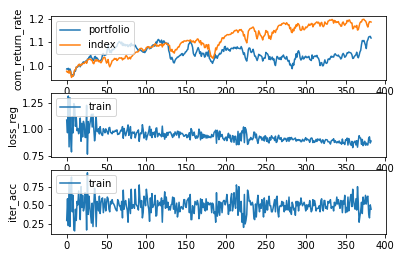

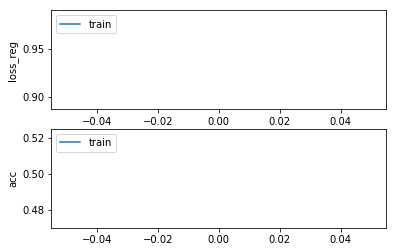

Epochs :  0 Iterations :  383 Loss :  0.9385553897205283 ACC :  0.4975579936183775 MCC :  0.006510110055710439 Precision :  0.5142802435822065
mode : validation


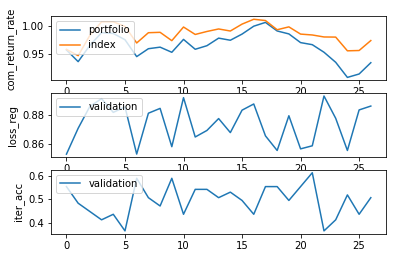

Epochs :  0 Iterations :  27 Loss :  0.8739051598089712 ACC :  0.49368193304097213 MCC :  nan Precision :  0.4832633239803491


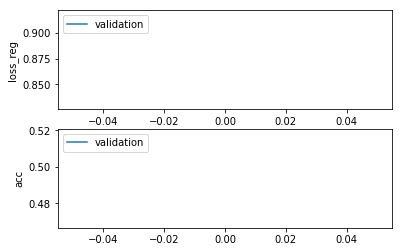

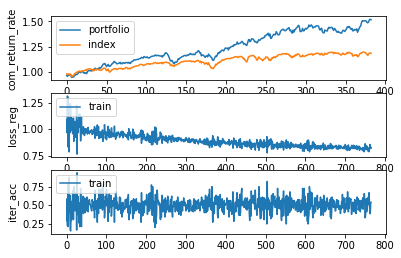

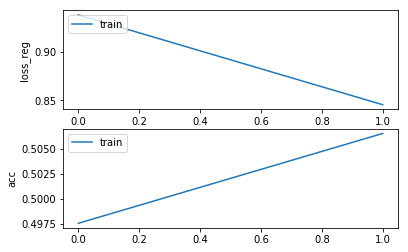

Epochs :  1 Iterations :  766 Loss :  0.8454737308442437 ACC :  0.5064967127210478 MCC :  0.011710952285630993 Precision :  0.5160532218742114
mode : validation


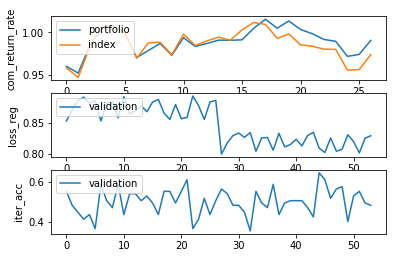

Epochs :  1 Iterations :  27 Loss :  0.818998603909104 ACC :  0.5071895575081861 MCC :  nan Precision :  0.49738629576232696


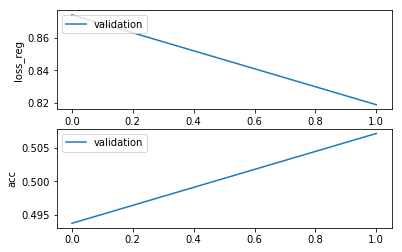

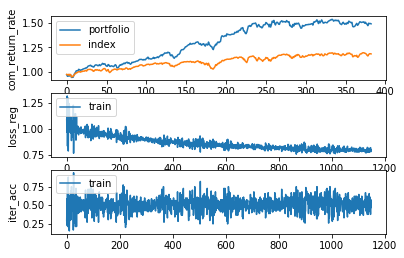

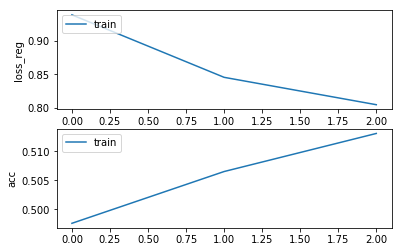

Epochs :  2 Iterations :  1149 Loss :  0.8046691305643585 ACC :  0.5130702040058515 MCC :  0.02156223029165113 Precision :  0.5196752703600312
mode : validation


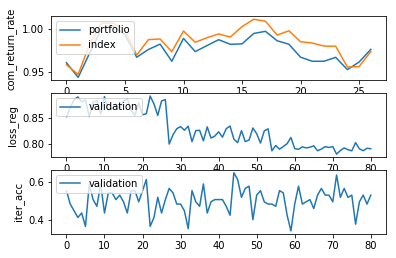

Epochs :  2 Iterations :  27 Loss :  0.7919413579834832 ACC :  0.5050109095043607 MCC :  nan Precision :  0.49658383511834675


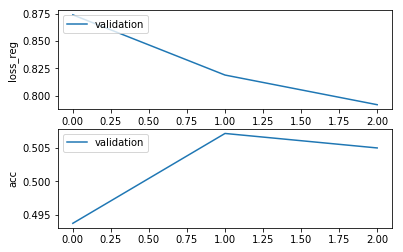

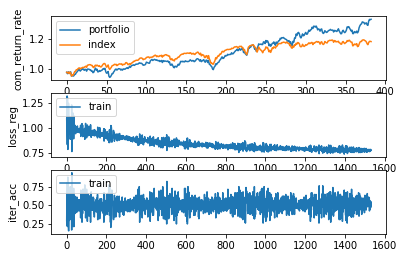

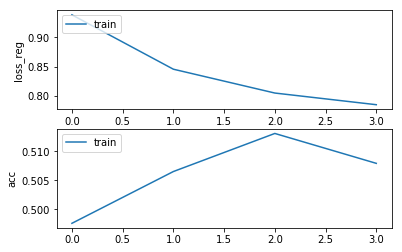

Epochs :  3 Iterations :  1532 Loss :  0.7846870705602064 ACC :  0.507909707627782 MCC :  0.01969088612117637 Precision :  0.5176268331511992
mode : validation


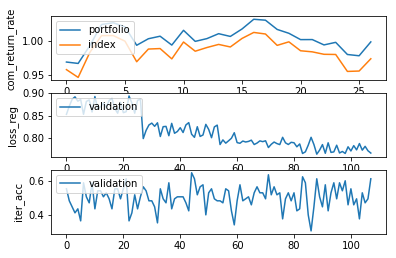

Epochs :  3 Iterations :  27 Loss :  0.777273811675884 ACC :  0.502832258189166 MCC :  nan Precision :  0.4929612070597984


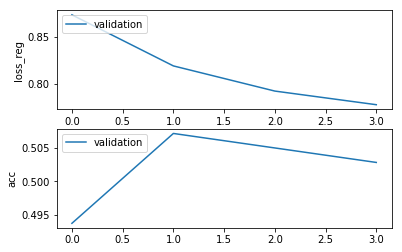

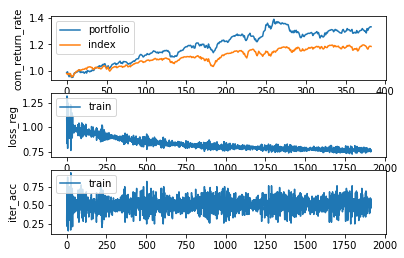

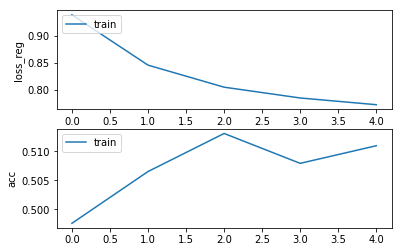

Epochs :  4 Iterations :  1915 Loss :  0.7722181642024386 ACC :  0.5109507149722495 MCC :  0.024984526910421537 Precision :  0.5201677236190508
mode : validation


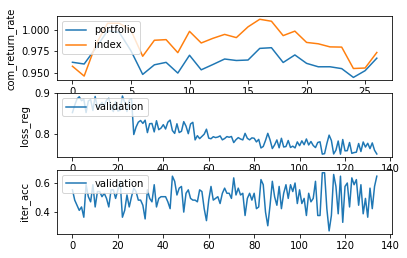

Epochs :  4 Iterations :  27 Loss :  0.7683113018671671 ACC :  0.5080610171512321 MCC :  nan Precision :  0.49541048195075105


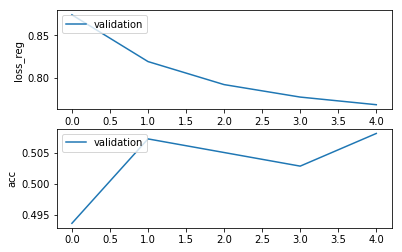

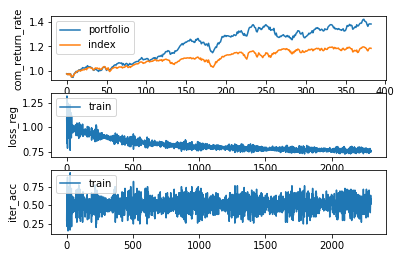

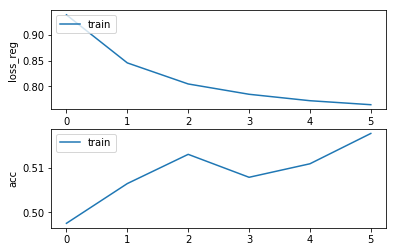

Epochs :  5 Iterations :  2298 Loss :  0.7644797269420275 ACC :  0.5177699443410022 MCC :  0.03416617658243371 Precision :  0.5230466158909836
mode : validation


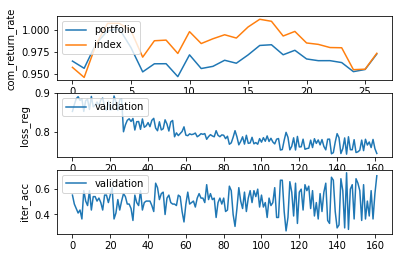

Epochs :  5 Iterations :  27 Loss :  0.7632581039711281 ACC :  0.5054466393258836 MCC :  nan Precision :  0.49591380412931796


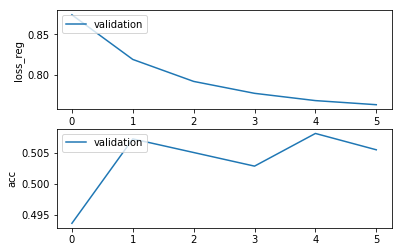

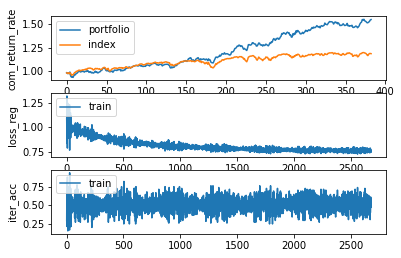

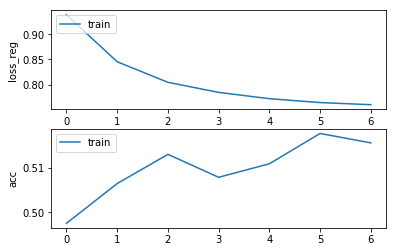

Epochs :  6 Iterations :  2681 Loss :  0.7602452013262259 ACC :  0.515650454373646 MCC :  0.027473161681695033 Precision :  0.5216362015842692
mode : validation


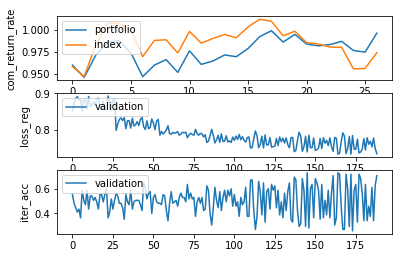

Epochs :  6 Iterations :  27 Loss :  0.7598252870418407 ACC :  0.505882368043617 MCC :  nan Precision :  0.4956075980983399


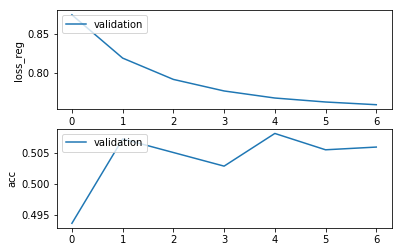

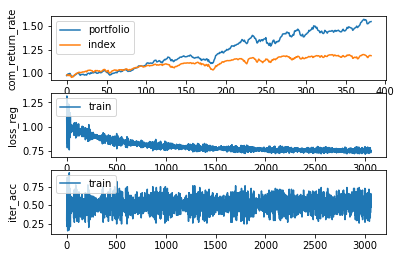

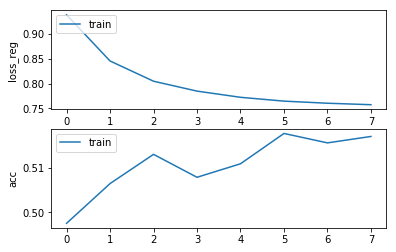

Epochs :  7 Iterations :  3064 Loss :  0.7572772994676396 ACC :  0.5170941648533076 MCC :  0.03346222596195607 Precision :  0.5217080050228314
mode : validation


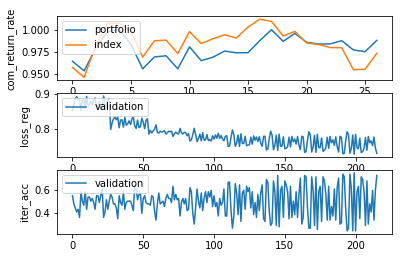

Epochs :  7 Iterations :  27 Loss :  0.7578905467633847 ACC :  0.5063180962094554 MCC :  nan Precision :  0.49668062705960536


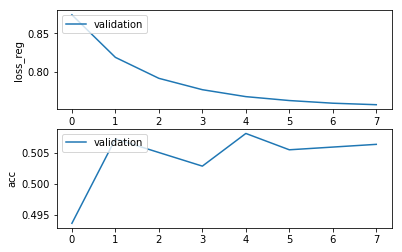

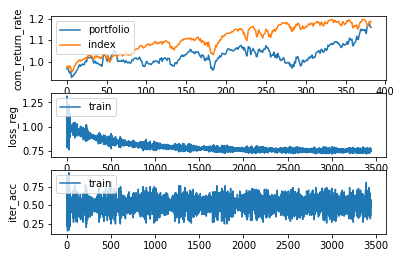

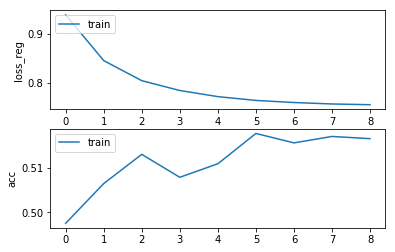

Epochs :  8 Iterations :  3447 Loss :  0.7557944070265747 ACC :  0.5166026886854097 MCC :  0.03347985379172334 Precision :  0.5222686819790548
mode : validation


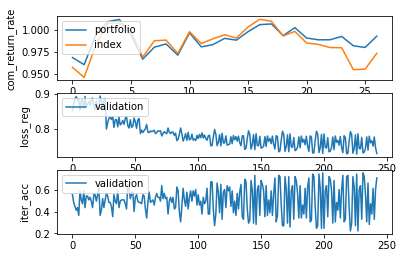

Epochs :  8 Iterations :  27 Loss :  0.7564516089580677 ACC :  0.5015250687245969 MCC :  nan Precision :  0.49265198437152086


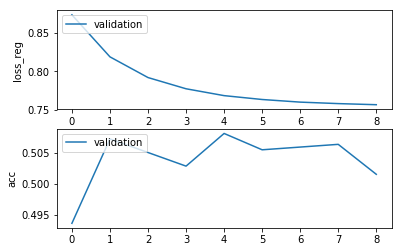

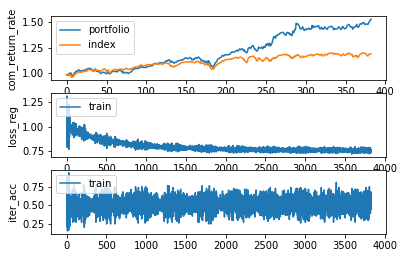

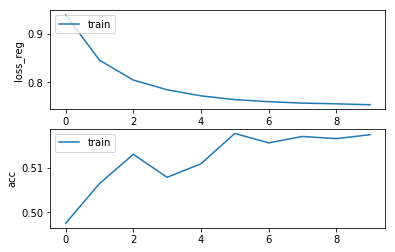

Epochs :  9 Iterations :  3830 Loss :  0.7540358199151938 ACC :  0.5174934888166174 MCC :  0.029777324227306154 Precision :  0.5213048247080637
mode : validation


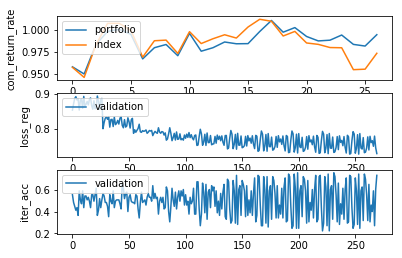

Epochs :  9 Iterations :  27 Loss :  0.7556575338045756 ACC :  0.4967320406878436 MCC :  nan Precision :  0.4896363669799434


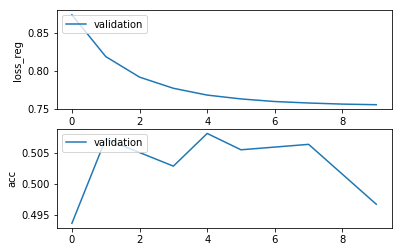

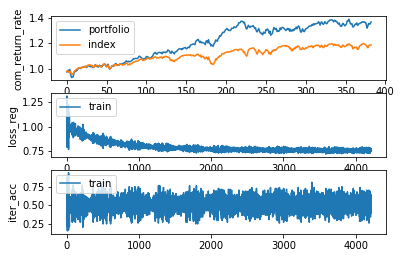

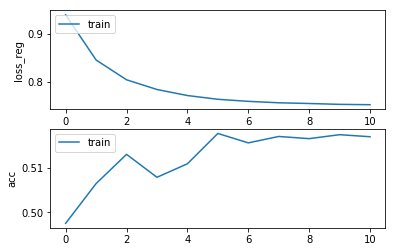

Epochs :  10 Iterations :  4213 Loss :  0.7533202221125909 ACC :  0.5170327298946231 MCC :  0.029652139792637047 Precision :  0.5215277851610286
mode : validation


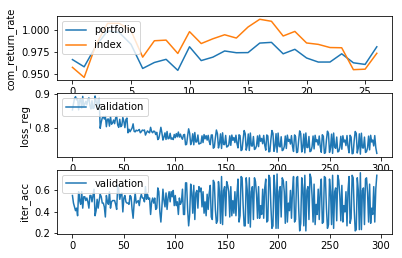

Epochs :  10 Iterations :  27 Loss :  0.754908318872805 ACC :  0.49629630976253086 MCC :  nan Precision :  0.49083819585265936


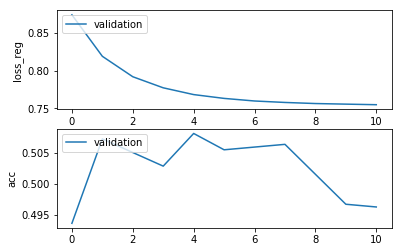

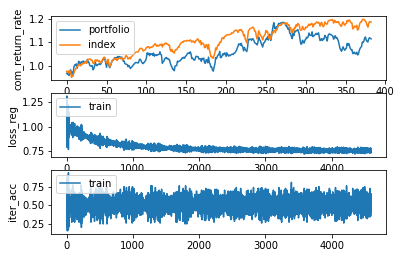

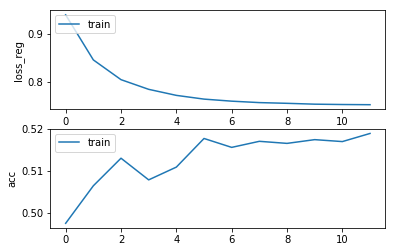

Epochs :  11 Iterations :  4596 Loss :  0.7529338953077949 ACC :  0.5189679162309313 MCC :  0.03354643408361672 Precision :  0.5227398533062819
mode : validation


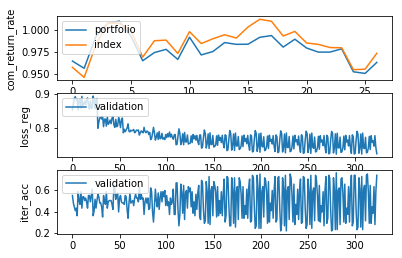

Epochs :  11 Iterations :  27 Loss :  0.7543760206964281 ACC :  0.5002178792600278 MCC :  nan Precision :  0.49301361333992744


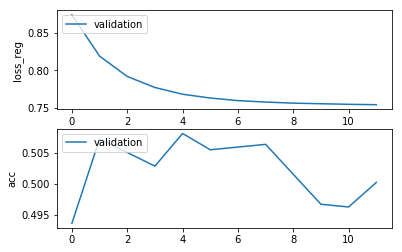

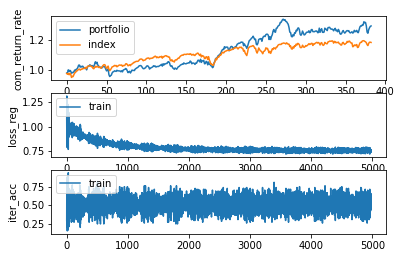

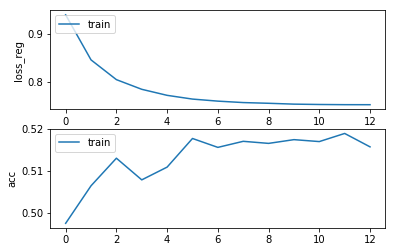

Epochs :  12 Iterations :  4979 Loss :  0.7528652301345108 ACC :  0.515773323279448 MCC :  0.02765127493940323 Precision :  0.521053470077854
mode : validation


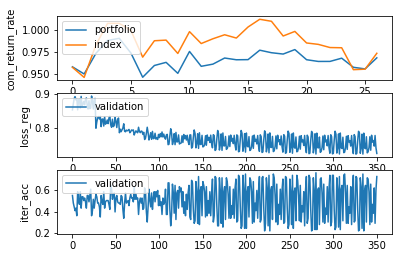

Epochs :  12 Iterations :  27 Loss :  0.7543194890022278 ACC :  0.49803922904862297 MCC :  nan Precision :  0.4939299382407356


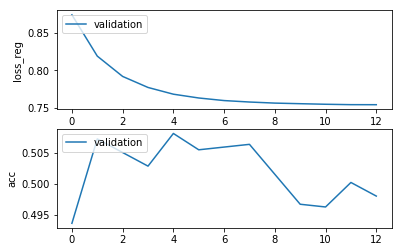

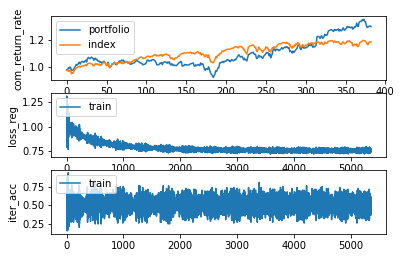

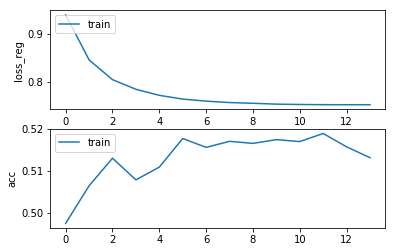

Epochs :  13 Iterations :  5362 Loss :  0.7528777209647953 ACC :  0.5131930733007177 MCC :  0.02803579348278677 Precision :  0.5204759701191601
mode : validation


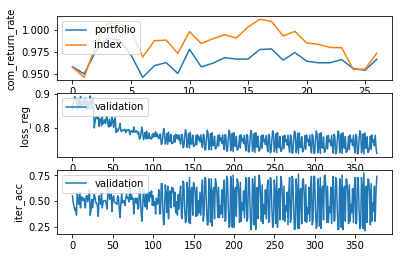

Epochs :  13 Iterations :  27 Loss :  0.7541215022404989 ACC :  0.4993464190650869 MCC :  nan Precision :  0.4923154529598024


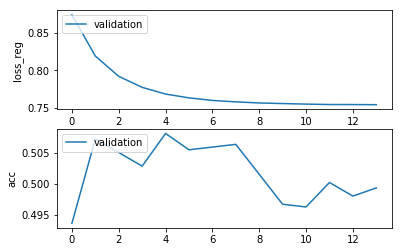

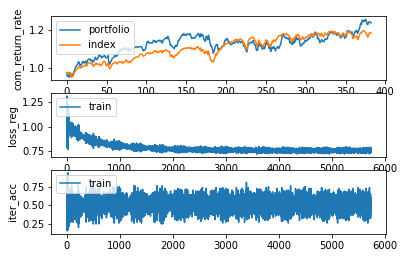

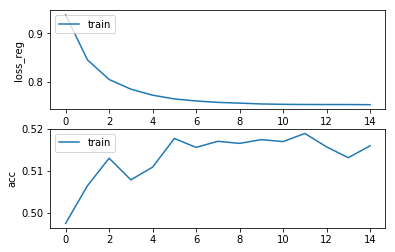

Epochs :  14 Iterations :  5745 Loss :  0.752507967830638 ACC :  0.5160190607798006 MCC :  0.03438240794407802 Precision :  0.522521003754931
mode : validation


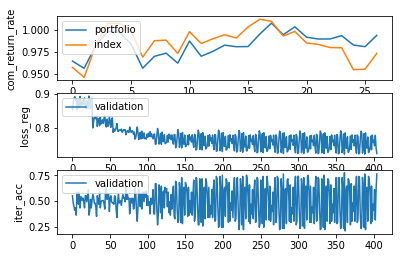

Epochs :  14 Iterations :  27 Loss :  0.7537078813270286 ACC :  0.5010893383511791 MCC :  nan Precision :  0.4923268562803666


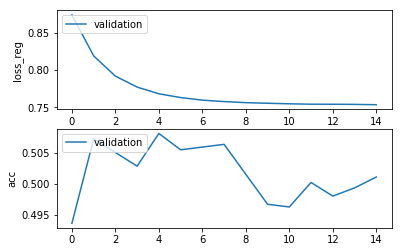

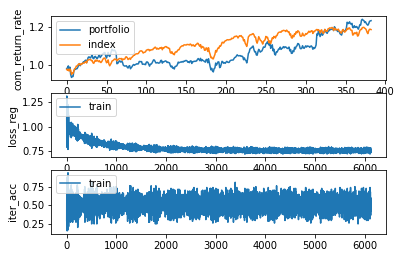

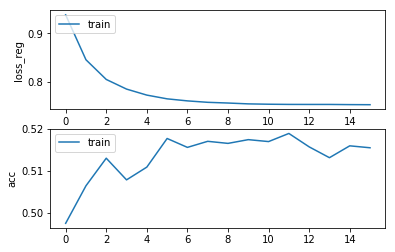

Epochs :  15 Iterations :  6128 Loss :  0.7523240431481802 ACC :  0.5155583027526541 MCC :  0.029635746429878585 Precision :  0.52168223239462
mode : validation


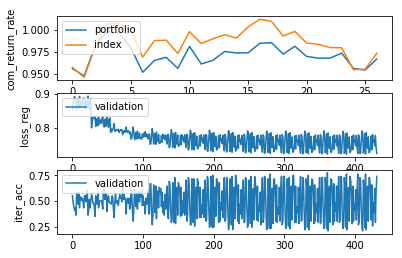

Epochs :  15 Iterations :  27 Loss :  0.7539637728973672 ACC :  0.49629630976253086 MCC :  nan Precision :  0.4918086643986128


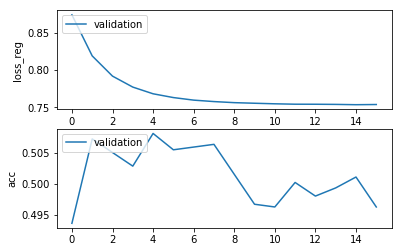

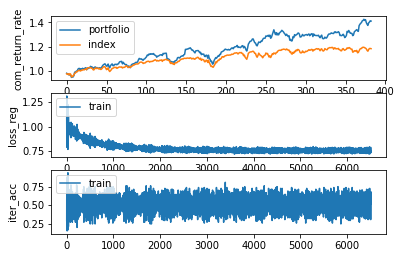

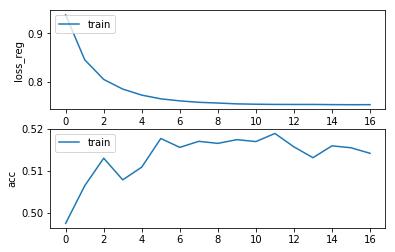

Epochs :  16 Iterations :  6511 Loss :  0.7524011306289593 ACC :  0.5142374601283211 MCC :  0.025953654442851824 Precision :  0.5199101083029266
mode : validation


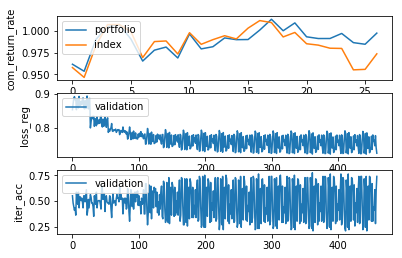

Epochs :  16 Iterations :  27 Loss :  0.7536338280748438 ACC :  0.5010893377992842 MCC :  nan Precision :  0.4936924210439126


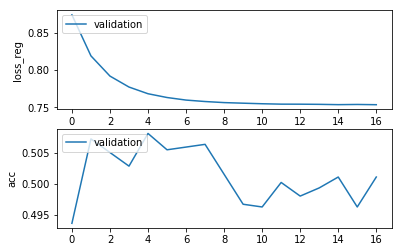

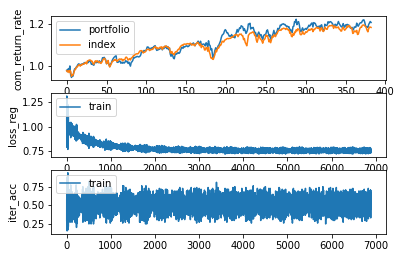

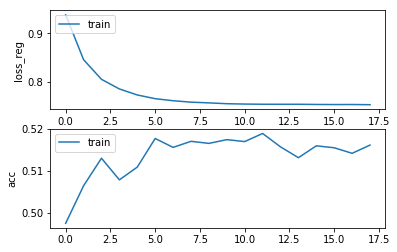

Epochs :  17 Iterations :  6894 Loss :  0.7519867700322801 ACC :  0.5162033647999128 MCC :  0.031068895551207044 Precision :  0.5219469947142249
mode : validation


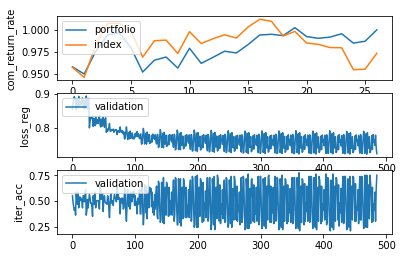

Epochs :  17 Iterations :  27 Loss :  0.753698503529584 ACC :  0.5023965272638533 MCC :  nan Precision :  0.49147697765794063


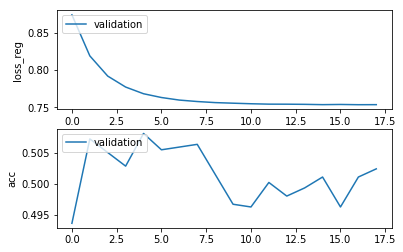

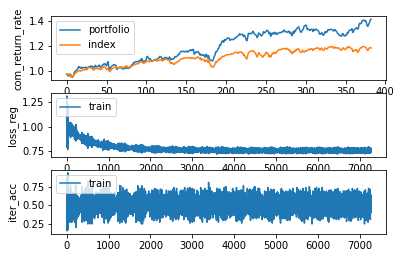

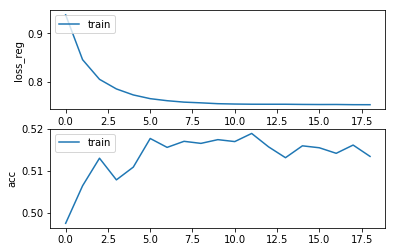

Epochs :  18 Iterations :  7277 Loss :  0.7519340882413381 ACC :  0.5135002470436669 MCC :  0.024809199548569597 Precision :  0.5202716553909582
mode : validation


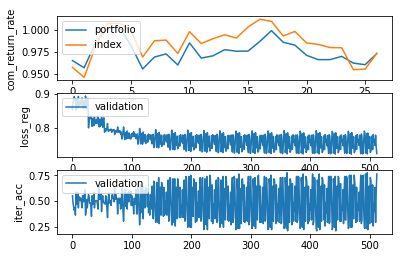

Epochs :  18 Iterations :  27 Loss :  0.7537268069055345 ACC :  0.4997821483347151 MCC :  nan Precision :  0.49323579765580317


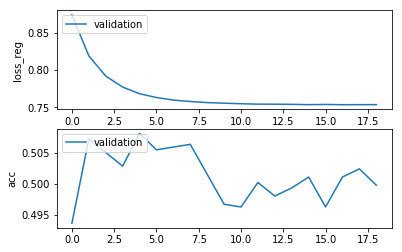

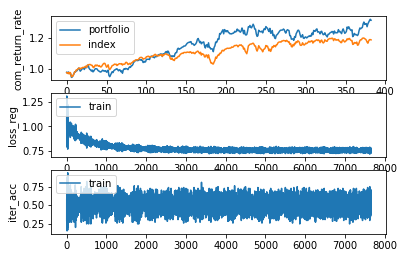

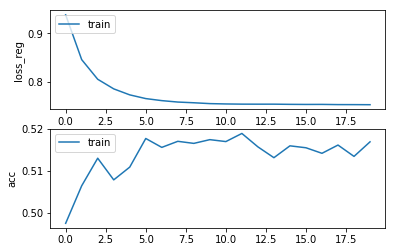

Epochs :  19 Iterations :  7660 Loss :  0.7517666373178168 ACC :  0.5169712951693771 MCC :  0.028569765029081165 Precision :  0.5202429531526317
mode : validation


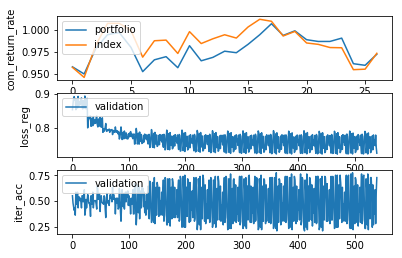

Epochs :  19 Iterations :  27 Loss :  0.7536557405083267 ACC :  0.5006536079777612 MCC :  nan Precision :  0.4938471132406482


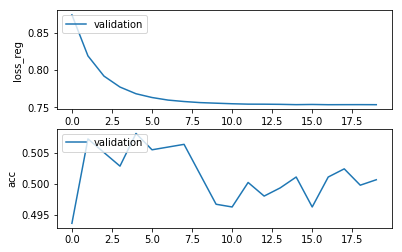

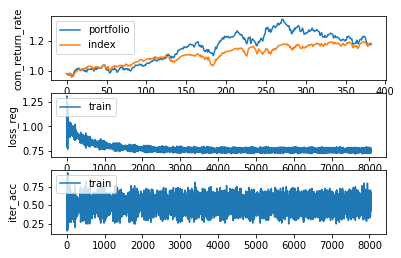

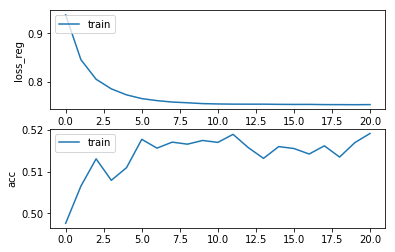

Epochs :  20 Iterations :  8043 Loss :  0.7519827914611478 ACC :  0.5191829367966315 MCC :  0.028972000816342113 Precision :  0.5210810560373196
mode : validation


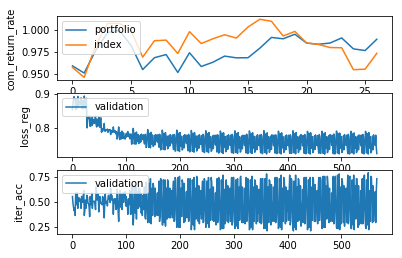

Epochs :  20 Iterations :  27 Loss :  0.7535903762888025 ACC :  0.5010893389030739 MCC :  nan Precision :  0.49313796284022154


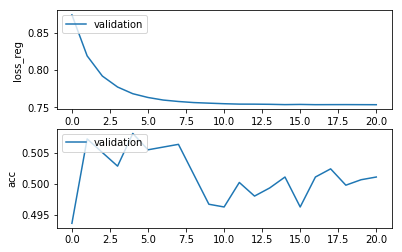

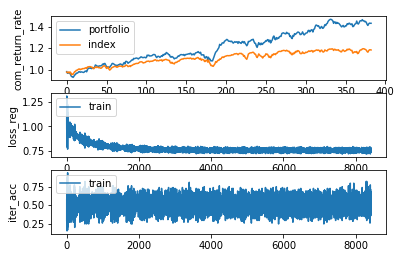

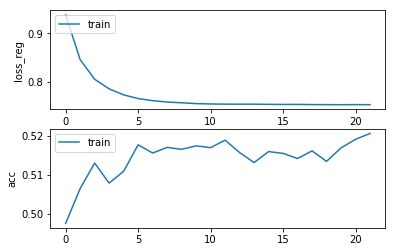

Epochs :  21 Iterations :  8426 Loss :  0.7518011452946277 ACC :  0.5206880828574806 MCC :  0.036686580655816696 Precision :  0.5233602044865606
mode : validation


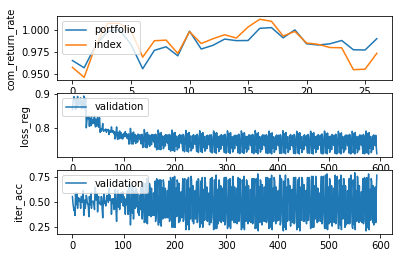

Epochs :  21 Iterations :  27 Loss :  0.7537664859383194 ACC :  0.5002178781562381 MCC :  nan Precision :  0.493222172682484


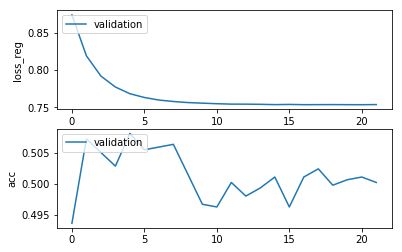

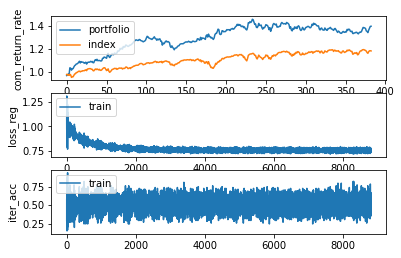

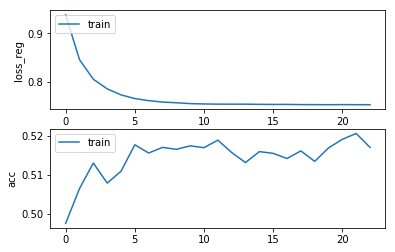

Epochs :  22 Iterations :  8809 Loss :  0.7517823301469688 ACC :  0.517094164152992 MCC :  0.02801529249232919 Precision :  0.5207106506612453
mode : validation


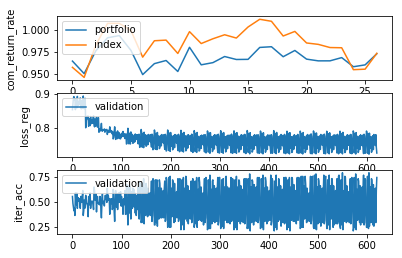

Epochs :  22 Iterations :  27 Loss :  0.7537140515115526 ACC :  0.4989106892435639 MCC :  nan Precision :  0.49215192872065083


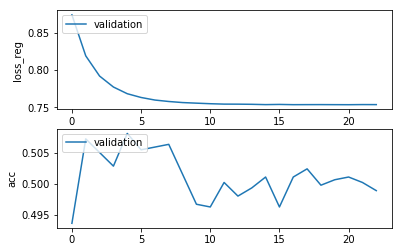

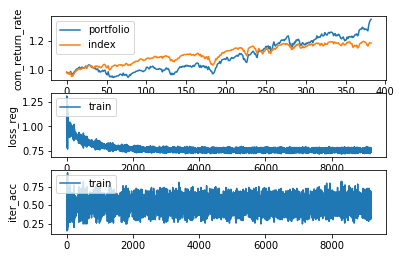

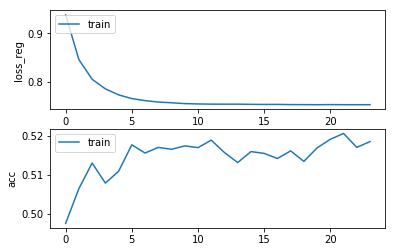

Epochs :  23 Iterations :  9192 Loss :  0.7518053811150494 ACC :  0.5185993098247768 MCC :  0.03716924130432089 Precision :  0.5238984765645418
mode : validation


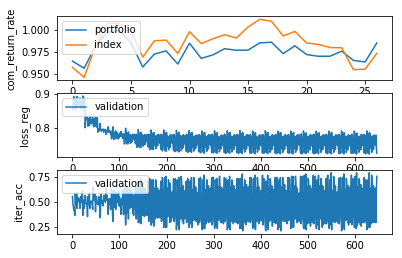

Epochs :  23 Iterations :  27 Loss :  0.7534595551314177 ACC :  0.5032679869068993 MCC :  nan Precision :  0.4941508860361797


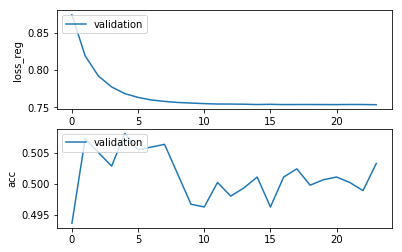

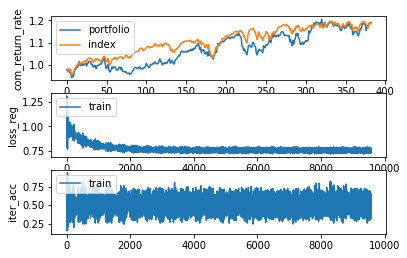

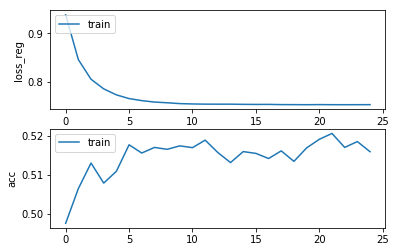

Epochs :  24 Iterations :  9575 Loss :  0.7518748960046793 ACC :  0.5159883436117098 MCC :  0.028556096154768458 Precision :  0.5217494811891887
mode : validation


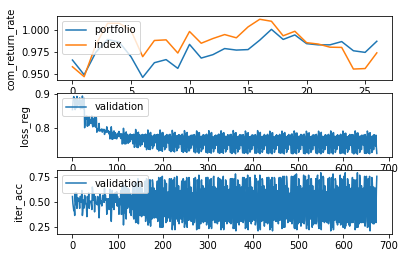

Epochs :  24 Iterations :  27 Loss :  0.7535087068875631 ACC :  0.500217878708133 MCC :  nan Precision :  0.4946285379981553


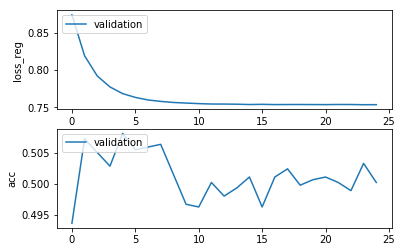

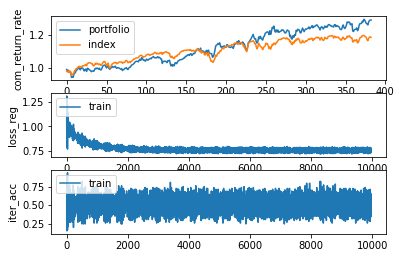

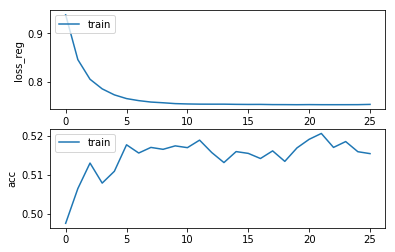

Epochs :  25 Iterations :  9958 Loss :  0.7524083555522849 ACC :  0.5154968671325604 MCC :  0.029537589672233123 Precision :  0.5211630295962095
mode : validation


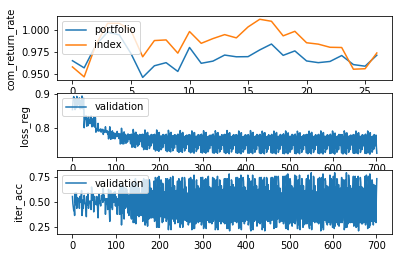

Epochs :  25 Iterations :  27 Loss :  0.7536698535636619 ACC :  0.500653608529656 MCC :  nan Precision :  0.49357955040479146


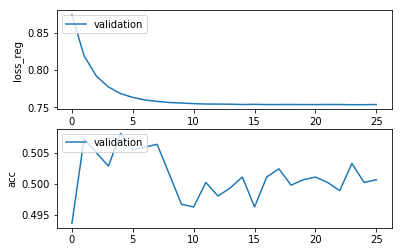

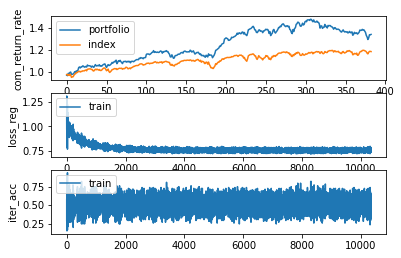

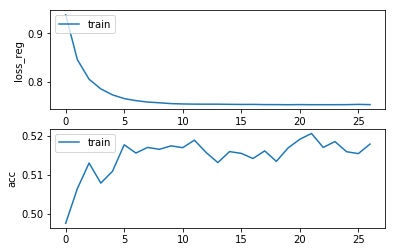

Epochs :  26 Iterations :  10341 Loss :  0.751967845012874 ACC :  0.5179542473106409 MCC :  0.03463339913811525 Precision :  0.5231182312607454
mode : validation


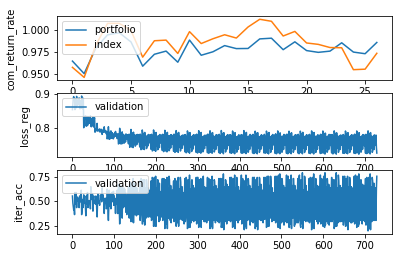

Epochs :  26 Iterations :  27 Loss :  0.7536216996334217 ACC :  0.49629630976253086 MCC :  nan Precision :  0.49068341549072003


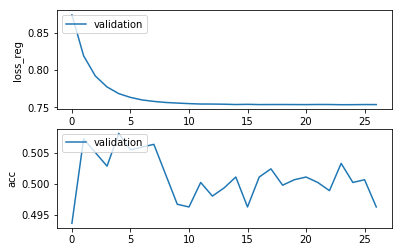

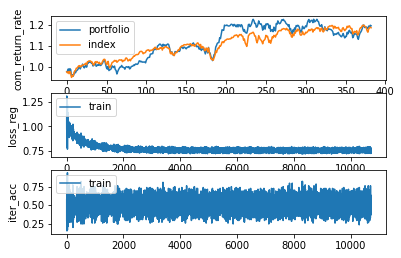

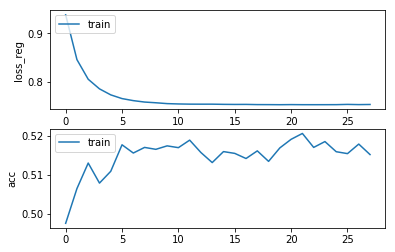

Epochs :  27 Iterations :  10724 Loss :  0.7522391501045725 ACC :  0.5152511297100206 MCC :  0.029730509466907452 Precision :  0.5211658823175
mode : validation


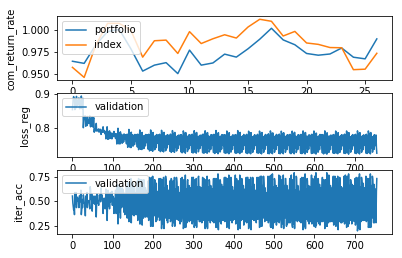

Epochs :  27 Iterations :  27 Loss :  0.7536825581833169 ACC :  0.5015250676208072 MCC :  nan Precision :  0.4940520471168889


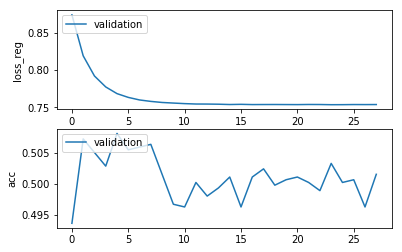

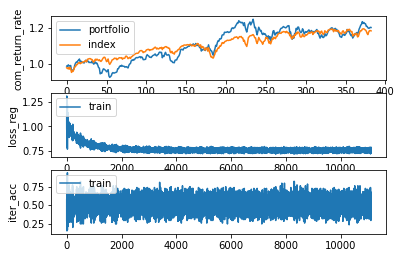

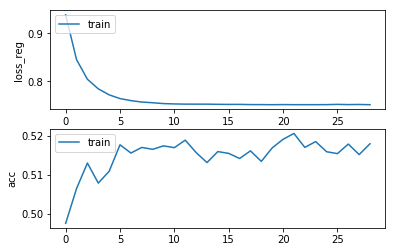

Epochs :  28 Iterations :  11107 Loss :  0.7517276423406974 ACC :  0.5180463993206971 MCC :  0.03518890777746259 Precision :  0.5225777112959104
mode : validation


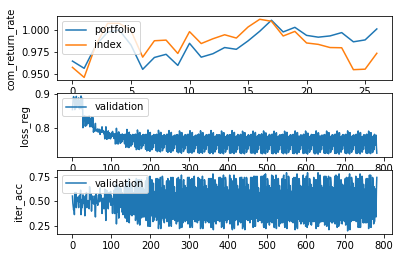

Epochs :  28 Iterations :  27 Loss :  0.7536754122486821 ACC :  0.5023965278157482 MCC :  nan Precision :  0.49317050718322947


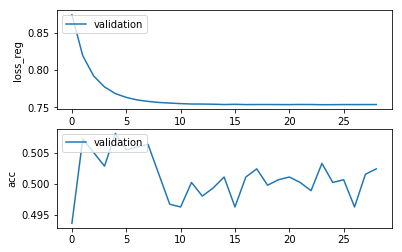

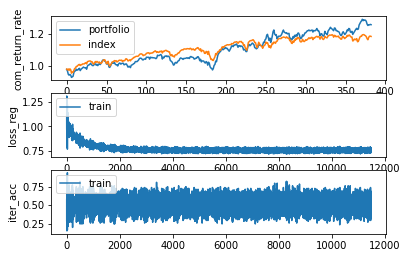

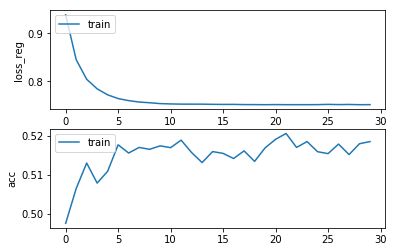

Epochs :  29 Iterations :  11490 Loss :  0.7518885350414107 ACC :  0.5185993092022739 MCC :  0.03128131755442886 Precision :  0.521790060698597
mode : validation


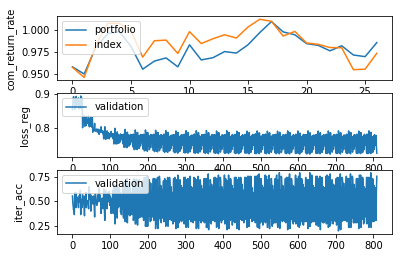

Epochs :  29 Iterations :  27 Loss :  0.7535034793394583 ACC :  0.5045751763714684 MCC :  nan Precision :  0.4940617740568187


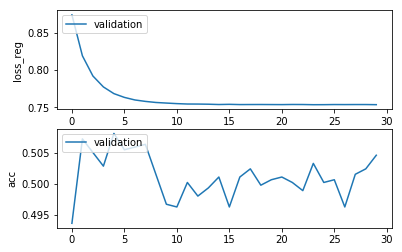

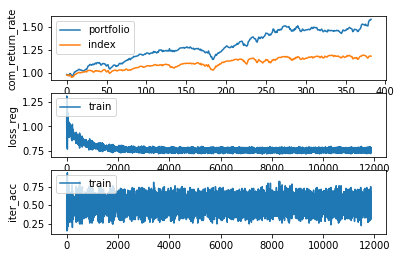

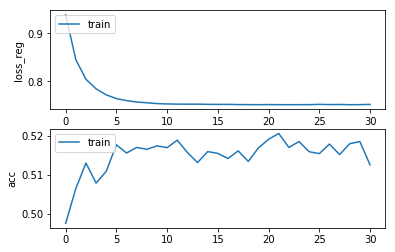

Epochs :  30 Iterations :  11873 Loss :  0.7523354853724686 ACC :  0.5126094457452665 MCC :  0.01983888504063764 Precision :  0.5181981053898796
mode : validation


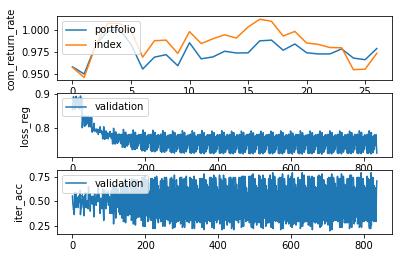

Epochs :  30 Iterations :  27 Loss :  0.7535997805772005 ACC :  0.5023965278157482 MCC :  nan Precision :  0.49481573790587763


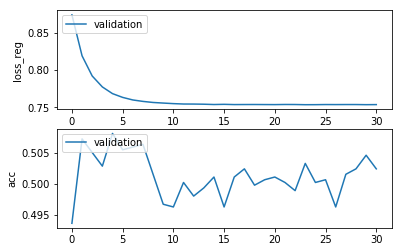

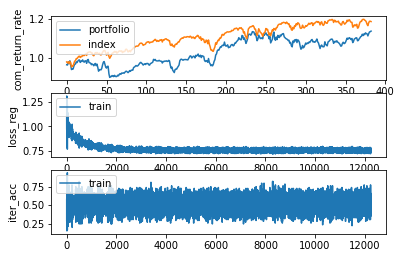

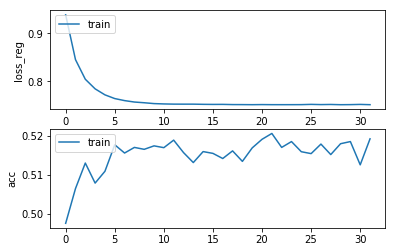

Epochs :  31 Iterations :  12256 Loss :  0.7517684329271939 ACC :  0.5193058063249364 MCC :  0.032775579965685545 Precision :  0.5227676863993661
mode : validation


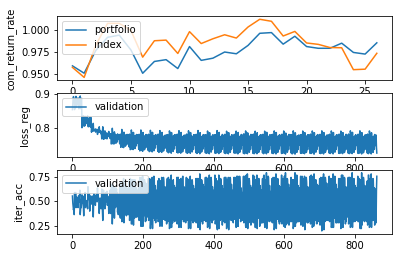

Epochs :  31 Iterations :  27 Loss :  0.7535657286643982 ACC :  0.5023965289195379 MCC :  nan Precision :  0.4939742255266066


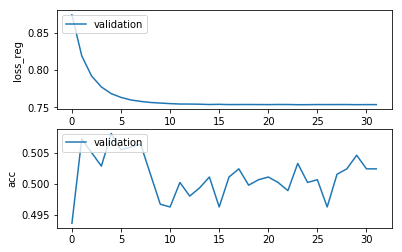

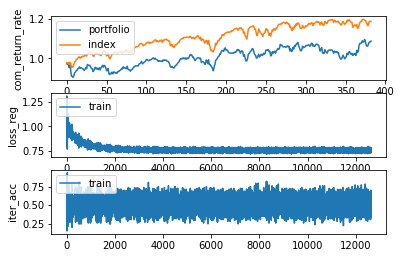

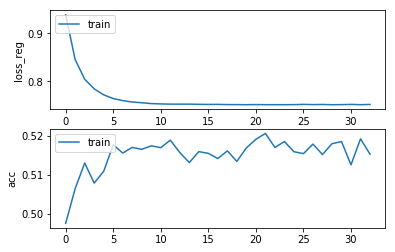

Epochs :  32 Iterations :  12639 Loss :  0.7522599634862756 ACC :  0.5153432815255446 MCC :  0.025644298991359837 Precision :  0.5197688251364169
mode : validation


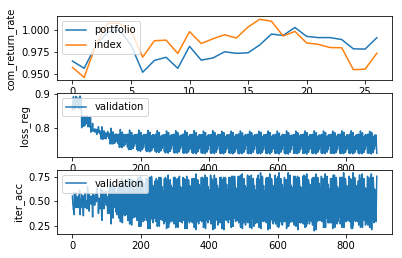

Epochs :  32 Iterations :  27 Loss :  0.7536286424707483 ACC :  0.49542485067137965 MCC :  nan Precision :  0.49134368214894225


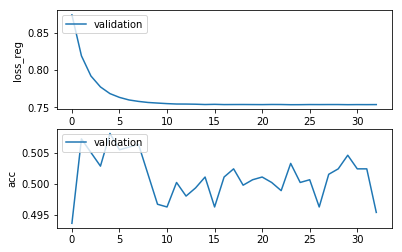

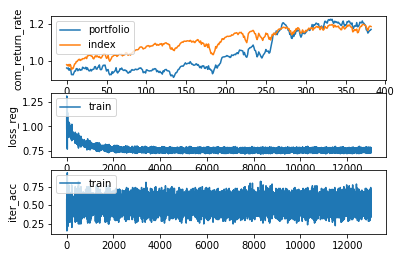

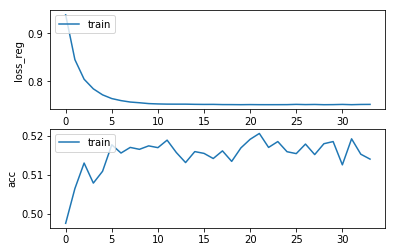

Epochs :  33 Iterations :  13022 Loss :  0.7523768802535752 ACC :  0.5140838742878667 MCC :  0.023507148375602162 Precision :  0.5194714328629152
mode : validation


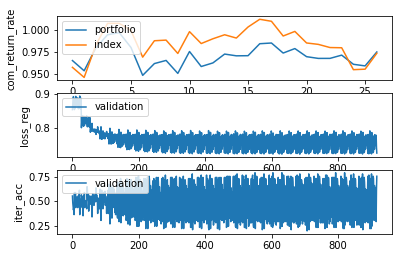

Epochs :  33 Iterations :  27 Loss :  0.753610803021325 ACC :  0.5058823658360375 MCC :  nan Precision :  0.4959483256356584


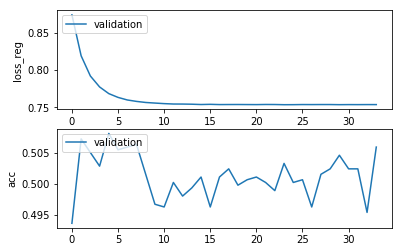

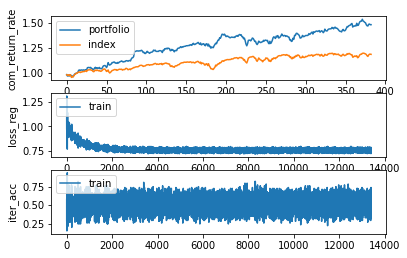

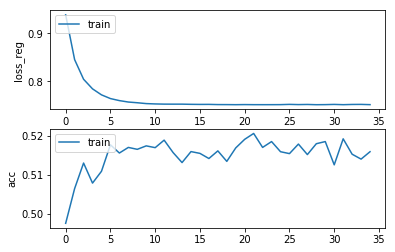

Epochs :  34 Iterations :  13405 Loss :  0.7518436858921699 ACC :  0.5159883435338969 MCC :  0.030589591213270984 Precision :  0.5216149792036251
mode : validation


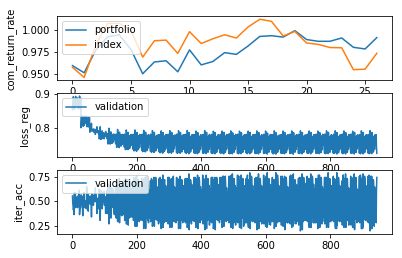

Epochs :  34 Iterations :  27 Loss :  0.7536950884041963 ACC :  0.496732039032159 MCC :  nan Precision :  0.4924591220225449


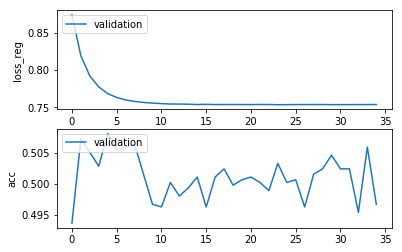

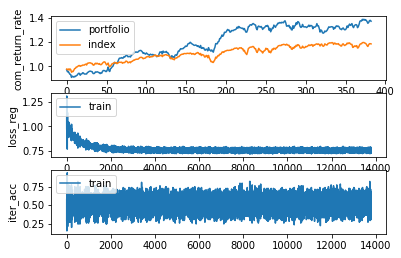

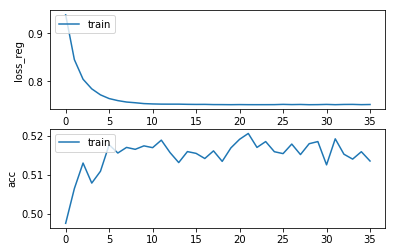

Epochs :  35 Iterations :  13788 Loss :  0.7521448765660079 ACC :  0.5135923978087173 MCC :  0.021669030239666976 Precision :  0.5188141426621078
mode : validation


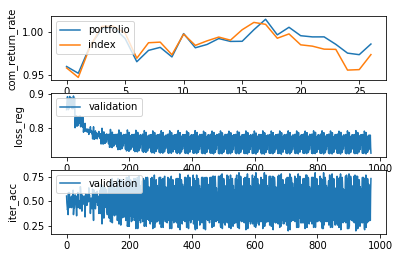

Epochs :  35 Iterations :  27 Loss :  0.7537451540982282 ACC :  0.49455339047643876 MCC :  nan Precision :  0.48979320618565436


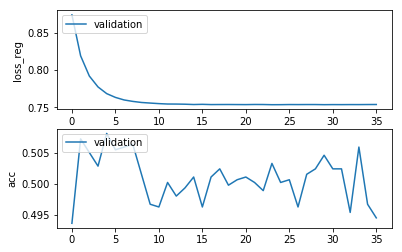

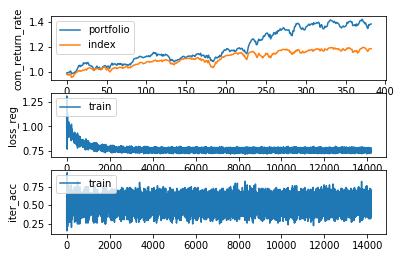

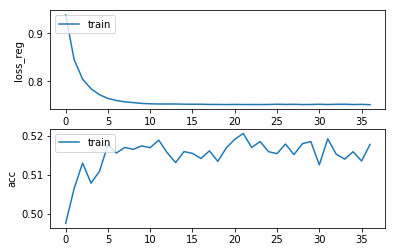

Epochs :  36 Iterations :  14171 Loss :  0.7514121420389679 ACC :  0.517862095689649 MCC :  0.031838118158859584 Precision :  0.521880708435458
mode : validation


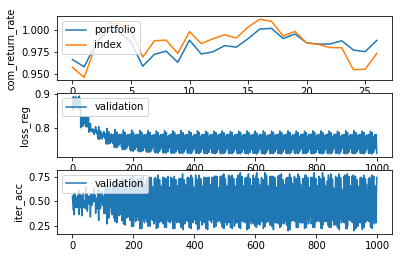

Epochs :  36 Iterations :  27 Loss :  0.75359340067263 ACC :  0.5006536079777612 MCC :  nan Precision :  0.49255739573251317


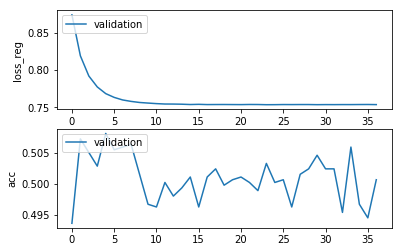

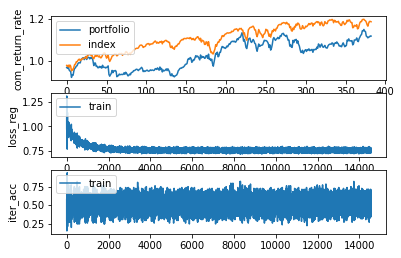

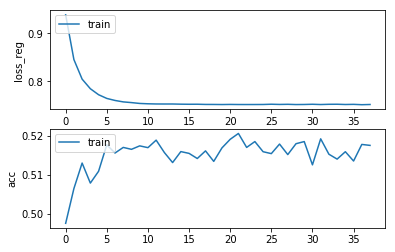

Epochs :  37 Iterations :  14554 Loss :  0.7518477855401001 ACC :  0.5176163577224193 MCC :  0.03354690341624205 Precision :  0.5232285387648693
mode : validation


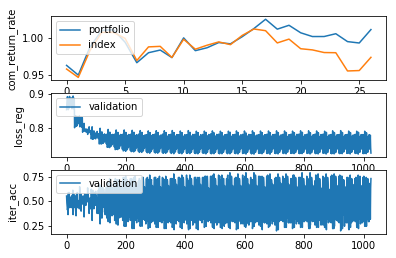

Epochs :  37 Iterations :  27 Loss :  0.7535933388604058 ACC :  0.5028322576372711 MCC :  nan Precision :  0.49269328687202046


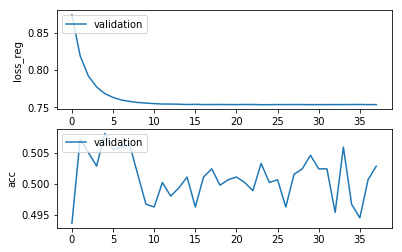

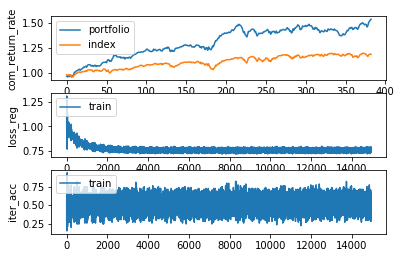

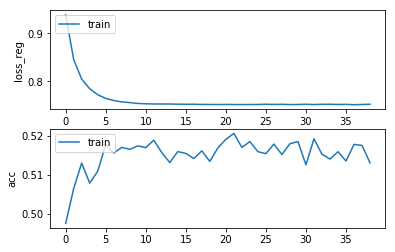

Epochs :  38 Iterations :  14937 Loss :  0.7523884992686638 ACC :  0.5131316396648516 MCC :  0.025073143120128028 Precision :  0.5198893769359697
mode : validation


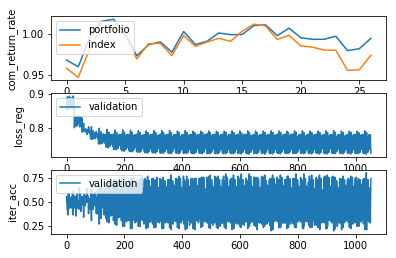

Epochs :  38 Iterations :  27 Loss :  0.7535736384215178 ACC :  0.502396528367643 MCC :  nan Precision :  0.49380768559597155


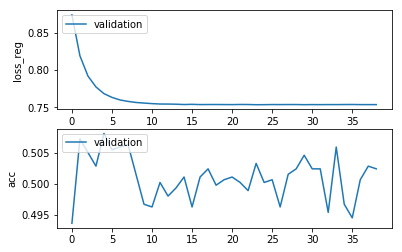

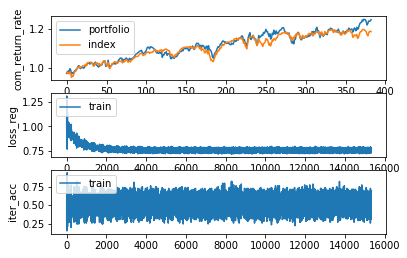

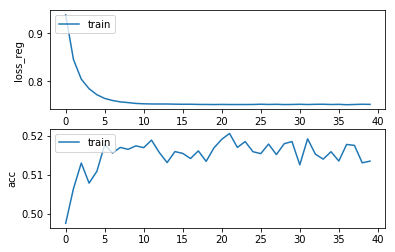

Epochs :  39 Iterations :  15320 Loss :  0.7520663125085457 ACC :  0.5135616806406265 MCC :  0.03000205750400857 Precision :  0.5213422403420387
mode : validation


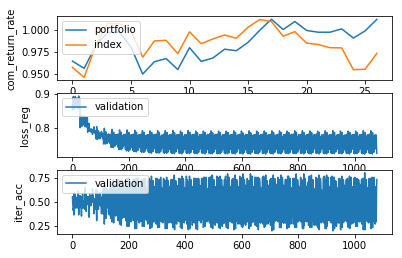

Epochs :  39 Iterations :  27 Loss :  0.7536592064080415 ACC :  0.49934641851319206 MCC :  nan Precision :  0.4937036580371636


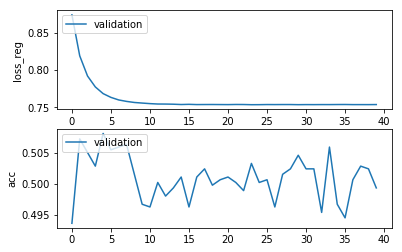

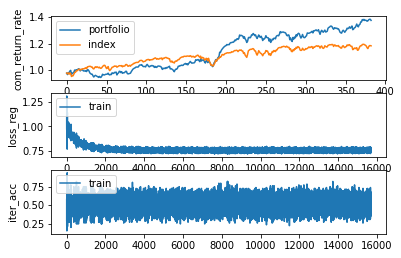

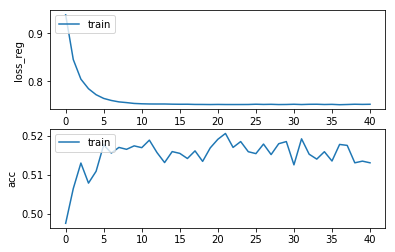

Epochs :  40 Iterations :  15703 Loss :  0.7523057628860673 ACC :  0.5131316395092259 MCC :  0.022392774644239707 Precision :  0.5185202398476028
mode : validation


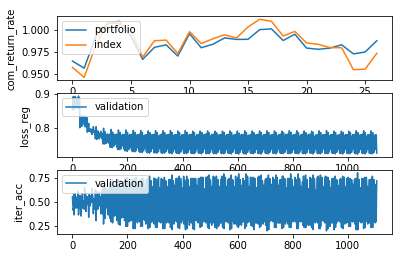

Epochs :  40 Iterations :  27 Loss :  0.7535495162010193 ACC :  0.49847495942204084 MCC :  nan Precision :  0.49115326697075806


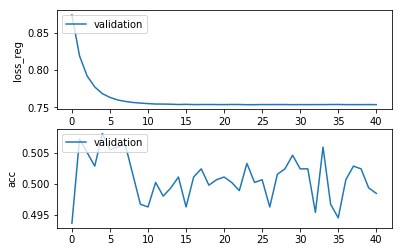

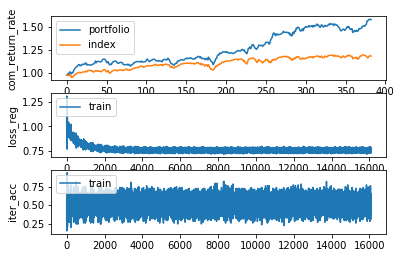

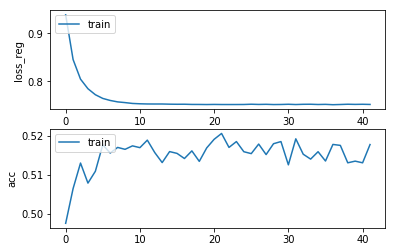

Epochs :  41 Iterations :  16086 Loss :  0.7519523078094263 ACC :  0.5178313781324939 MCC :  0.03078913611089981 Precision :  0.5215849755210291
mode : validation


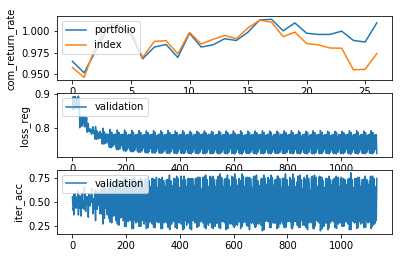

Epochs :  41 Iterations :  27 Loss :  0.7537344164318509 ACC :  0.50196079854612 MCC :  nan Precision :  0.49260356435897173


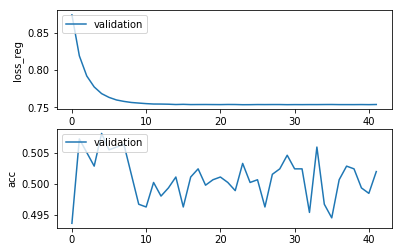

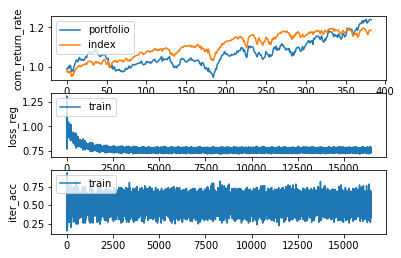

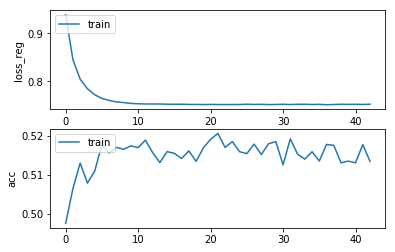

Epochs :  42 Iterations :  16469 Loss :  0.7524453580535112 ACC :  0.5135002459153806 MCC :  0.02424438319755013 Precision :  0.5193293931949933
mode : validation


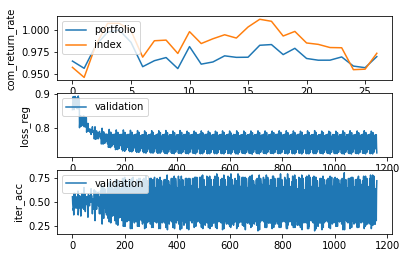

Epochs :  42 Iterations :  27 Loss :  0.7537054198759573 ACC :  0.4976035003308897 MCC :  nan Precision :  0.48941659058133763


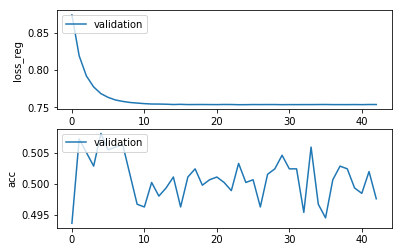

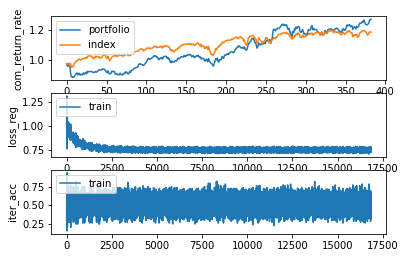

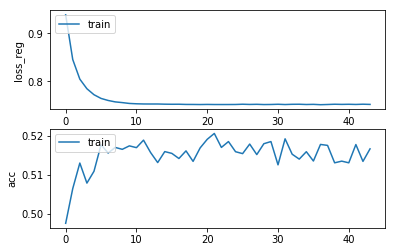

Epochs :  43 Iterations :  16852 Loss :  0.7520242569963241 ACC :  0.5167255579024631 MCC :  0.034040626533592105 Precision :  0.5231434897502627
mode : validation


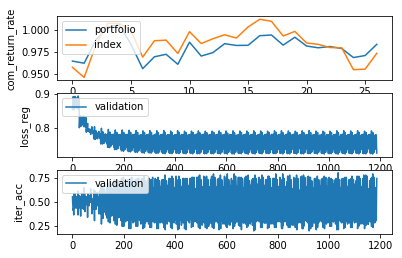

Epochs :  43 Iterations :  27 Loss :  0.7536197348877236 ACC :  0.5037037167284224 MCC :  nan Precision :  0.4927252397907001


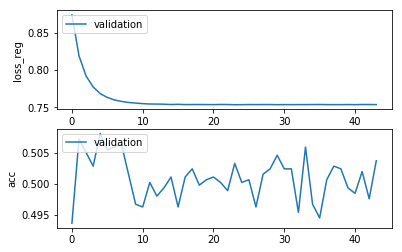

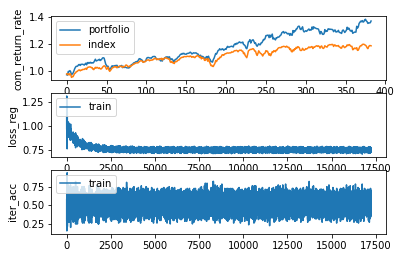

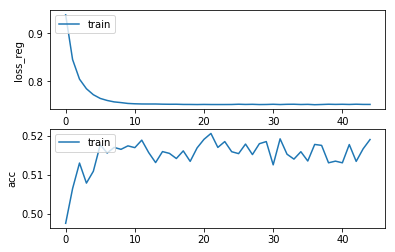

Epochs :  44 Iterations :  17235 Loss :  0.7519887623525475 ACC :  0.5191215026160756 MCC :  0.03401970287861531 Precision :  0.5221993811185381
mode : validation


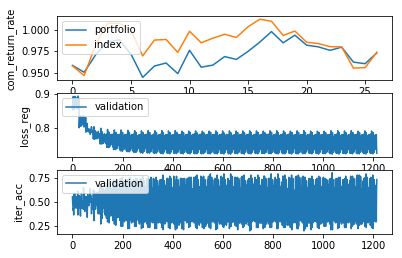

Epochs :  44 Iterations :  27 Loss :  0.7537215065073084 ACC :  0.5010893377992842 MCC :  nan Precision :  0.49400527161304597


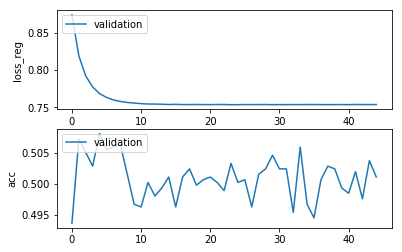

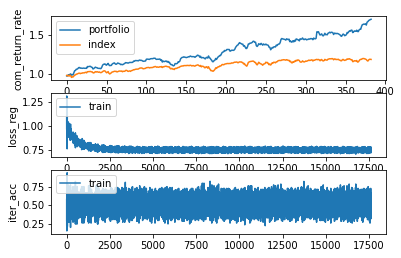

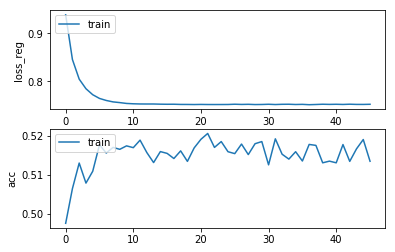

Epochs :  45 Iterations :  17618 Loss :  0.7522867125879691 ACC :  0.5135309628500329 MCC :  0.023638152828325782 Precision :  0.5190809900014036
mode : validation


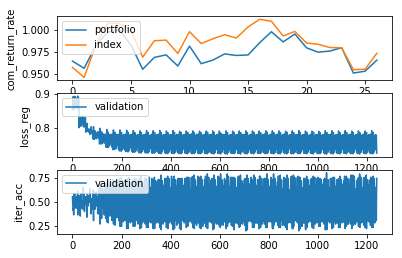

Epochs :  45 Iterations :  27 Loss :  0.7536027784700747 ACC :  0.5067538260309784 MCC :  nan Precision :  0.4968660918098909


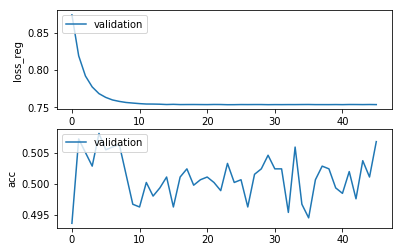

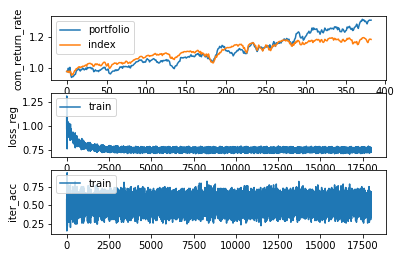

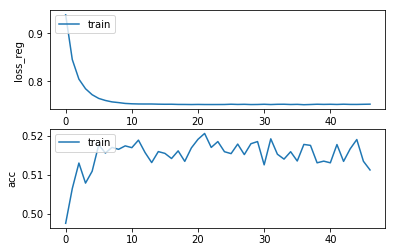

Epochs :  46 Iterations :  18001 Loss :  0.7525292200768274 ACC :  0.5112886038990618 MCC :  0.02045148062290546 Precision :  0.5181778530607257
mode : validation


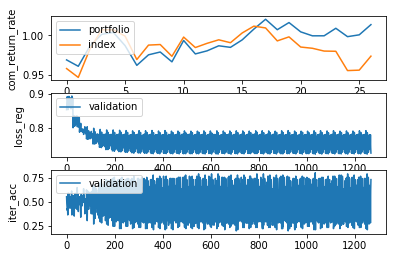

Epochs :  46 Iterations :  27 Loss :  0.7534921257584183 ACC :  0.4993464190650869 MCC :  nan Precision :  0.49258270721744607


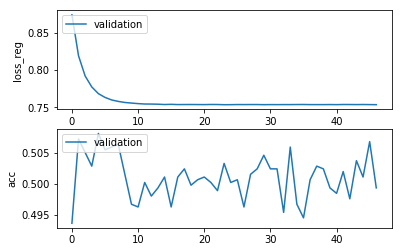

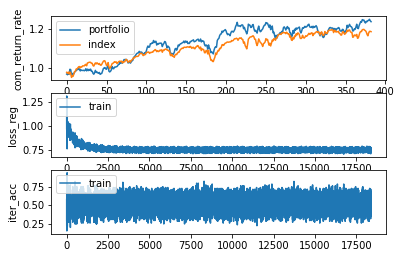

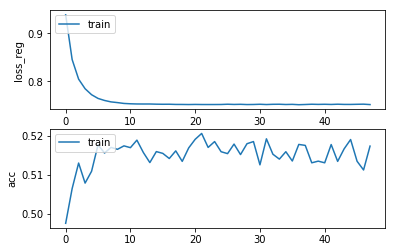

Epochs :  47 Iterations :  18384 Loss :  0.751673779506285 ACC :  0.5174320546360613 MCC :  0.031039530067131962 Precision :  0.5224832349575997
mode : validation


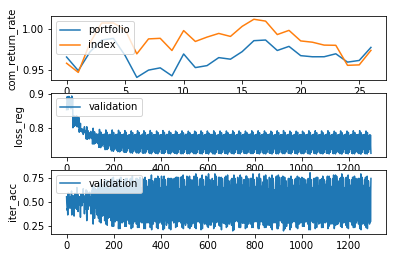

Epochs :  47 Iterations :  27 Loss :  0.7534836022942154 ACC :  0.5002178781562381 MCC :  nan Precision :  0.49369668967469976


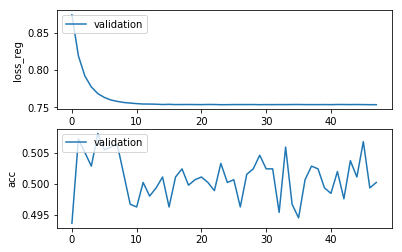

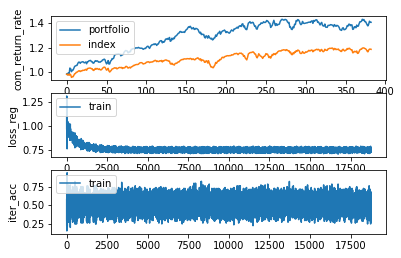

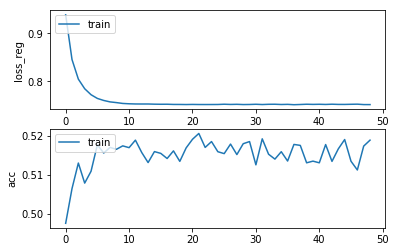

Epochs :  48 Iterations :  18767 Loss :  0.7516266176034514 ACC :  0.5189679165421827 MCC :  0.031630315813333205 Precision :  0.5225670796432399
mode : validation


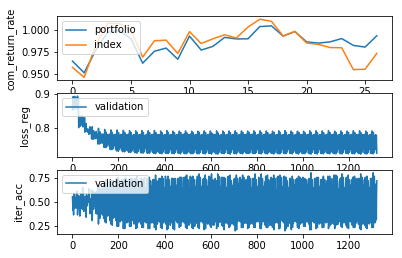

Epochs :  48 Iterations :  27 Loss :  0.7536769332709136 ACC :  0.5037037172803173 MCC :  nan Precision :  0.49405834623784933


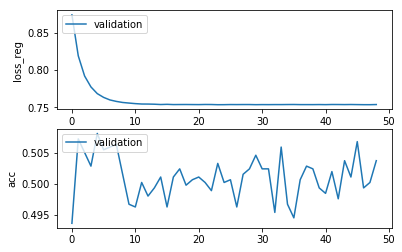

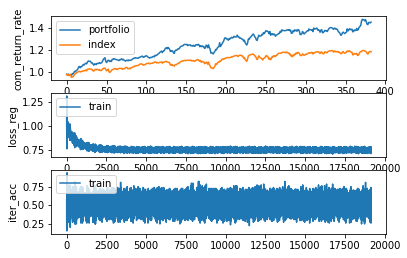

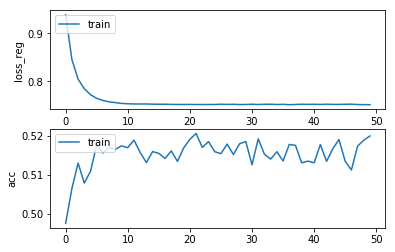

Epochs :  49 Iterations :  19150 Loss :  0.7513827183539189 ACC :  0.5200430206156897 MCC :  0.030060454298177972 Precision :  0.5220531229581441
mode : validation


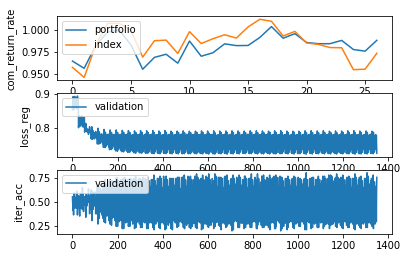

Epochs :  49 Iterations :  27 Loss :  0.7536946998702155 ACC :  0.4984749599739357 MCC :  nan Precision :  0.49243756756186485


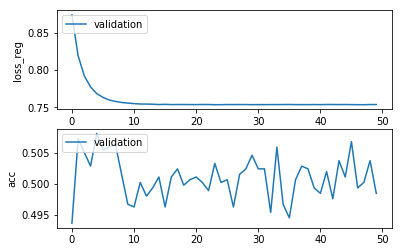

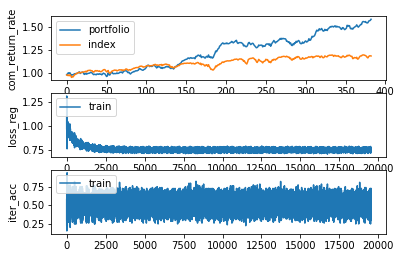

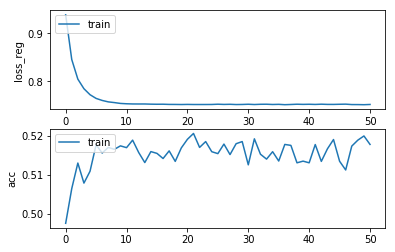

Epochs :  50 Iterations :  19533 Loss :  0.751866999245188 ACC :  0.5178620961954326 MCC :  0.02887392881148259 Precision :  0.5216295878079479
mode : validation


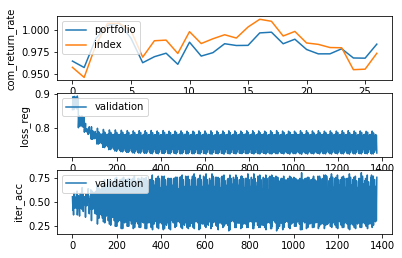

Epochs :  50 Iterations :  27 Loss :  0.7533572073336001 ACC :  0.5045751774752582 MCC :  nan Precision :  0.4935652441172688


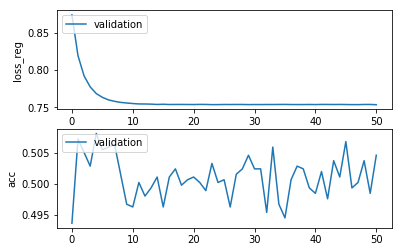

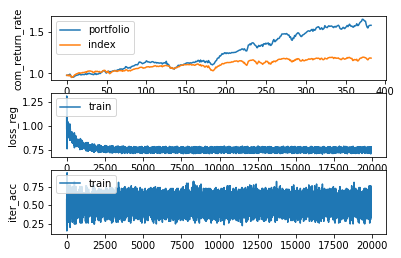

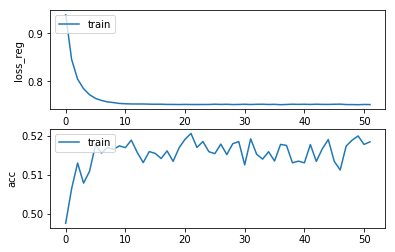

Epochs :  51 Iterations :  19916 Loss :  0.751673712587232 ACC :  0.518537875488595 MCC :  0.03302335526092664 Precision :  0.5226743453165259
mode : validation


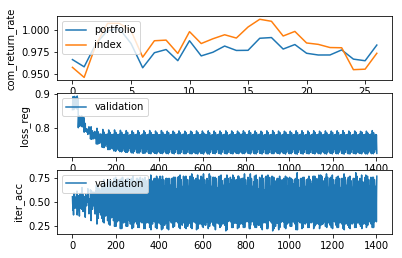

Epochs :  51 Iterations :  27 Loss :  0.7536666327052646 ACC :  0.49934641851319206 MCC :  nan Precision :  0.4929333014620675


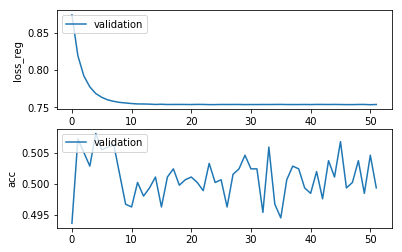

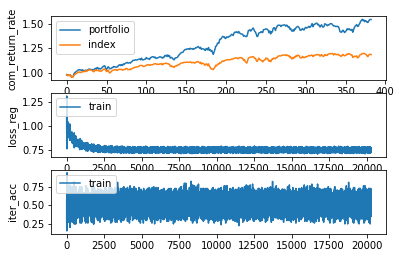

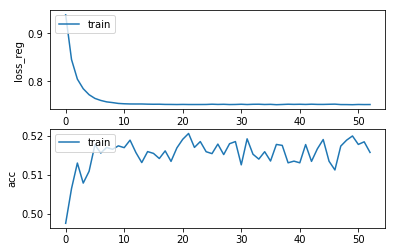

Epochs :  52 Iterations :  20299 Loss :  0.7517391647122236 ACC :  0.5158040402530067 MCC :  0.02436844916289609 Precision :  0.5200525309122107
mode : validation


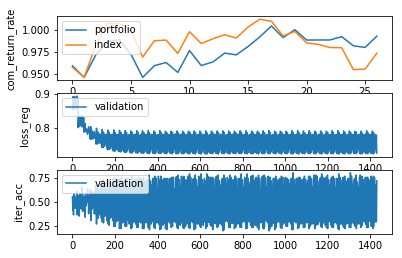

Epochs :  52 Iterations :  27 Loss :  0.7534361834879275 ACC :  0.4971677688536821 MCC :  nan Precision :  0.492596667052971


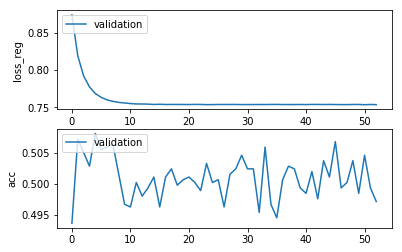

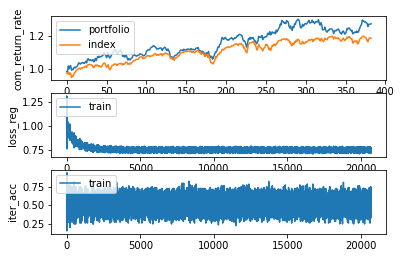

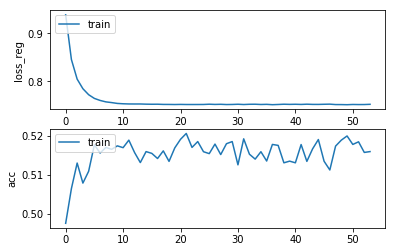

Epochs :  53 Iterations :  20682 Loss :  0.7521955711723308 ACC :  0.5160190603907363 MCC :  0.031067911953441604 Precision :  0.5221214955988737
mode : validation


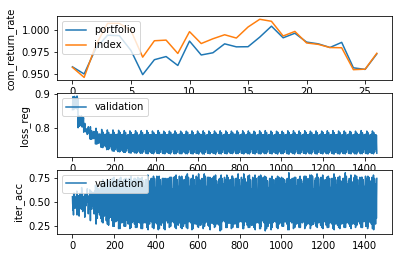

Epochs :  53 Iterations :  27 Loss :  0.7536732134995637 ACC :  0.49891068869166905 MCC :  nan Precision :  0.49283811036083436


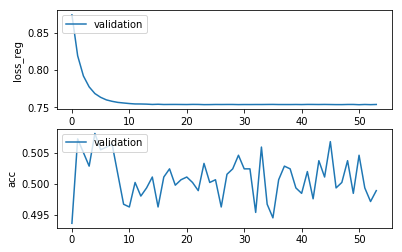

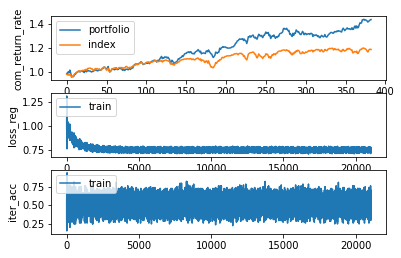

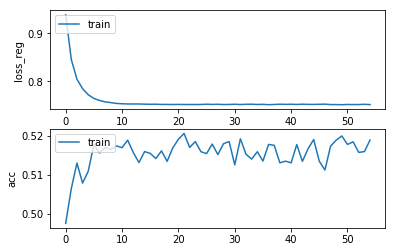

Epochs :  54 Iterations :  21065 Loss :  0.7516001291748127 ACC :  0.5189679170090599 MCC :  0.03028893404775214 Precision :  0.5223561339566664
mode : validation


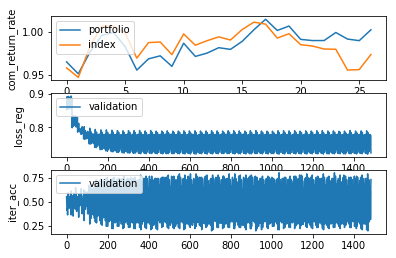

Epochs :  54 Iterations :  27 Loss :  0.7536679064785993 ACC :  0.49847495942204084 MCC :  nan Precision :  0.4919748934054816


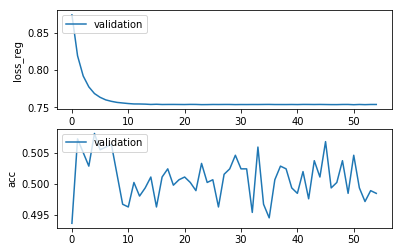

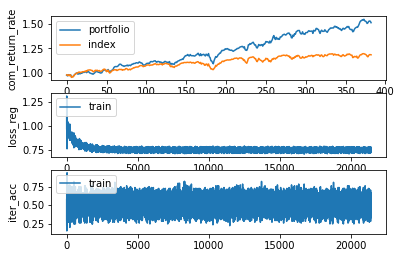

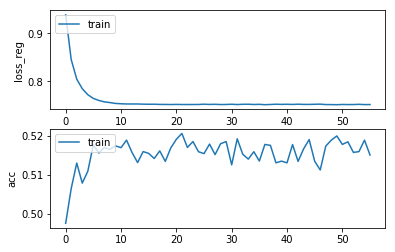

Epochs :  55 Iterations :  21448 Loss :  0.7517398945967771 ACC :  0.515128260648593 MCC :  0.02797781374650781 Precision :  0.5210054409313295
mode : validation


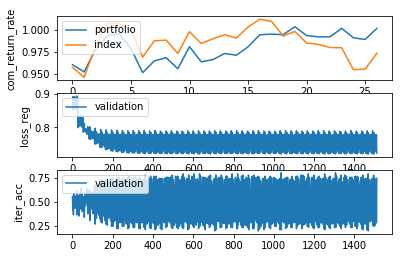

Epochs :  55 Iterations :  27 Loss :  0.7536063547487613 ACC :  0.5015250692764918 MCC :  nan Precision :  0.49218090320075


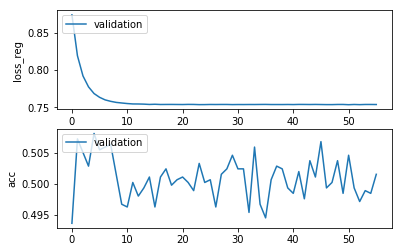

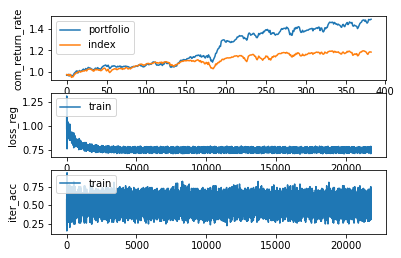

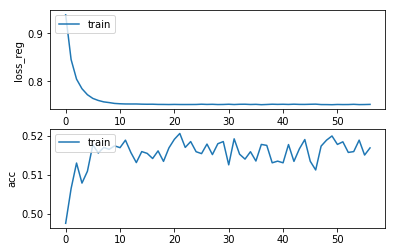

Epochs :  56 Iterations :  21831 Loss :  0.7520356951743442 ACC :  0.5169712954028157 MCC :  0.033694138516843386 Precision :  0.5225589682613122
mode : validation


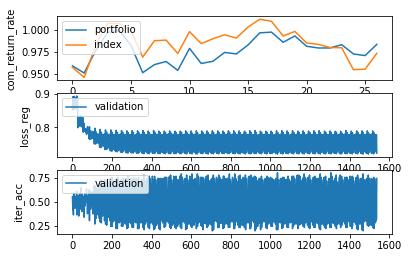

Epochs :  56 Iterations :  27 Loss :  0.7535550770936189 ACC :  0.4976034997789948 MCC :  nan Precision :  0.4913792370094193


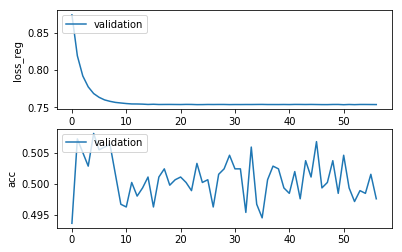

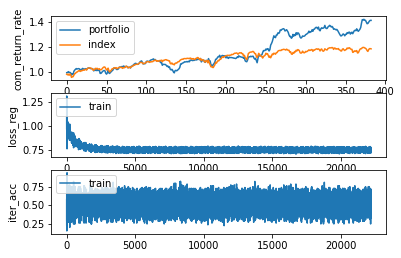

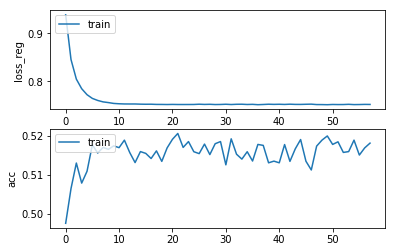

Epochs :  57 Iterations :  22214 Loss :  0.751911326581442 ACC :  0.5181999850444321 MCC :  0.031803242075889235 Precision :  0.5220729897951333
mode : validation


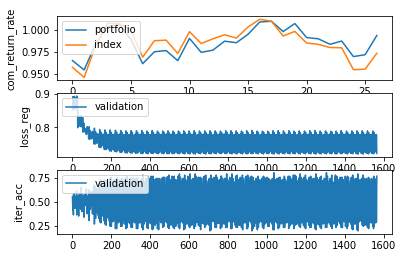

Epochs :  57 Iterations :  27 Loss :  0.7534820415355541 ACC :  0.5010893377992842 MCC :  nan Precision :  0.49308894015848637


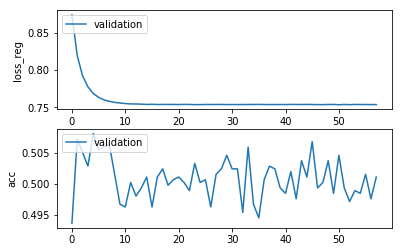

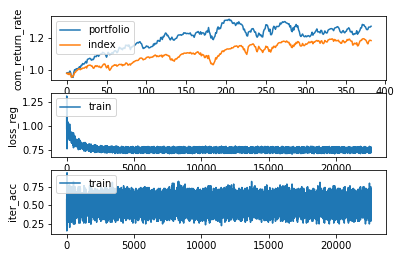

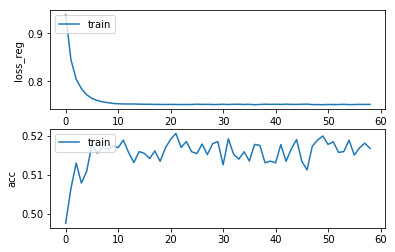

Epochs :  58 Iterations :  22597 Loss :  0.7520174468155006 ACC :  0.5168484263024816 MCC :  0.02949295757343268 Precision :  0.5210787294233126
mode : validation


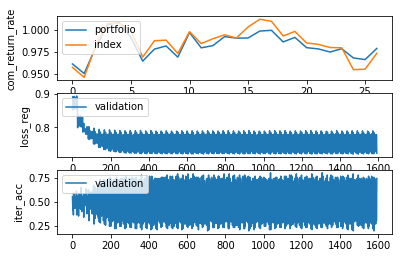

Epochs :  58 Iterations :  27 Loss :  0.7537466287612915 ACC :  0.49847495887014603 MCC :  nan Precision :  0.4936200176814088


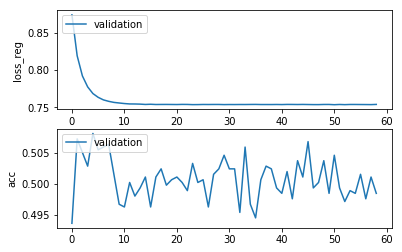

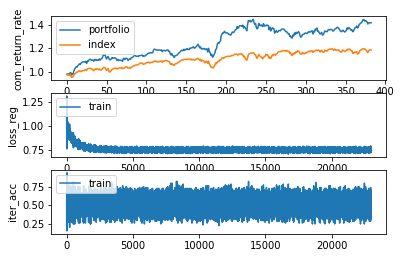

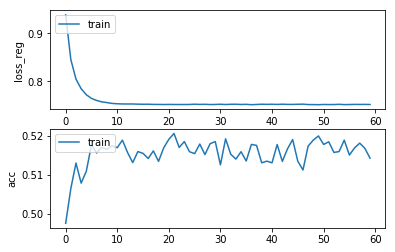

Epochs :  59 Iterations :  22980 Loss :  0.7517922252961301 ACC :  0.5143296121772836 MCC :  0.02770677997713043 Precision :  0.5213011407607062
mode : validation


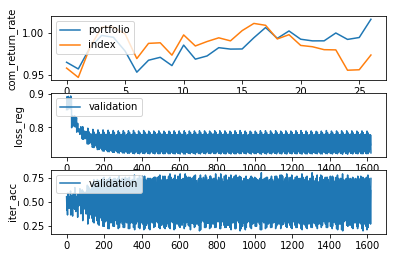

Epochs :  59 Iterations :  27 Loss :  0.7534405434573138 ACC :  0.5006536074258663 MCC :  nan Precision :  0.4930995758622885


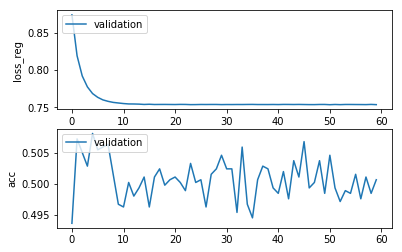

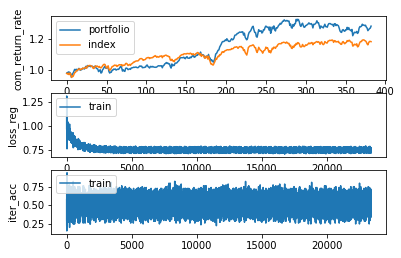

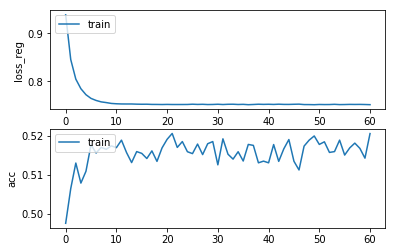

Epochs :  60 Iterations :  23363 Loss :  0.7514522615674271 ACC :  0.520657365261419 MCC :  0.03471241121842373 Precision :  0.5229908927701239
mode : validation


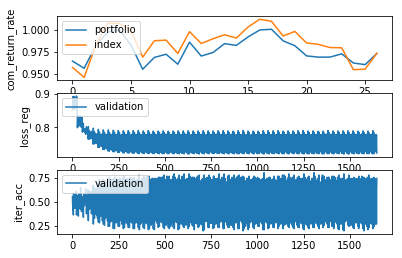

Epochs :  60 Iterations :  27 Loss :  0.753609836101532 ACC :  0.500217878708133 MCC :  nan Precision :  0.4933473589243712


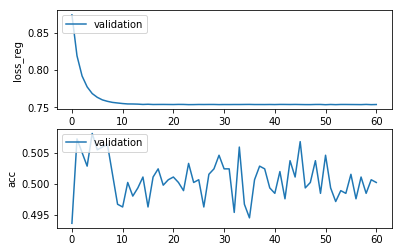

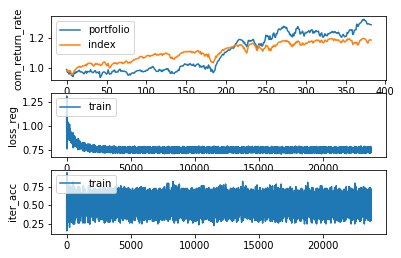

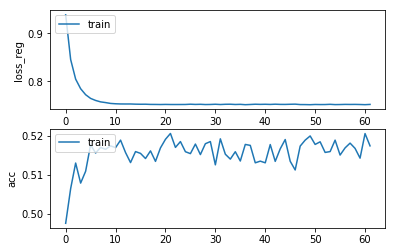

Epochs :  61 Iterations :  23746 Loss :  0.7519718158027211 ACC :  0.5174934890500559 MCC :  0.030090065631351626 Precision :  0.5215329141465476
mode : validation


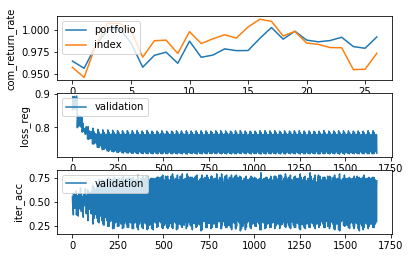

Epochs :  61 Iterations :  27 Loss :  0.7535643997015776 ACC :  0.49978214888660993 MCC :  nan Precision :  0.49420271455137815


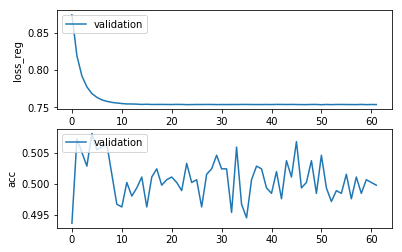

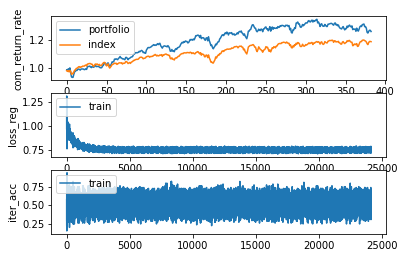

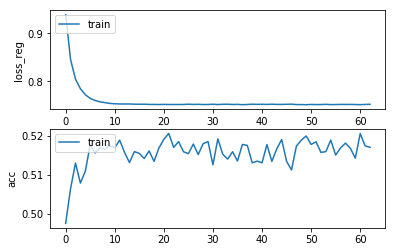

Epochs :  62 Iterations :  24129 Loss :  0.7521899834314152 ACC :  0.5171248815545214 MCC :  0.03439712944816234 Precision :  0.5233018887484587
mode : validation


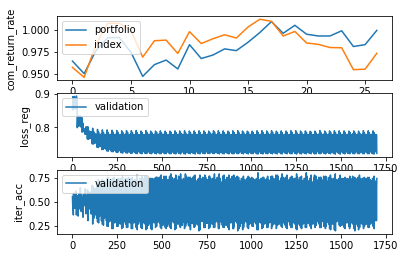

Epochs :  62 Iterations :  27 Loss :  0.7535476309281809 ACC :  0.4997821483347151 MCC :  nan Precision :  0.49228398425987474


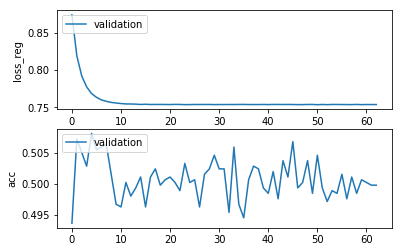

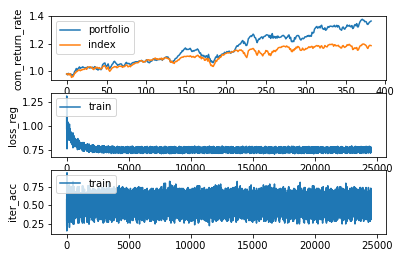

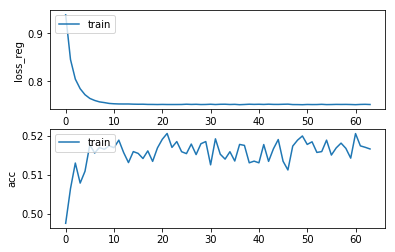

Epochs :  63 Iterations :  24512 Loss :  0.75178926685149 ACC :  0.5166948405787466 MCC :  0.030478240564640602 Precision :  0.5215700147551905
mode : validation


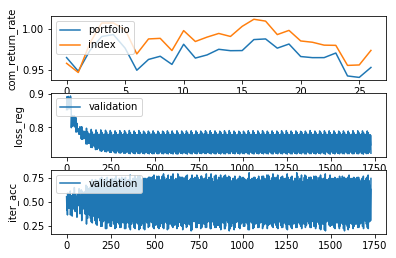

Epochs :  63 Iterations :  27 Loss :  0.7536073768580401 ACC :  0.5010893377992842 MCC :  nan Precision :  0.4932123855860145


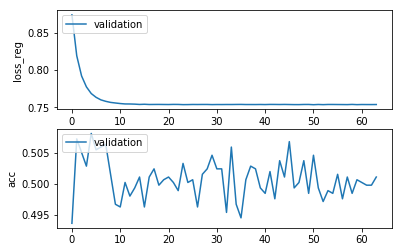

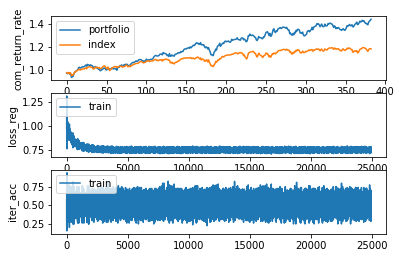

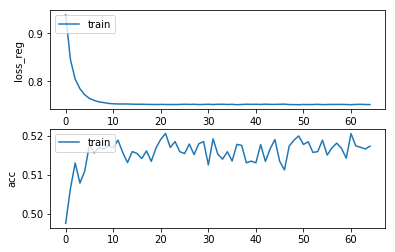

Epochs :  64 Iterations :  24895 Loss :  0.7516576714677536 ACC :  0.5174320541691843 MCC :  0.027932834457703344 Precision :  0.5206406396368698
mode : validation


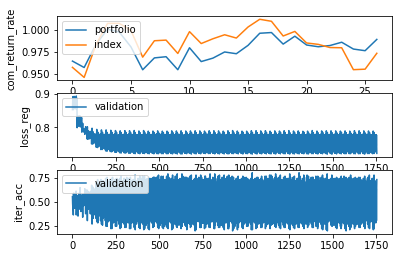

Epochs :  64 Iterations :  27 Loss :  0.7535971094060827 ACC :  0.5002178781562381 MCC :  nan Precision :  0.4917023240554112


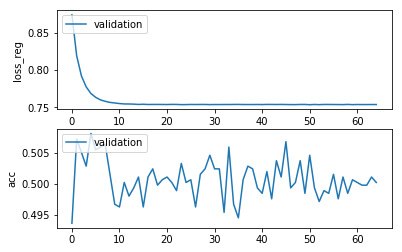

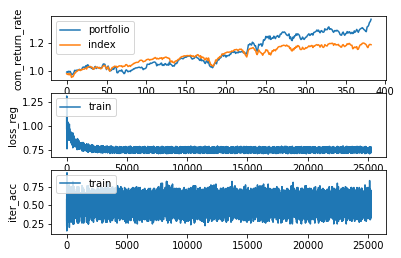

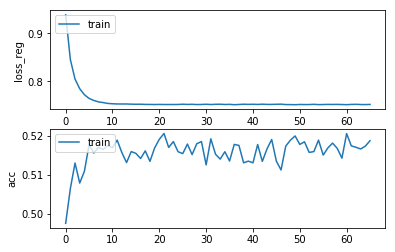

Epochs :  65 Iterations :  25278 Loss :  0.751946154057824 ACC :  0.5188143306239156 MCC :  0.03629365296853225 Precision :  0.5231940465257078
mode : validation


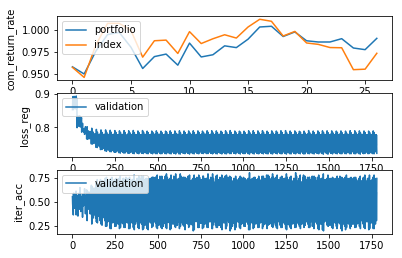

Epochs :  65 Iterations :  27 Loss :  0.7535094817479452 ACC :  0.501525068172702 MCC :  nan Precision :  0.4912599774974364


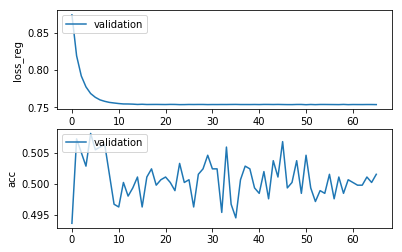

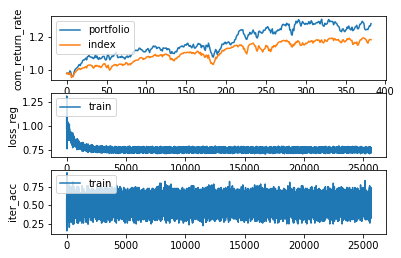

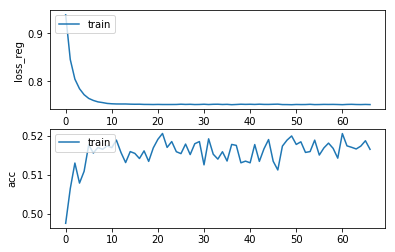

Epochs :  66 Iterations :  25661 Loss :  0.7516475830314676 ACC :  0.5166026886854097 MCC :  0.028794002711928543 Precision :  0.5217273121762914
mode : validation


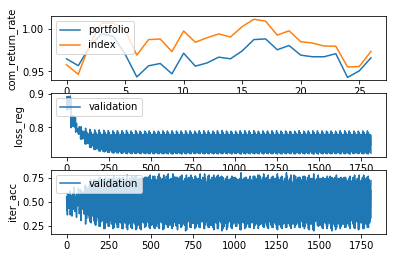

Epochs :  66 Iterations :  27 Loss :  0.7534890925442731 ACC :  0.5058823663879324 MCC :  nan Precision :  0.4947891956264222


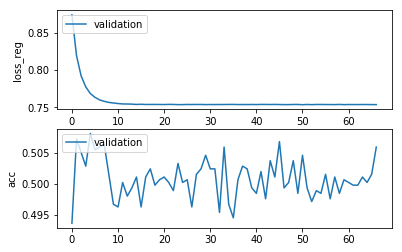

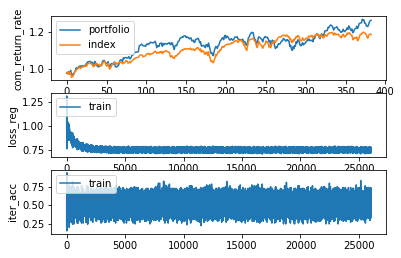

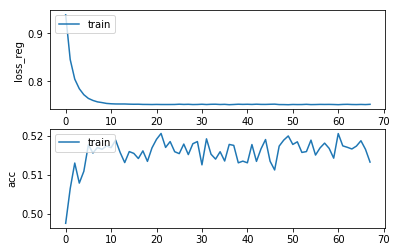

Epochs :  67 Iterations :  26044 Loss :  0.7521807026925349 ACC :  0.5133159423621454 MCC :  0.02190831860125566 Precision :  0.5183091205021965
mode : validation


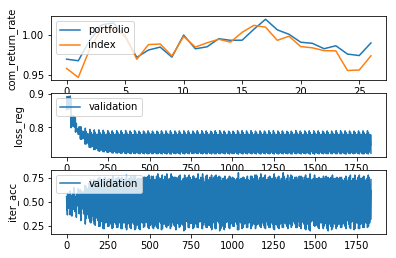

Epochs :  67 Iterations :  27 Loss :  0.7537100889064647 ACC :  0.5037037178322121 MCC :  nan Precision :  0.49134524828857845


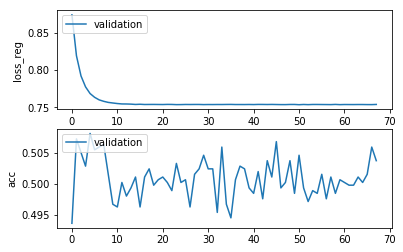

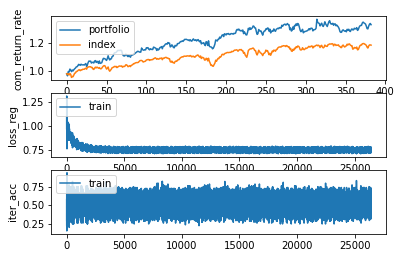

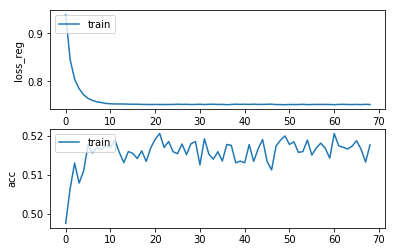

Epochs :  68 Iterations :  26427 Loss :  0.751744088242633 ACC :  0.5177392271729113 MCC :  0.02830387813351591 Precision :  0.5214511168289044
mode : validation


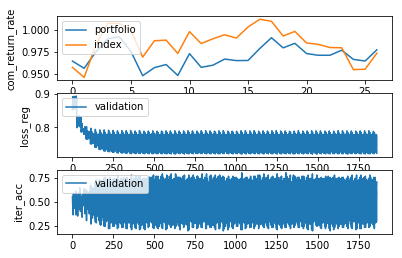

Epochs :  68 Iterations :  27 Loss :  0.7536333291618912 ACC :  0.5010893389030739 MCC :  nan Precision :  0.49316889482239884


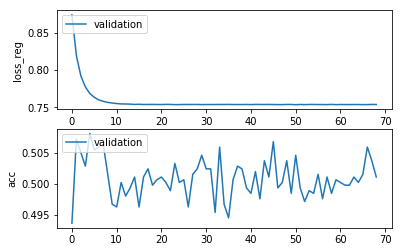

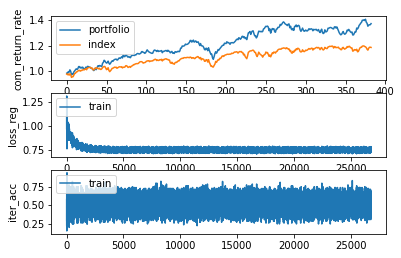

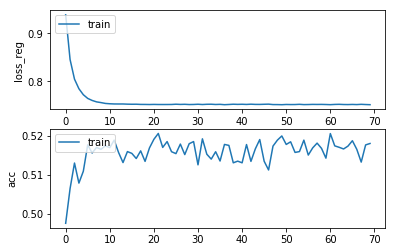

Epochs :  69 Iterations :  26810 Loss :  0.751410077819625 ACC :  0.5181078338903173 MCC :  0.028750963893891666 Precision :  0.5215849337647074
mode : validation


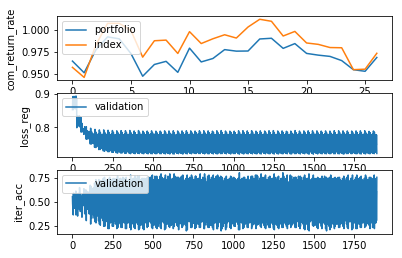

Epochs :  69 Iterations :  27 Loss :  0.7536699771881104 ACC :  0.49803922904862297 MCC :  nan Precision :  0.49121609419860224


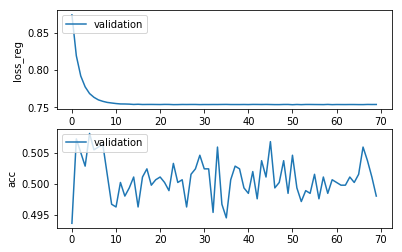

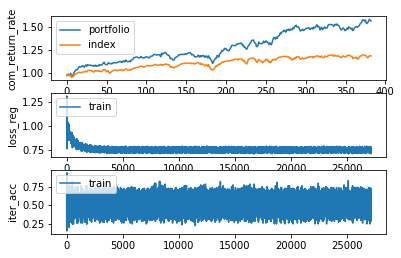

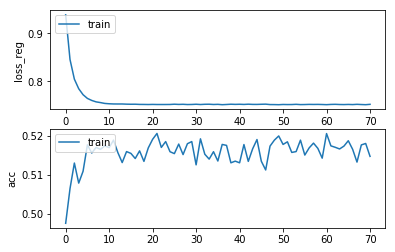

Epochs :  70 Iterations :  27193 Loss :  0.7521528243707303 ACC :  0.5147903712549036 MCC :  0.02831719503506979 Precision :  0.521470900873019
mode : validation


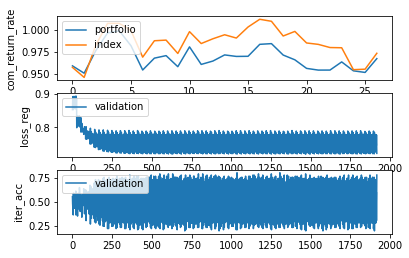

Epochs :  70 Iterations :  27 Loss :  0.7535712785191007 ACC :  0.4993464196169818 MCC :  nan Precision :  0.49081868292004976


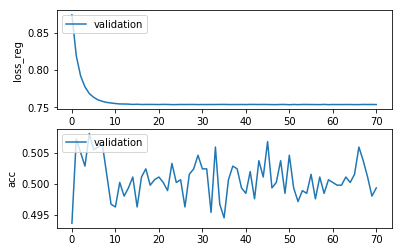

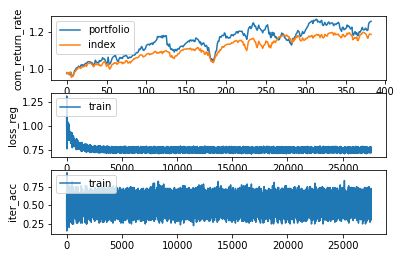

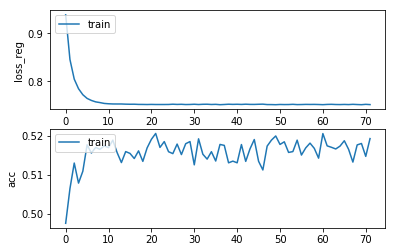

Epochs :  71 Iterations :  27576 Loss :  0.7515940983675168 ACC :  0.5193672413614338 MCC :  0.03309039234298624 Precision :  0.5223950676367115
mode : validation


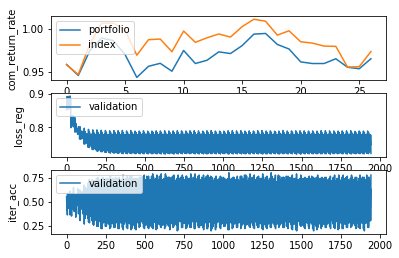

Epochs :  71 Iterations :  27 Loss :  0.7535968555344476 ACC :  0.5063180962094554 MCC :  nan Precision :  0.495617193342359


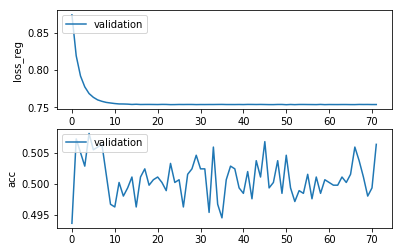

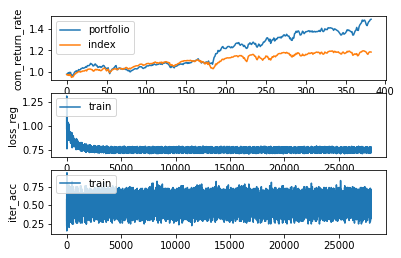

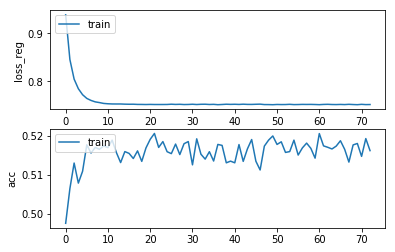

Epochs :  72 Iterations :  27959 Loss :  0.7517410219493796 ACC :  0.5162647978910889 MCC :  0.028159947881071436 Precision :  0.5206500159834291
mode : validation


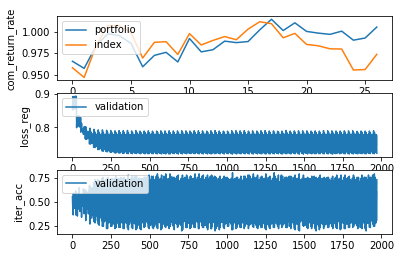

Epochs :  72 Iterations :  27 Loss :  0.7537845902972751 ACC :  0.5058823669398272 MCC :  nan Precision :  0.4957968653352172


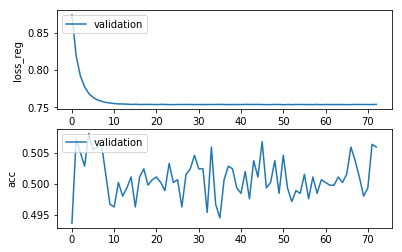

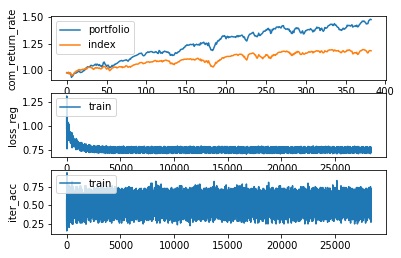

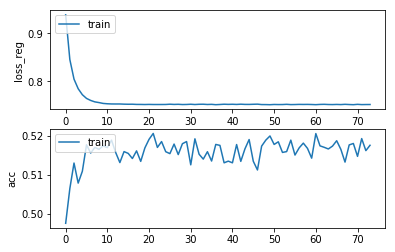

Epochs :  73 Iterations :  28342 Loss :  0.7517815697597773 ACC :  0.5176470748905102 MCC :  0.029771718873329918 Precision :  0.5209434146338748
mode : validation


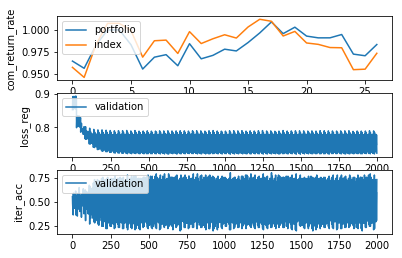

Epochs :  73 Iterations :  27 Loss :  0.7538395833086085 ACC :  0.49760349922709995 MCC :  nan Precision :  0.49145565768358884


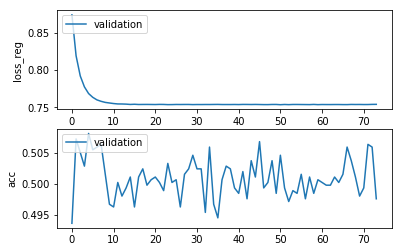

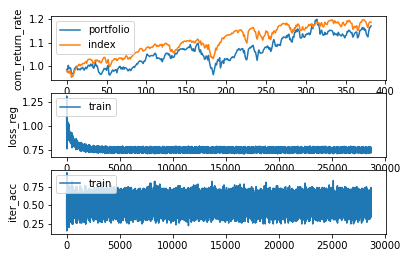

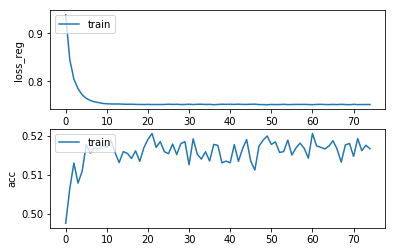

Epochs :  74 Iterations :  28725 Loss :  0.7518222562326775 ACC :  0.5167562746036769 MCC :  0.029735112820226728 Precision :  0.5214321935408343
mode : validation


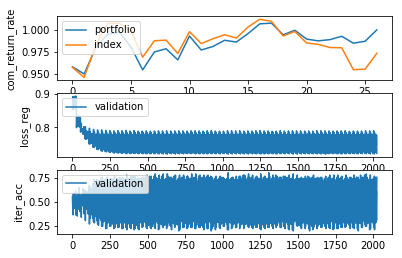

Epochs :  74 Iterations :  27 Loss :  0.7535501873051679 ACC :  0.500653608529656 MCC :  nan Precision :  0.4924477941736027


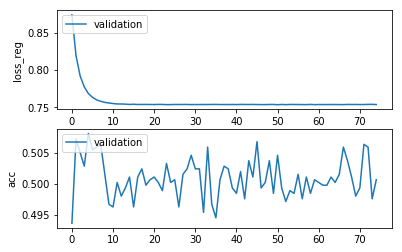

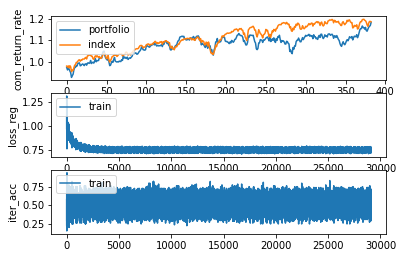

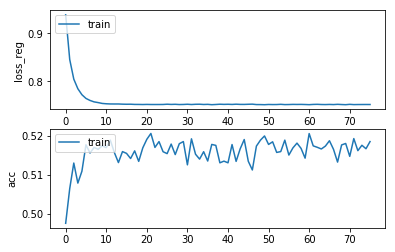

Epochs :  75 Iterations :  29108 Loss :  0.7517806959214473 ACC :  0.5185993099025895 MCC :  0.034390211136806174 Precision :  0.522888993766577
mode : validation


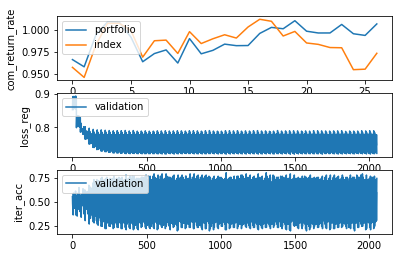

Epochs :  75 Iterations :  27 Loss :  0.7537217405107286 ACC :  0.49978214888660993 MCC :  nan Precision :  0.49103337553916154


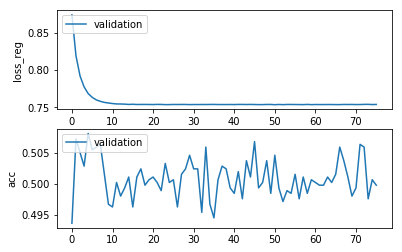

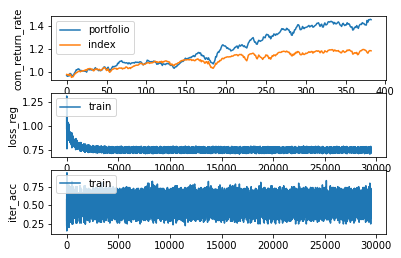

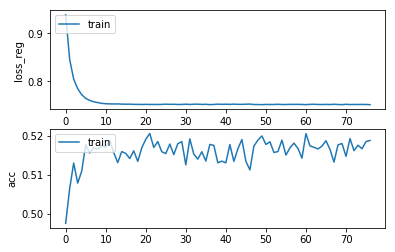

Epochs :  76 Iterations :  29491 Loss :  0.751266662974893 ACC :  0.5188757646099394 MCC :  0.03112262772674631 Precision :  0.5219448519330813
mode : validation


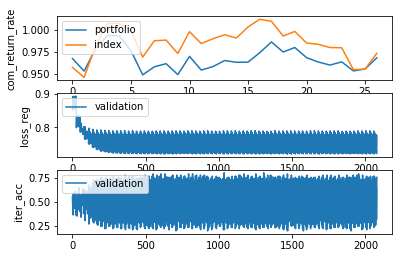

Epochs :  76 Iterations :  27 Loss :  0.753355637744621 ACC :  0.5054466365664093 MCC :  nan Precision :  0.4960251456057584


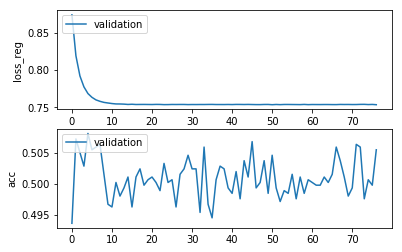

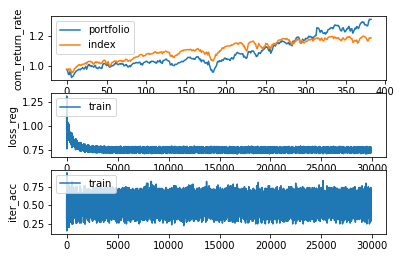

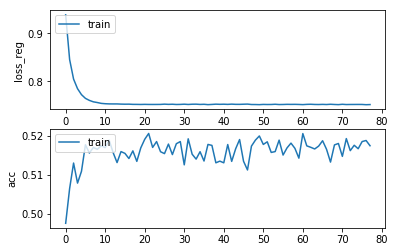

Epochs :  77 Iterations :  29874 Loss :  0.7515484528815466 ACC :  0.5175242059458018 MCC :  0.026660618187152044 Precision :  0.5206899554456533
mode : validation


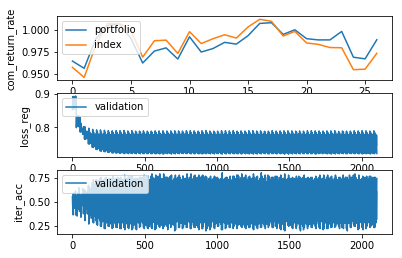

Epochs :  77 Iterations :  27 Loss :  0.7535120292946145 ACC :  0.5041394465499454 MCC :  nan Precision :  0.4941788482721205


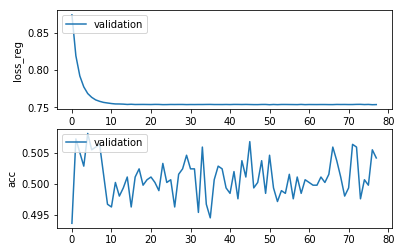

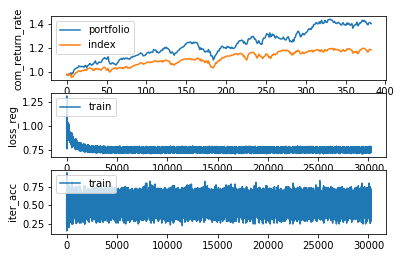

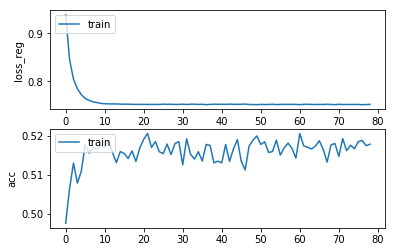

Epochs :  78 Iterations :  30257 Loss :  0.7519867904192474 ACC :  0.5179235303370822 MCC :  0.035987684134498495 Precision :  0.5229506522961759
mode : validation


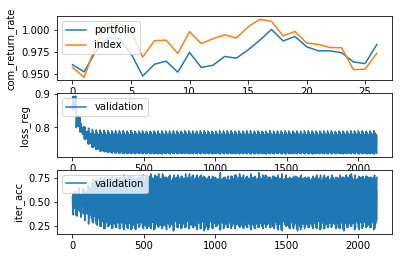

Epochs :  78 Iterations :  27 Loss :  0.7535387277603149 ACC :  0.5045751774752582 MCC :  nan Precision :  0.49400175942314994


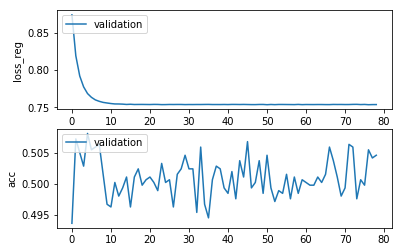

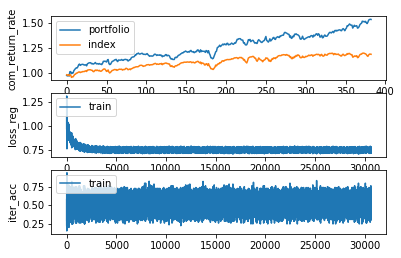

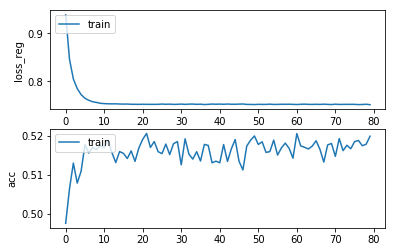

Epochs :  79 Iterations :  30640 Loss :  0.7510600597366651 ACC :  0.519981585190128 MCC :  0.03487605727782264 Precision :  0.5231712195662388
mode : validation


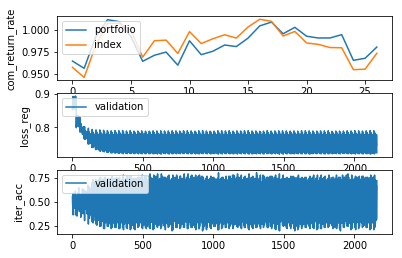

Epochs :  79 Iterations :  27 Loss :  0.7535383855855023 ACC :  0.5041394465499454 MCC :  nan Precision :  0.49383773233879497


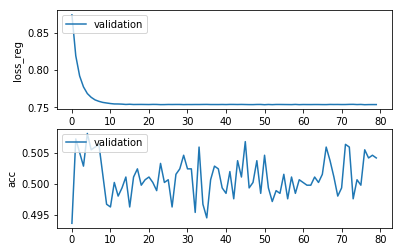

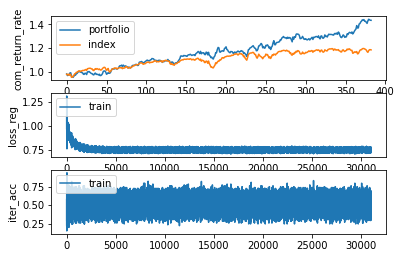

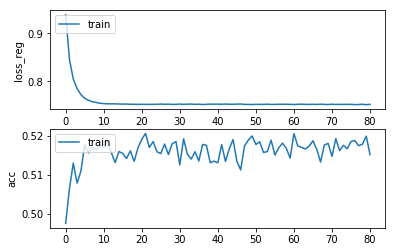

Epochs :  80 Iterations :  31023 Loss :  0.7518201003497947 ACC :  0.5152511293987693 MCC :  0.024757015550455598 Precision :  0.5205662747256594
mode : validation


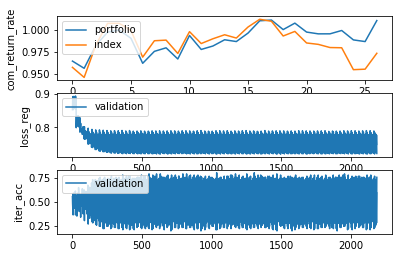

Epochs :  80 Iterations :  27 Loss :  0.753589012004711 ACC :  0.49978214888660993 MCC :  nan Precision :  0.49301726605605195


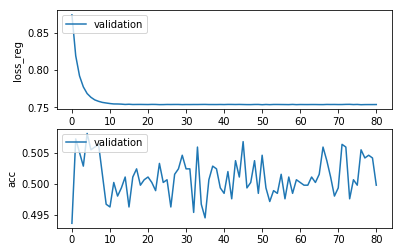

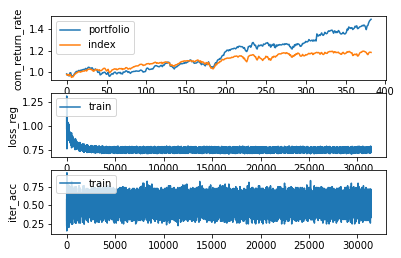

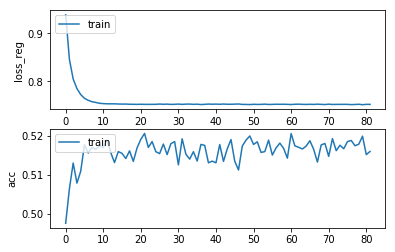

Epochs :  81 Iterations :  31406 Loss :  0.7517505884170532 ACC :  0.5160497780257043 MCC :  0.029269644156050947 Precision :  0.520747902698562
mode : validation


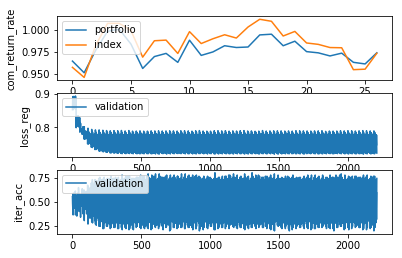

Epochs :  81 Iterations :  27 Loss :  0.7538403272628784 ACC :  0.49847495887014603 MCC :  nan Precision :  0.49164030162824524


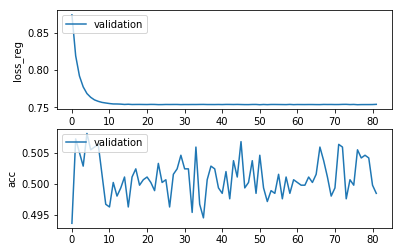

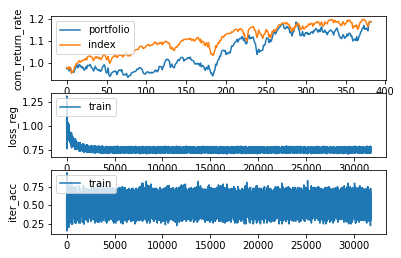

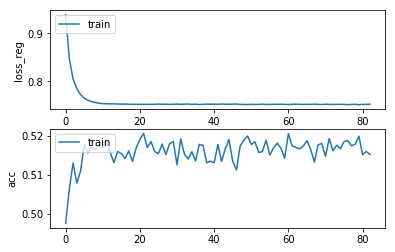

Epochs :  82 Iterations :  31789 Loss :  0.7521706889565869 ACC :  0.5152818469948308 MCC :  0.027497937286992413 Precision :  0.520854800458093
mode : validation


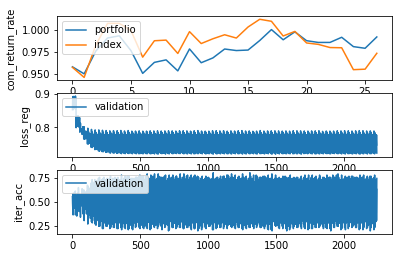

Epochs :  82 Iterations :  27 Loss :  0.7536592593899479 ACC :  0.49760349922709995 MCC :  nan Precision :  0.4906114162532268


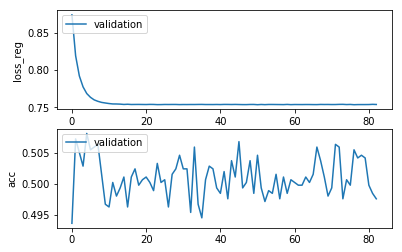

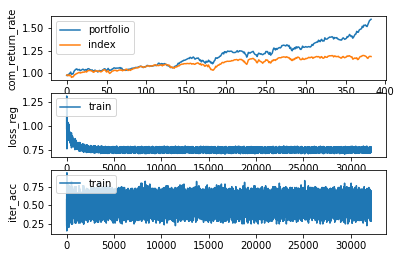

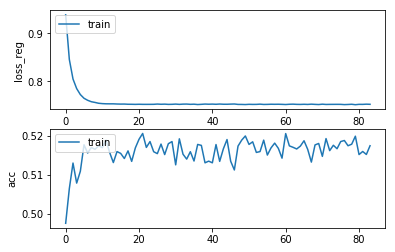

Epochs :  83 Iterations :  32172 Loss :  0.7518858338460599 ACC :  0.5175242066850239 MCC :  0.03167509054886688 Precision :  0.5220643728679684
mode : validation


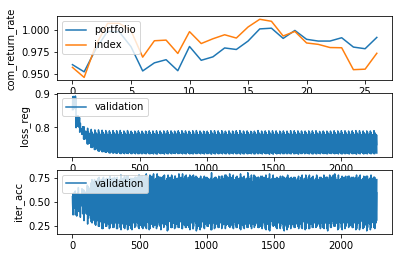

Epochs :  83 Iterations :  27 Loss :  0.7535912902266891 ACC :  0.502396528367643 MCC :  nan Precision :  0.49399230532624105


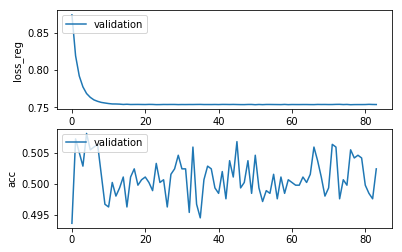

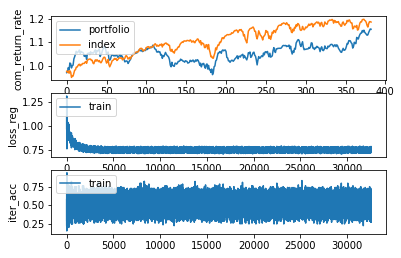

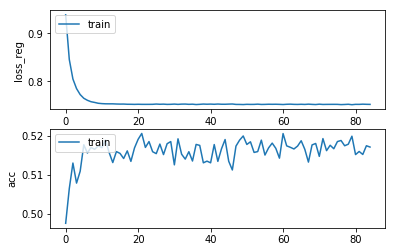

Epochs :  84 Iterations :  32555 Loss :  0.7517153897733664 ACC :  0.5171863163575803 MCC :  0.03130513912020616 Precision :  0.5220142718764416
mode : validation


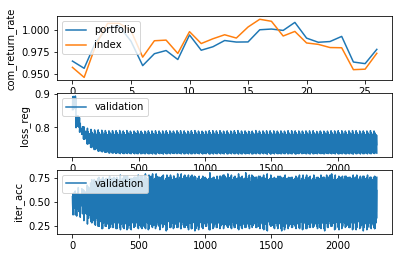

Epochs :  84 Iterations :  27 Loss :  0.7536783836506031 ACC :  0.500217878708133 MCC :  nan Precision :  0.4928619041349049


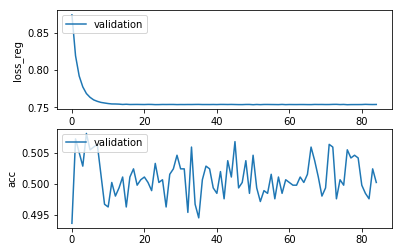

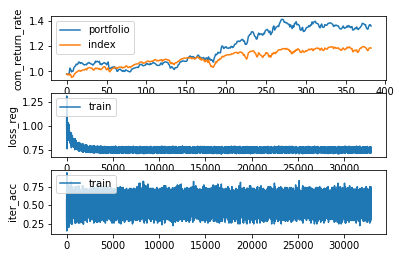

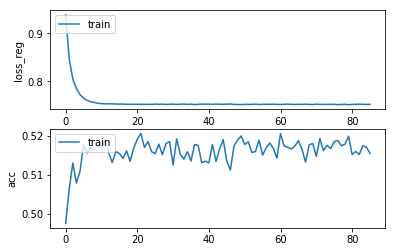

Epochs :  85 Iterations :  32938 Loss :  0.7517861168316077 ACC :  0.515527585000967 MCC :  0.029193050847674522 Precision :  0.521125004176955
mode : validation


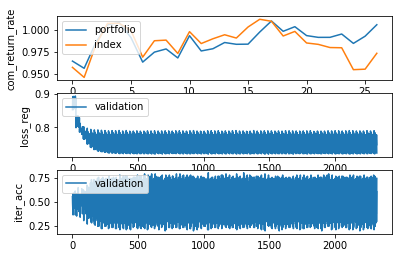

Epochs :  85 Iterations :  27 Loss :  0.7536978743694447 ACC :  0.49891068869166905 MCC :  nan Precision :  0.49046931270923877


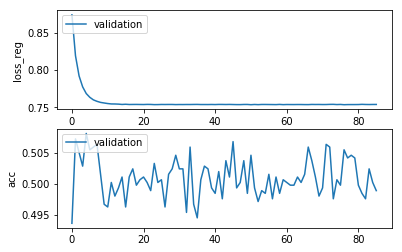

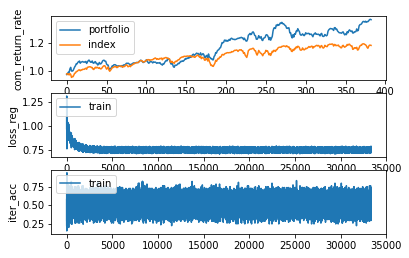

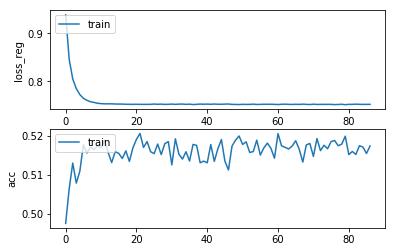

Epochs :  86 Iterations :  33321 Loss :  0.751804067322853 ACC :  0.5174627720375907 MCC :  0.03225543221179761 Precision :  0.5223454339989017
mode : validation


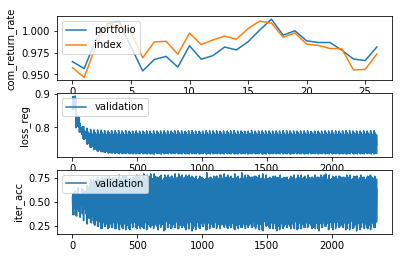

Epochs :  86 Iterations :  27 Loss :  0.7535290541472258 ACC :  0.4967320395840539 MCC :  nan Precision :  0.4907744118460902


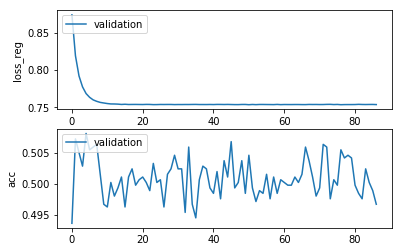

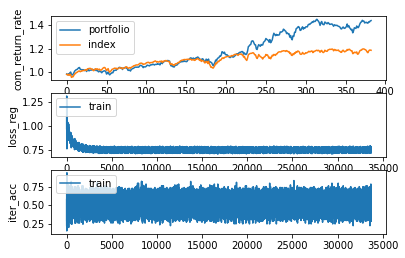

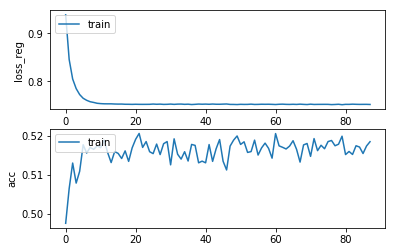

Epochs :  87 Iterations :  33704 Loss :  0.7515502151870229 ACC :  0.518568592306528 MCC :  0.033188362389452775 Precision :  0.5225556956229649
mode : validation


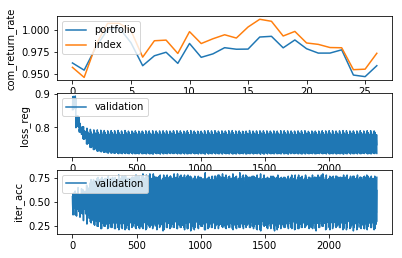

Epochs :  87 Iterations :  27 Loss :  0.7536835626319602 ACC :  0.4967320395840539 MCC :  nan Precision :  0.49216656724887864


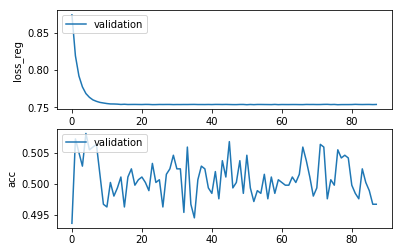

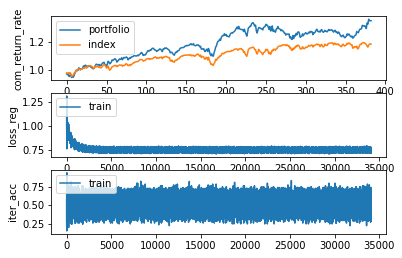

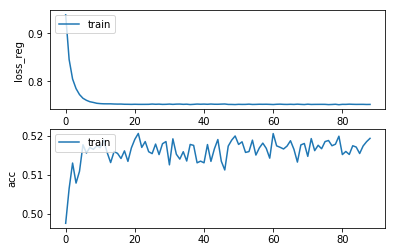

Epochs :  88 Iterations :  34087 Loss :  0.7516543077737793 ACC :  0.5194286756198027 MCC :  0.03615675146181462 Precision :  0.523326829022317
mode : validation


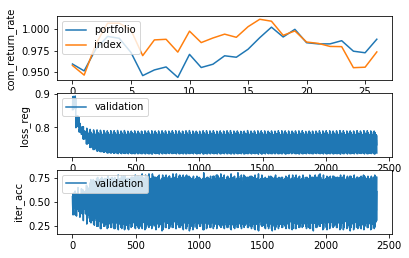

Epochs :  88 Iterations :  27 Loss :  0.7536638180414835 ACC :  0.5037037167284224 MCC :  nan Precision :  0.4930127882571132


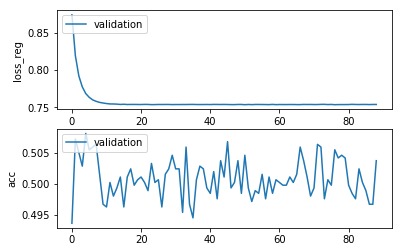

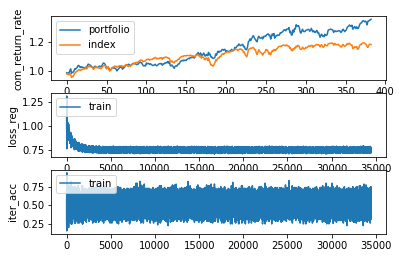

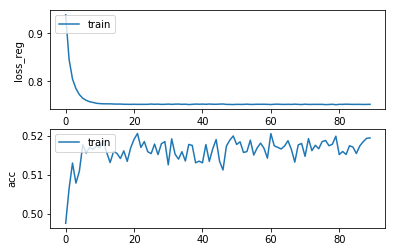

Epochs :  89 Iterations :  34470 Loss :  0.7518597383723247 ACC :  0.5195515446812303 MCC :  0.03408765855264138 Precision :  0.5223435871011284
mode : validation


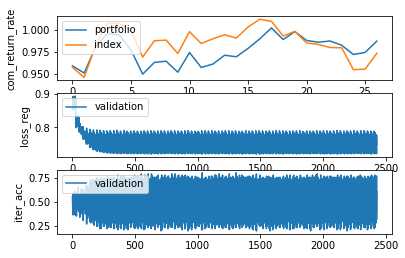

Epochs :  89 Iterations :  27 Loss :  0.7535951910195527 ACC :  0.5032679874587942 MCC :  nan Precision :  0.49183626514342094


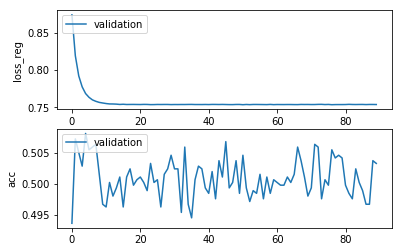

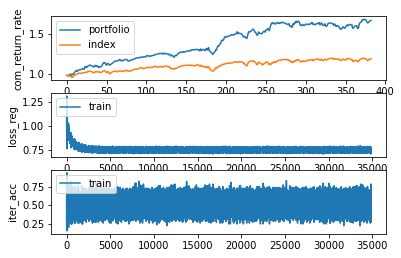

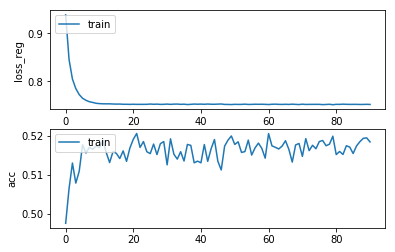

Epochs :  90 Iterations :  34853 Loss :  0.7515923880410257 ACC :  0.5185071576980013 MCC :  0.035954713122615244 Precision :  0.5235804343066001
mode : validation


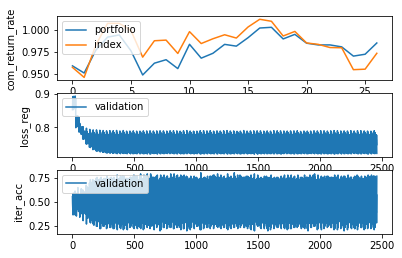

Epochs :  90 Iterations :  27 Loss :  0.7537553266242698 ACC :  0.4989106897954588 MCC :  nan Precision :  0.49059869307610726


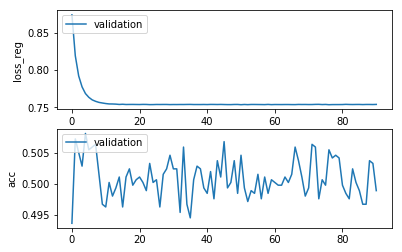

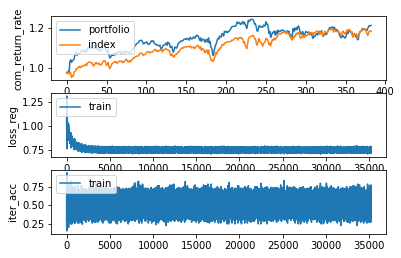

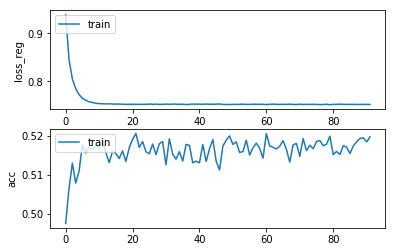

Epochs :  91 Iterations :  35236 Loss :  0.7516944050477627 ACC :  0.519827998727171 MCC :  0.03350023751623695 Precision :  0.5226830400808595
mode : validation


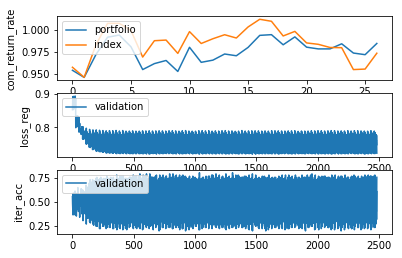

Epochs :  91 Iterations :  27 Loss :  0.7536074806142736 ACC :  0.500217878708133 MCC :  nan Precision :  0.49199006313251126


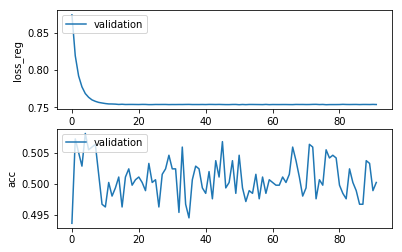

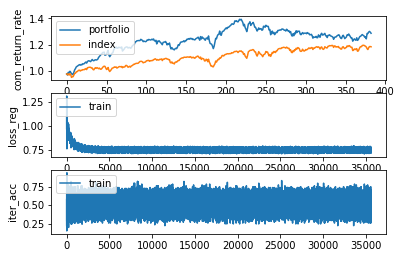

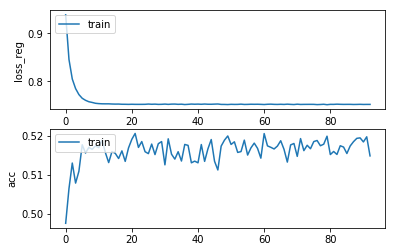

Epochs :  92 Iterations :  35619 Loss :  0.7516954600344128 ACC :  0.5149132400050799 MCC :  0.028188259338998958 Precision :  0.5207410114561998
mode : validation


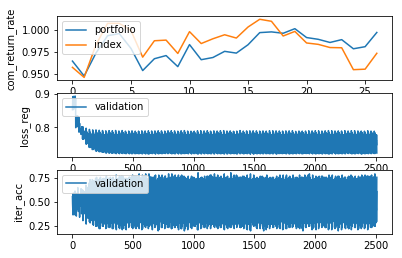

Epochs :  92 Iterations :  27 Loss :  0.753492929317333 ACC :  0.5063180967613503 MCC :  nan Precision :  0.4958750613861614


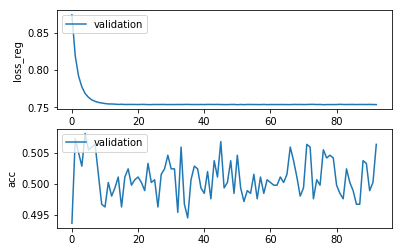

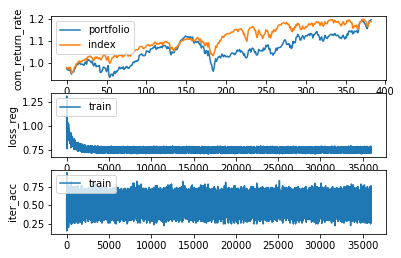

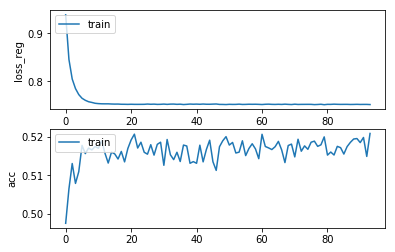

Epochs :  93 Iterations :  36002 Loss :  0.7513634560936113 ACC :  0.5208723860605579 MCC :  0.03896378957047601 Precision :  0.5239265874738248
mode : validation


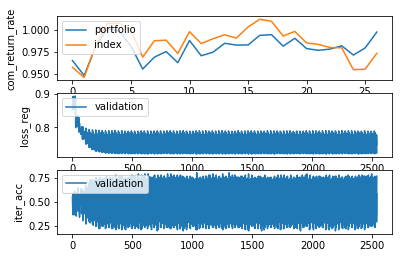

Epochs :  93 Iterations :  27 Loss :  0.7537351471406443 ACC :  0.5002178792600278 MCC :  nan Precision :  0.49125464591715073


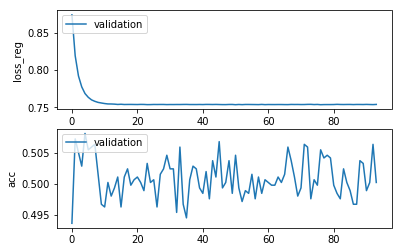

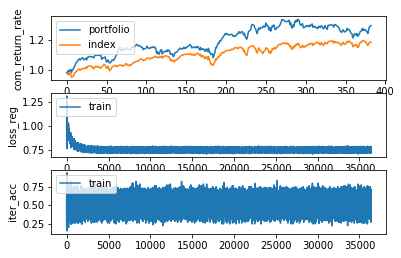

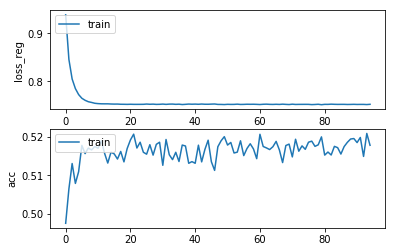

Epochs :  94 Iterations :  36385 Loss :  0.7518780250150915 ACC :  0.5178006604975259 MCC :  0.03285740342905487 Precision :  0.5222985852003953
mode : validation


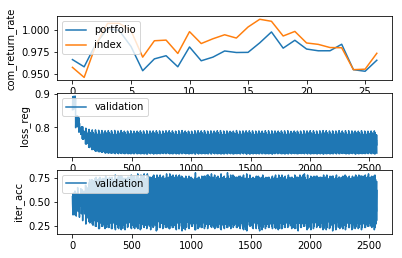

Epochs :  94 Iterations :  27 Loss :  0.7536364153579429 ACC :  0.49978214778282026 MCC :  nan Precision :  0.4930265102949407


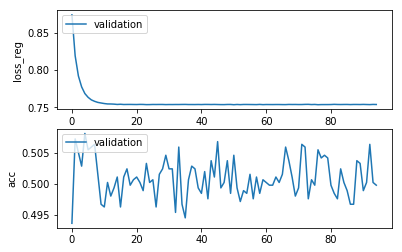

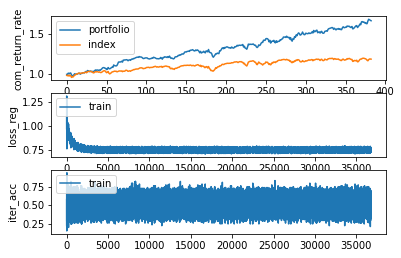

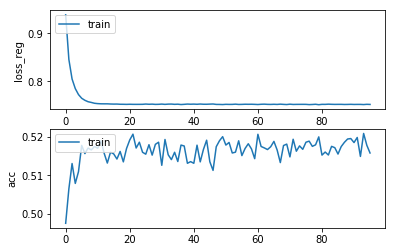

Epochs :  95 Iterations :  36768 Loss :  0.7516111435840398 ACC :  0.5158040405642582 MCC :  0.030310799334594594 Precision :  0.5216686010175913
mode : validation


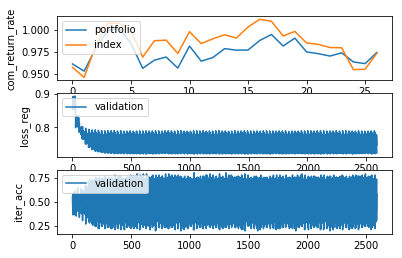

Epochs :  95 Iterations :  27 Loss :  0.7536929029005545 ACC :  0.49847495942204084 MCC :  nan Precision :  0.491296549845073


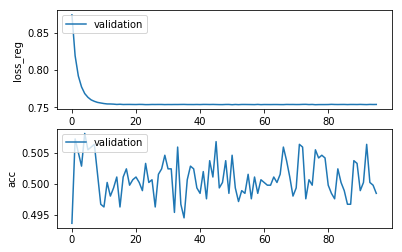

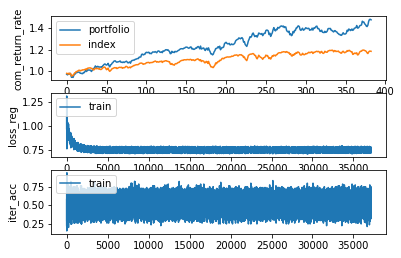

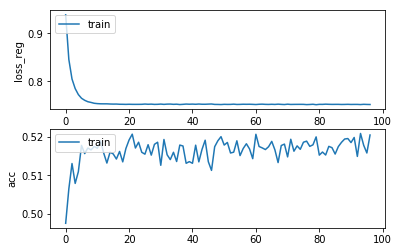

Epochs :  96 Iterations :  37151 Loss :  0.7514548034020566 ACC :  0.520473062175061 MCC :  0.036895904048983075 Precision :  0.5233887012795042
mode : validation


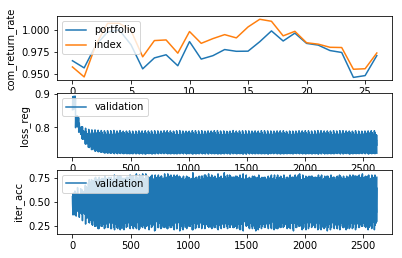

Epochs :  96 Iterations :  27 Loss :  0.7535309394200643 ACC :  0.5019607990980148 MCC :  nan Precision :  0.49136286118516215


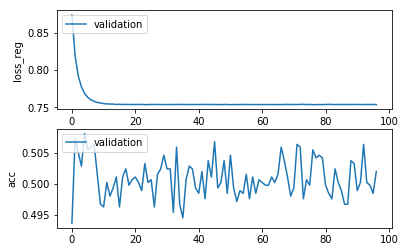

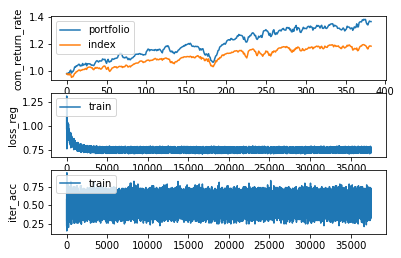

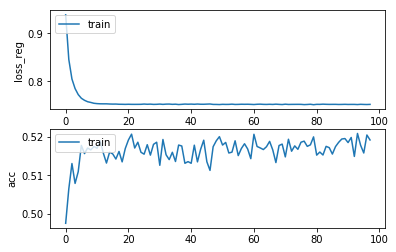

Epochs :  97 Iterations :  37534 Loss :  0.7517128217936184 ACC :  0.5191829377303858 MCC :  0.03439295924525202 Precision :  0.5227478507361508
mode : validation


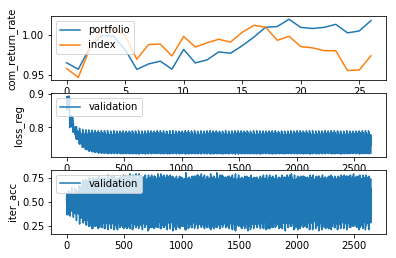

Epochs :  97 Iterations :  27 Loss :  0.7537199126349555 ACC :  0.49673204013594874 MCC :  nan Precision :  0.49073648977058903


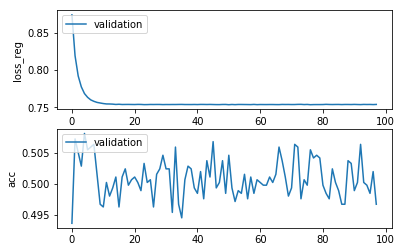

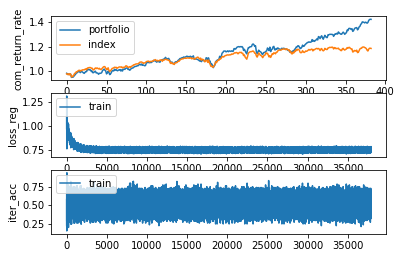

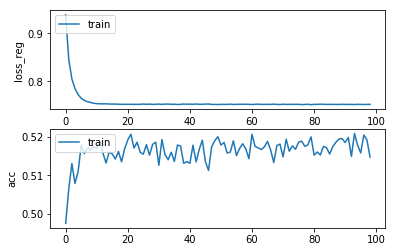

Epochs :  98 Iterations :  37917 Loss :  0.7517706817186222 ACC :  0.5147289363740318 MCC :  0.030502863921797727 Precision :  0.5214318179771031
mode : validation


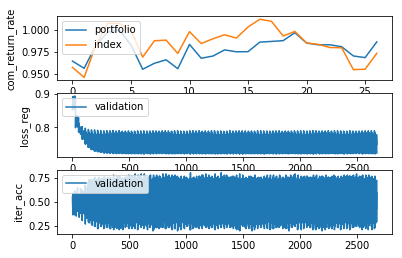

Epochs :  98 Iterations :  27 Loss :  0.7537000466276098 ACC :  0.4989106892435639 MCC :  nan Precision :  0.49239288008323423


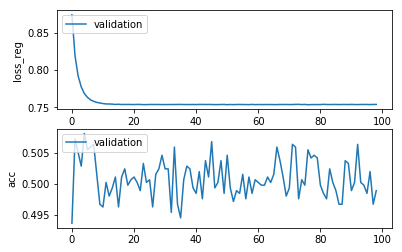

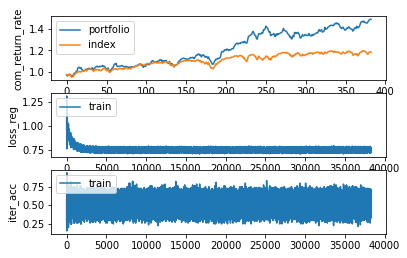

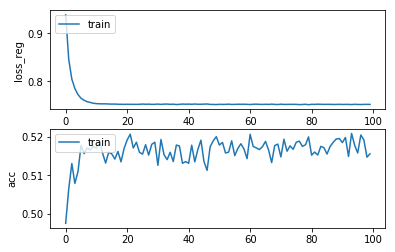

Epochs :  99 Iterations :  38300 Loss :  0.7516453178993404 ACC :  0.5155890194149615 MCC :  0.025324417424069684 Precision :  0.5198013344268964
mode : validation


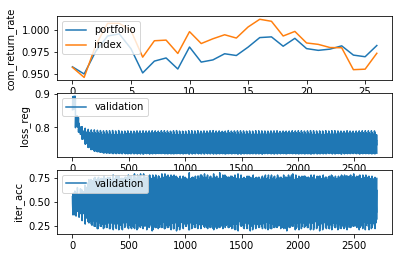

Epochs :  99 Iterations :  27 Loss :  0.7536087786709821 ACC :  0.5032679880106891 MCC :  nan Precision :  0.49422666106235097


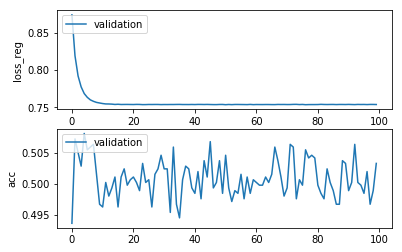

In [85]:
model.train()

mode : test
epoch :  0 time_idx :  0 loss_reg :  tensor(0.7356, grad_fn=<AddBackward0>) acc :  tensor(0.6941) mcc :  tensor(0.1135) precision :  tensor(0.9167)


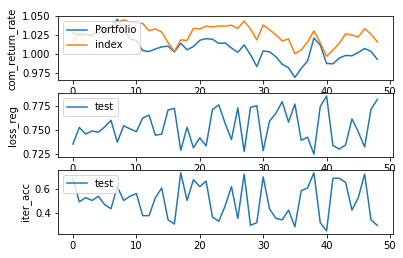

Epochs :  0 Iterations :  49 Loss :  0.7533617238609158 ACC :  0.5010804476178422 MCC :  0.029944194898921615 Precision :  0.48230521570967166


In [87]:
model.test()

In [ ]:
model.train()

In [ ]:
model.test()

In [ ]:
model.train() # dropout 없음, epochs = 5

In [ ]:
model.train() # dropout 0.15 적용

In [ ]:
model.test()

In [ ]:
model.test()

In [ ]:
model.train()

In [ ]:
model.train()

In [ ]:
model.test()

In [ ]:
model.epoch_losses

In [ ]:
model.train()

In [ ]:
model.test()

In [ ]:
model.return_rate.shape

In [ ]:
ㄴmodel.train()

In [ ]:
model.train()